# Testing predictive performance of learnt representations

## 1. Preamble

Import the relevant packages/modules.  Note that, to save space, we have exported the classes defined in ``grid-world.ipynb`` into ``src``.

In [1]:
import os

import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from enum import Enum

import pandas as pd

import time
import pickle
from datetime import datetime
from IPython import display

try:
    import seaborn as sns
    sns.set()
    print("Set seaborn plotting defaults.")
except:
    print("seaborn not found.")

Set seaborn plotting defaults.


In [2]:
from src.coders import Encoder, Decoder
from src.environments import GridWorld, LatentWorld
from src.representations import Representation
from src.utils import mk_dir

## 2. Learning (dis)entangled representations with a ``RepresentationLearner``

Now, we want to learn representations with varying degrees of disentanglement.  To do this, we wrap up all of the training and testing into a new class; ``RepresentationLearner``.  This contains the following functions:

- ``__init__`` : Set's up the environments, networks and folders to train and test the learnt representations.
- ``learn`` : Trains the representations with specified regularisations.
- ``plot_training`` : Plot's the learning curves for loss, entanglement and orthogonality.
- ``_calc_entanglement`` : A method for calculating the entanglement.
- ``save``/``load`` : Saves/loades the state of the ``RepresentationLearner``.
- ``test`` : Tests the long term predictions of the representations.

There is a lot wrapped up in this class, so rather than give details now, let's just define it below and then demonstrate each of creating/training/plotting/saving/loading/testing in turn.

In [15]:
class LossTarget(Enum):
    MIN = 0
    MAX = 1
    VALUE = 2

class RepresentationLearner():
    
    def __init__(self,
                 grid_dim=5,
                 latent_dim=4,
                 decoder_hid_dim=[16],
                 encoder_hid_dim=[16],
                 lr_dec=1e-2,
                 lr_rep=1e-2,
                 lr_enc=1e-2,
                 ent_loss_weight=1e-2,
                 ent_loss_target = LossTarget.MIN,
                 exp_name=None):
                      
            
        self.decoder_hid_dim = decoder_hid_dim
        self.encoder_hid_dim = encoder_hid_dim
        self.grid_dim = grid_dim
        self.latent_dim = latent_dim
        self.lr_dec = lr_dec
        self.lr_enc = lr_enc
        self.lr_rep = lr_rep
        
        # Make the worlds, decoder and optimizers ready to train. Note: these are reset at the start of training anyway
        self.obs_env = GridWorld(dim=self.grid_dim)
        self.lat_env = LatentWorld(dim=self.latent_dim, n_actions=self.obs_env.action_space.n)

        self.decoder = Decoder(n_in=sum(self.lat_env.observation_space.shape),
                               n_out=sum(self.obs_env.observation_space.shape),
                               n_hid=self.decoder_hid_dim)

        self.encoder = Encoder(n_in=sum(self.obs_env.observation_space.shape),
                               n_out=sum(self.lat_env.observation_space.shape),
                               n_hid=self.encoder_hid_dim)

        self.optimizer_dec = optim.Adam(self.decoder.parameters(),
                                        lr=self.lr_dec,
                                        weight_decay=0)

        self.optimizer_enc = optim.Adam(self.encoder.parameters(),
                                        lr=self.lr_enc,
                                        weight_decay=0)

        self.optimizer_rep = optim.Adam(self.lat_env.get_representation_params(),
                                        lr=self.lr_rep,
                                        weight_decay=0)
        
        self.ent_loss_weight = ent_loss_weight
        
        if type(ent_loss_target) is LossTarget:
            if ent_loss_target is LossTarget.VALUE:
                raise ValueError(
                    "The loss targets should be either LossTarget.MIN, LossTarget.MAX or a numerical value."
                )
            self.ent_loss_target = self.ent_loss_target_type = ent_loss_target
        else:
            self.ent_loss_target = ent_loss_target
            self.ent_loss_target_type = LossTarget.VALUE
            

        # Set up lists to save training data.
        self.losses = []
        self.entanglement_loss = []
        
        # Create directories to save results.
        self.exp_name = exp_name
        if self.exp_name is None:
            self.exp_name = datetime.now().strftime("%y-%d-%m_%H-%M-%S") 
            
        self.save_folder = os.path.join("_data", self.exp_name)
        self.train_folder = os.path.join(self.save_folder,"train")
        self.test_folder = os.path.join(self.save_folder,"test")

        mk_dir(self.save_folder, quite=True)
        mk_dir(self.train_folder, quite=True)
        mk_dir(self.test_folder, quite=True)
        
    def learn(self, n_sgd_steps, batch_eps=4, ep_steps=10, log_freq=10):
        
        rec_loss = 1
        
        #Restart from scratch if we get stuck in a local minimum
        while rec_loss > 0.01:
            
            # Make the worlds, decoder and optimizers ready to train.
            
            self.obs_env = GridWorld(dim=self.grid_dim)
            self.lat_env = LatentWorld(dim=self.latent_dim, n_actions=self.obs_env.action_space.n)

            self.decoder = Decoder(n_in=sum(self.lat_env.observation_space.shape),
                                   n_out=sum(self.obs_env.observation_space.shape),
                                   n_hid=self.decoder_hid_dim)

            self.encoder = Encoder(n_in=sum(self.obs_env.observation_space.shape),
                                   n_out=sum(self.lat_env.observation_space.shape),
                                   n_hid=self.encoder_hid_dim)

            self.optimizer_dec = optim.Adam(self.decoder.parameters(),
                                            lr=self.lr_dec,
                                            weight_decay=0)

            self.optimizer_enc = optim.Adam(self.encoder.parameters(),
                                            lr=self.lr_enc,
                                            weight_decay=0)

            self.optimizer_rep = optim.Adam(self.lat_env.get_representation_params(),
                                            lr=self.lr_rep,
                                            weight_decay=0)

            i = 0
            t_start = time.time()
            t_0 = t_start

            self.decoder.train()

            while i < n_sgd_steps:

                loss = torch.zeros(1)

                for _ in range(batch_eps):
                    t_ep = -1
                    while t_ep < ep_steps:
                        if t_ep == -1:
                            obs_x = self.obs_env.reset(ball_coordinates=[random.randrange(5), random.randrange(5)])
                            obs_z = self.lat_env.reset(state=self.encoder(obs_x))
                        else:
                            action = self.obs_env.action_space.sample().item()
                            obs_x = self.obs_env.step(action)
                            obs_z = self.lat_env.step(action)

                        t_ep += 1         

                        obs_x_recon = self.decoder(obs_z)
                        (obs_x_recon==obs_x_recon.max()).float()

                        loss += F.binary_cross_entropy(obs_x_recon, obs_x)

                loss /= (ep_steps*batch_eps)
                rec_loss = loss.item()

                ent_loss = self._calc_entanglement()
                if self.ent_loss_target_type == LossTarget.MIN:
                    reg_loss = ent_loss
                elif self.ent_loss_target_type == LossTarget.MAX:
                    reg_loss = -ent_loss
                else: # self.ent_loss_target_type == LossTarget.VALUE:
                    reg_loss = (ent_loss - self.ent_loss_target).abs()
                loss += reg_loss*self.ent_loss_weight

                self.losses.append(rec_loss)
                self.entanglement_loss.append(ent_loss.item())

                self.optimizer_dec.zero_grad()
                self.optimizer_rep.zero_grad()
                self.optimizer_enc.zero_grad()
                loss.backward()
                self.optimizer_dec.step()
                self.optimizer_rep.step()
                self.optimizer_enc.step()
                # Remember to clear the cached action representations after we update the parameters!
                self.lat_env.clear_representations()

                i+=1

                if i%int(log_freq)==0:
                    print("iter {} : rec_loss={:.3f} : entanglement={:.2e} : last {} iters in {:.3f}s".format(
                        i, rec_loss, ent_loss.item(), int(log_freq), time.time() - t_0
                        ), end="\r" if i%int(10*log_freq) else "\n")
                    t_0 = time.time()

                if rec_loss < 1e-4 and reg_loss < 1e-2:
                    break

            
                
        print("\nTraining finished in {:.3f}s.  Final entanglement : {:.2e}.".format(
            time.time()-t_start, self._calc_entanglement().item())
             )
                
    def plot_training(self, save=True):
        with plt.style.context('seaborn-paper', after_reset=True):

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 2.5), gridspec_kw={"wspace":0.3})

            window = 25
            avg_mask = np.ones(window) / window

            ax1.plot(np.convolve(range(len(self.losses)), avg_mask, 'valid'),
                     np.convolve(np.log(self.losses), avg_mask, 'valid'),
                     linewidth=0.75,
                     alpha=0.8)

            ax1.set_xlabel("Num. parameter updates")
            ax1.set_ylabel("Log Loss")

            ax2.plot(np.convolve(range(len(self.entanglement_loss)), avg_mask, 'valid'),
                     np.convolve(self.entanglement_loss, avg_mask, 'valid'),
                     linewidth=0.75,
                     alpha=0.8)
            ax2.set_yscale("log")

            ax2.set_xlabel("Num. parameter updates")
            ax2.set_ylabel("Entanglement")

        if save:
            fig_fname = os.path.join(self.train_folder, "training_curves")
            plt.savefig(fig_fname + ".pdf", bbox_inches='tight')
            plt.savefig(fig_fname + ".png", bbox_inches='tight')
            print("Training curves saved to", fig_fname+"(.pdf/.png)")

        return fig
        
    def plot_representations(self, save=True, print_matrices=False):

        rep_thetas = [rep.thetas.detach().numpy() for rep in self.lat_env.action_reps]
        if print_matrices:
            for rep in self.lat_env.action_reps:
                print('MATRIX', rep.get_matrix())
                print('MATRIX POWER FIVE', torch.matrix_power(rep.get_matrix(),5))
        plt_lim = max( 0.22, max([max(t) for t in rep_thetas])/(2*np.pi) )
        titles = ["up", "down", "right", "left"]

        width=0.75
        with plt.style.context('seaborn-paper', after_reset=True):

            fig, axs = plt.subplots(1, len(rep_thetas), figsize=(8, 1.5), gridspec_kw={"wspace":0.4})

            for i, thetas in enumerate(rep_thetas):
                x = np.arange(len(thetas))
                axs[i].bar(x - width/2, thetas/(2*np.pi), width, label='Rep {}'.format(i))

                axs[i].set_xticks(x-0.25)
                axs[i].set_xticklabels(["12","13","14","23","24","34"])
                axs[i].set_xlabel("$ij$")

                axs[i].set_ylim(-plt_lim,plt_lim)

                axs[i].set_title(titles[i])

            axs[0].set_ylabel(r"$\theta / 2\pi$")

        if save:
            fig_fname = os.path.join(self.test_folder, "thetas")
            plt.savefig(fig_fname + ".pdf", bbox_inches='tight')
            plt.savefig(fig_fname + ".png", bbox_inches='tight')
            print("Representation thetas plots saved to", fig_fname+"(.pdf/.png)")
                
        return fig
      
    def _calc_entanglement(self):
        params_list = [r.thetas for r in self.lat_env.action_reps]
        total_entanglement = 0
        for params in params_list:
            params = params.abs().pow(2)
            total_entanglement += (params.sum() - params.max())
        return total_entanglement / len(params_list)
    
    def save(self, fname='rep_learner'):
        '''
        To fully save the state we need to save:
            history : (losses, entanglement losses, orthogonality_loss)
            representations
            decoder
            encoder
            optimizer_dec / optimizer_rep
        '''
        if os.path.splitext(fname)[-1]!='.pth':
            fname += '.pth'
        fname = os.path.join(self.save_folder, fname)
        
        state = {}
        
        state['history'] = [self.losses, self.entanglement_loss]
        state['representations'] = self.lat_env.get_representations()
        state['decoder'] = self.decoder.state_dict()
        state['encoder'] = self.encoder.state_dict()
        state['optimizer_dec'] = self.optimizer_dec.state_dict()
        state['optimizer_rep'] = self.optimizer_rep.state_dict()
        
        torch.save(state, fname)
        
        print("Saved RepresentationLearner state to", fname)
        
        return fname
        
    def load(self, path):
        
        state = torch.load(path)
        
        self.losses, self.entanglement_loss = state['history']
        self.lat_env.set_representations(state['representations'])
        self.decoder.load_state_dict(state['decoder'])
        self.encoder.load_state_dict(state['encoder'])
        self.optimizer_dec.load_state_dict(state['optimizer_dec'])
        self.optimizer_rep.load_state_dict(state['optimizer_rep'])
        
        print("Loaded RepresentationLearner state from", path)
        
    def test(self, n_eps, eps_steps, metric_fn = F.binary_cross_entropy, save_scores=True, show_plots=False, save_plots=False):
        scores = []
        plot = show_plots or save_plots
        
        self.decoder.eval()
        
        if plot:
            # Set up the plotting if we need them.
            def plot_state(obs, ax, one_hot=True):
                if one_hot:
                    obs=(obs == obs.max())
                ax.pcolormesh(obs.reshape(self.obs_env.dim, self.obs_env.dim), edgecolors='gray', linewidth=2)
                ax.set_aspect('equal')
                ax.set_xticks([])
                ax.set_yticks([])

                return ax
            
            fig, (ax1,ax2) = plt.subplots(2, 1)

            ax1.set_title("Ground truth")
            ax2.set_title("Reconstruction")
            
            if save_plots:
                plot_folder = os.path.join(test_folder, "{}_step_predictions")
        
        for i_eps in range(n_eps):
            eps_scores = []
            
            if save_plots:
                plot_folder_eps = os.path.join(plot_folder, "eps_{}".format(i_eps+1))
            
            for i_step in range(eps_steps+1):

                if i_step==0:
                    action = "N\A"
                    obs_x = self.obs_env.reset(ball_coordinates=[random.randrange(5), random.randrange(5)])
                    obs_z = self.lat_env.reset(state=self.encoder(obs_x))
                else:
                    action = self.obs_env.action_space.sample().item()
                    obs_x = self.obs_env.step(action)
                    obs_z = self.lat_env.step(action)

                obs_x_recon = self.decoder(obs_z)
                
                eps_scores.append(metric_fn(obs_x_recon, obs_x).item())
                                
                if plot:
                    
                    fig.suptitle("Episode {} : {}/{} step.\nLast action = {}".format(
                                    i_eps, i_step, eps_steps, action),
                                 fontsize=12, y=1.02, x=0.52)

                    plot_state(obs_x.detach().numpy(),ax1)
                    plot_state(obs_x_recon.detach().numpy(),ax2, one_hot=False)

                    if save_plots:
                        plt.savefig(os.path.join(plot_folder_eps,"{}.pdf".format(i_step), bbox_inches='tight'))

                    if show_plots:
                        display.clear_output(wait=True)
                        display.display(plt.gcf())
                        time.sleep(0.5)
                        
            scores.append(eps_scores)
                        
        if plot:
            display.clear_output(wait=False)
                
        scores = np.array(scores)
        
        if save_scores:
            scores_path = os.path.join(self.test_folder, "scores.pkl")
            with open(scores_path, 'wb+') as output:
                pickle.dump(scores, output, pickle.HIGHEST_PROTOCOL)
            print("Scores saved to {}".format(scores_path))
        
        return scores


#### Creating a ``RepresentationLearner``

This stage sets up all the environments, networks and optimizers needed.

- ``grid_dim``/``latent_dim``/``decoder_hid_dim`` : Simply passed through to create the ``GridWorld``,``LatentWorld`` and ``Decoder`` respectively.
- ``lr_dec``/``lr_dec`` : The learning rates of the optimizer for the decoder network and representation parameters ($\theta_{ij}$s), respectively.
- ``ent_loss_weight`` : The weight of the entanglement regularization loss.
- ``ent_loss_target`` : The target towards which the entanglement metric is optimizer.  *Should be either ``LossTarget.MIN``, ``LossTarget.MAX`` or a numerical value*.
- ``exp_name`` : The name of this experiment.  Used to create the folders into which info is saved.  By default (i.e. if ``exp_name=None``) a timestamp will be used.

So here, we set up the standard system, except we want to find a representation that has a entanglement score of 0.1 (i.e. is neither fully disentangled or entangled).

In [19]:
rep_learner = RepresentationLearner(grid_dim=5,
                                    latent_dim=4,
                                    decoder_hid_dim=[32],
                                    encoder_hid_dim=[32],
                                    lr_dec=5e-3,
                                    lr_rep=5e-3,
                                    lr_enc=5e-3,
                                    ent_loss_weight=2e-3,
                                    ent_loss_target = 0.1,
                                    exp_name="test")

#### Training (and visualising) a ``RepresentationLearner``

The ``learn`` method trains both the encoder-decoder network and the representation parameters. It stops when the loss is under 1e-4 and the disentanglement is close enough of its target. 

After training, we can plot the training curves for the loss and the entanglement/orthogonality metrics with the ``plot_xxx`` methods.  Two points to note:
1. The plotted entanglement is not weighted by the ``ent_loss_weight``, though it is when added to the loss for training.
2. These plots will by default be saved into the file structure created for this experiment, but this is controlled by the ``save`` flag passed to each function.

Note: there are local minima in which training sometimes get stuck, which can lead to rather poor representations. When this happens (as measured by high reconstruction loss), we reinitialize the agent and restart training.

In [20]:
rep_learner.learn(5000, batch_eps=2, ep_steps=10, log_freq=10)

iter 100 : rec_loss=0.187 : entanglement=2.47e-02 : last 10 iters in 0.136s
iter 200 : rec_loss=0.186 : entanglement=3.23e-02 : last 10 iters in 0.122s
iter 300 : rec_loss=0.180 : entanglement=3.93e-02 : last 10 iters in 0.127s
iter 400 : rec_loss=0.182 : entanglement=3.81e-02 : last 10 iters in 0.140s
iter 500 : rec_loss=0.182 : entanglement=4.36e-02 : last 10 iters in 0.123s
iter 600 : rec_loss=0.185 : entanglement=4.70e-02 : last 10 iters in 0.126s
iter 700 : rec_loss=0.184 : entanglement=7.49e-02 : last 10 iters in 0.123s
iter 800 : rec_loss=0.187 : entanglement=8.69e-02 : last 10 iters in 0.163s
iter 900 : rec_loss=0.174 : entanglement=8.38e-02 : last 10 iters in 0.131s
iter 1000 : rec_loss=0.181 : entanglement=8.29e-02 : last 10 iters in 0.124s
iter 1100 : rec_loss=0.183 : entanglement=9.22e-02 : last 10 iters in 0.124s
iter 1200 : rec_loss=0.158 : entanglement=1.69e-01 : last 10 iters in 0.130s
iter 1300 : rec_loss=0.124 : entanglement=3.67e-01 : last 10 iters in 0.155s
iter 140

Training curves saved to _data/test/train/training_curves(.pdf/.png)
MATRIX tensor([[ 0.9910, -0.1255,  0.0472,  0.0015],
        [-0.0052,  0.3156,  0.9489, -0.0011],
        [-0.1340, -0.9403,  0.3121,  0.0233],
        [ 0.0016,  0.0225, -0.0063,  0.9997]], grad_fn=<MmBackward>)
MATRIX POWER FIVE tensor([[ 1.0000e+00,  7.1097e-05, -8.5145e-05,  6.0906e-04],
        [-7.1116e-05,  1.0000e+00, -9.6640e-04, -4.6390e-05],
        [ 8.5101e-05,  9.6640e-04,  1.0000e+00, -5.3951e-05],
        [-6.0906e-04,  4.6404e-05,  5.3959e-05,  1.0000e+00]],
       grad_fn=<MmBackward>)
MATRIX tensor([[ 9.9107e-01, -5.4547e-03, -1.3321e-01,  1.8854e-03],
        [-1.2474e-01,  3.1490e-01, -9.4063e-01,  2.2319e-02],
        [ 4.7083e-02,  9.4911e-01,  3.1132e-01, -7.5504e-03],
        [ 1.2714e-03,  1.4809e-04,  2.3602e-02,  9.9972e-01]],
       grad_fn=<MmBackward>)
MATRIX POWER FIVE tensor([[ 1.0000e+00,  1.8676e-04, -2.4089e-04,  1.1475e-03],
        [-1.8736e-04,  1.0000e+00, -2.6641e-03, -7.8093e

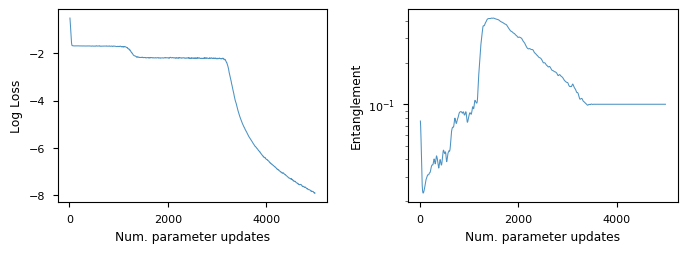

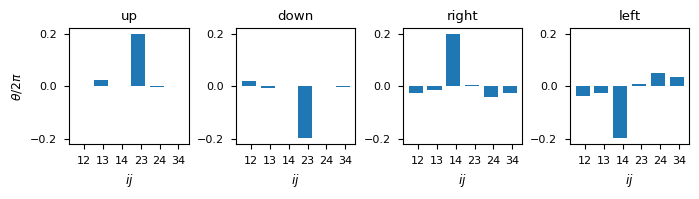

In [21]:
plt_train = rep_learner.plot_training()
plt_reps = rep_learner.plot_representations(print_matrices=True)

#### Saving and loading the state

The state of a ``RepresentationLearner`` consists of:
- history : (``losses``, ``entanglement losses``)
- representations : the $\theta_{ij}$s.
- ``encoder`` parameters
- ``decoder`` parameters
- ``optimizer_dec`` / ``optimizer_rep`` parameters.

The ``save``/``load`` function automatically take care all this under the covers.  As an example we'll save the ``RepresentationLearner`` we just trained, and load it into a fresh instance of the object.

In [22]:
fname = rep_learner.save()

Saved RepresentationLearner state to _data/test/rep_learner.pth


In [23]:
rep_learner = RepresentationLearner(grid_dim=5,
                                    latent_dim=4,
                                    decoder_hid_dim=[32],
                                    encoder_hid_dim=[32],
                                    lr_dec=5e-3,
                                    lr_rep=5e-3,
                                    lr_enc=5e-3,
                                    ent_loss_weight=1e-2,
                                    ent_loss_target = 0.1,
                                    exp_name="test")
rep_learner.load(fname)

Loaded RepresentationLearner state from _data/test/rep_learner.pth


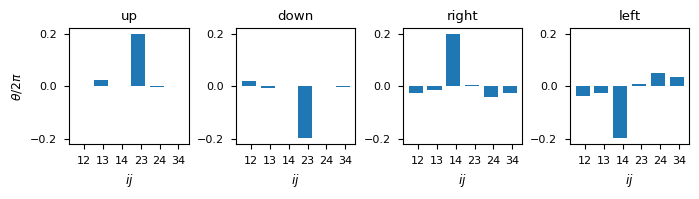

In [24]:
rep_learner.plot_representations(save=False);

#### Testing

Finally, we want to be able to test the long term prediction made by the trained ``RepresentationLearner``.  The ``test`` method does this by running ``n_eps`` episodes of ``eps_steps`` each.  At each time-step, the difference between the true state of the ``GridWorld`` environment (``obs_x``) and the state reconstructed from the ``LatentWorld`` (``obs_x_recon``) is given by the ``metric_fn`` as ``metric_fn(obs_x_recon, obs_x)``.  These scores are returned for every time-step of every episode.  To save the scores (in a pickled numpy array) set ``save_scores=True``.

Additionally, we can elect during training to see the episodes play out (``show_plots=True``) - though this is slower as we wait 0.5 seconds after each step to make it watchable.  These plots can additionally/alternatively be saved (``save_plots=False``)

In [25]:
scores = rep_learner.test(n_eps=10,
                          eps_steps=50,
                          metric_fn = F.binary_cross_entropy,
                          save_scores=True,
                          show_plots=False,
                          save_plots=False)

Scores saved to _data/test/test/scores.pkl


Now we can visualise how the predicted performance changes over the course of these episodes. 

Text(0.5, 1.0, 'Average over episodes')

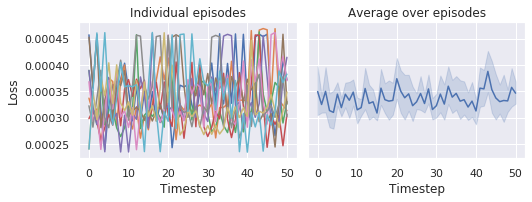

In [26]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 2.5), gridspec_kw={"wspace":0.05}, sharey=True)

x_label = "Timestep"
y_label = "Loss"

time_steps = range(scores.shape[1])
for s in scores:
    ax1.plot(time_steps, s)
ax1.set_xlabel(x_label)
ax1.set_ylabel(y_label)
ax1.set_title("Individual episodes")
    
df = pd.DataFrame(columns=[x_label, y_label])
for s in scores:
    df = df.append(pd.DataFrame({x_label:time_steps, y_label:s}))
    
sns.lineplot(x=x_label,y=y_label,data=df,ax=ax2)
ax2.set_title("Average over episodes")

## 3. Learning (dis)entangled representations

Now we'll train a few different ``RepresentationLearner``s with different degrees of entanglement and test them.  We're going to keep loading/saving the state/scores even though it could all be done in a single loop.  This is in case we want to change anything later (so we don't have to repeat all the training/testing).

Training for 100 training seeds takes several hours.

In [104]:
exp_folder = "entanglement_targets_20step4batch_long_train"
targets = [LossTarget.MIN, 0.3, 0.6, LossTarget.MAX]
labels = ["min", 0.3, 0.6, "max"]
weights = [1e-2, 1e-2, 5e-3, 2e-3]
lrs = [2e-2, 2e-2, 1e-2, 5e-3]


iter 500 : rec_loss=0.116 : entanglement=2.04e-01 : last 50 iters in 0.959s
iter 1000 : rec_loss=0.028 : entanglement=1.32e-02 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.000 : entanglement=5.77e-05 : last 50 iters in 0.941s
iter 2000 : rec_loss=0.000 : entanglement=2.09e-06 : last 50 iters in 0.933s
iter 2150 : rec_loss=0.000 : entanglement=9.54e-07 : last 50 iters in 0.944s
Training finished in 43.599s.  Final entanglement : 8.94e-07.
Training curves saved to _data/entanglement_targets_20step4batch_long_train/min0/train/training_curves(.pdf/.png)
Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min0/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min0/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=3.03e-01 : last 50 iters in 1.009s
iter 1000 : rec_loss=0.113 : entanglement=3.08e-01 : last 50 iters in 1.011s
iter 1500 : rec_loss=0.109 : entanglement=3.58e-01 : last 50 i

iter 5000 : rec_loss=0.001 : entanglement=1.35e+00 : last 50 iters in 0.991s
iter 5500 : rec_loss=0.001 : entanglement=1.39e+00 : last 50 iters in 0.991s
iter 6000 : rec_loss=0.000 : entanglement=1.42e+00 : last 50 iters in 0.995s
iter 6500 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.993s
iter 7000 : rec_loss=0.000 : entanglement=1.46e+00 : last 50 iters in 1.003s

Training finished in 138.544s.  Final entanglement : 1.46e+00.
Training curves saved to _data/entanglement_targets_20step4batch_long_train/max1/train/training_curves(.pdf/.png)
Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max1/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max1/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=4.55e-03 : last 50 iters in 0.959s
iter 1000 : rec_loss=0.115 : entanglement=9.61e-03 : last 50 iters in 0.961s
iter 1500 : rec_loss=0.001 : entanglement=2.77e-04 : last 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.62/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.62/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.62/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.28e-01 : last 50 iters in 0.960s
iter 1000 : rec_loss=0.122 : entanglement=4.70e-01 : last 50 iters in 0.968s
iter 1500 : rec_loss=0.111 : entanglement=8.61e-01 : last 50 iters in 0.958s
iter 2000 : rec_loss=0.107 : entanglement=9.30e-01 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.020 : entanglement=1.08e+00 : last 50 iters in 0.955s
iter 3000 : rec_loss=0.002 : entanglement=1.13e+00 : last 50 iters in 0.956s
iter 3500 : rec_loss=0.001 : entanglement=1.18e+00 : last 50 iters in 0.956s
iter 4000 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.954s
iter 4500 : rec_loss=0.000 : entanglement=1.29e+00 : last 50 iters in 0.972s
iter 5000 : rec_loss=0.000 : entanglement=1.30e+00 : last 50 iters in 0.953s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max2/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max2/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max2/rep_learner.pth
iter 500 : rec_loss=0.121 : entanglement=5.19e-03 : last 50 iters in 0.945s
iter 1000 : rec_loss=0.112 : entanglement=3.84e-03 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.001 : entanglement=4.03e-04 : last 50 iters in 0.948s
iter 2000 : rec_loss=0.000 : entanglement=3.97e-05 : last 50 iters in 0.951s
iter 2350 : rec_loss=0.000 : entanglement=8.52e-06 : last 50 iters in 0.950s
Training finished in 44.993s.  Final entanglement : 7.66e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min3/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min3/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min3/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=3.02e-01 : last 50 iters in 0.959s
iter 1000 : rec_loss=0.112 : entanglement=3.01e-01 : last 50 iters in 0.962s
iter 1500 : rec_loss=0.112 : entanglement=2.94e-01 : last 50 iters in 0.966s
iter 2000 : rec_loss=0.116 : entanglement=3.06e-01 : last 50 iters in 0.961s
iter 2500 : rec_loss=0.110 : entanglement=3.06e-01 : last 50 iters in 0.962s
iter 3000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.965s
iter 3500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.966s

Training finished in 67.964s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.33/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.33/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.33/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=5.81e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.110 : entanglement=5.85e-01 : last 50 iters in 0.946s
iter 1500 : rec_loss=0.097 : entanglement=5.94e-01 : last 50 iters in 0.946s
iter 2000 : rec_loss=0.107 : entanglement=5.96e-01 : last 50 iters in 0.944s
iter 2500 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.946s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.944s
iter 3550 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.942s
Training finished in 67.562s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.63/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.63/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.63/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=1.24e-01 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.114 : entanglement=4.86e-01 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.113 : entanglement=5.69e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.112 : entanglement=6.49e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.113 : entanglement=7.96e-01 : last 50 iters in 0.942s
iter 3000 : rec_loss=0.109 : entanglement=8.22e-01 : last 50 iters in 0.947s
iter 3500 : rec_loss=0.097 : entanglement=8.14e-01 : last 50 iters in 0.948s
iter 4000 : rec_loss=0.100 : entanglement=8.04e-01 : last 50 iters in 0.973s
iter 4500 : rec_loss=0.040 : entanglement=1.23e+00 : last 50 iters in 0.941s
iter 5000 : rec_loss=0.001 : entanglement=1.36e+00 : last 50 iters in 0.944s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max3/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max3/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max3/rep_learner.pth
iter 500 : rec_loss=0.110 : entanglement=9.04e-03 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.112 : entanglement=8.06e-03 : last 50 iters in 0.941s
iter 1500 : rec_loss=0.074 : entanglement=1.13e-02 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.000 : entanglement=4.11e-05 : last 50 iters in 0.938s
iter 2450 : rec_loss=0.000 : entanglement=4.26e-06 : last 50 iters in 0.944s
Training finished in 46.497s.  Final entanglement : 4.53e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min4/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min4/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min4/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=3.34e-01 : last 50 iters in 0.955s
iter 1000 : rec_loss=0.114 : entanglement=3.08e-01 : last 50 iters in 0.961s
iter 1500 : rec_loss=0.111 : entanglement=2.98e-01 : last 50 iters in 0.956s
iter 2000 : rec_loss=0.112 : entanglement=3.05e-01 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.108 : entanglement=2.99e-01 : last 50 iters in 0.957s
iter 3000 : rec_loss=0.110 : entanglement=3.27e-01 : last 50 iters in 0.962s
iter 3500 : rec_loss=0.105 : entanglement=3.03e-01 : last 50 iters in 0.965s
iter 4000 : rec_loss=0.109 : entanglement=2.99e-01 : last 50 iters in 0.955s
iter 4500 : rec_loss=0.110 : entanglement=2.98e-01 : last 50 iters in 0.962s
iter 5000 : rec_loss=0.108 : entanglement=3.63e-01 : last 50 iters in 0.956s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.34/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.34/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.34/rep_learner.pth
iter 500 : rec_loss=0.171 : entanglement=1.43e-01 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.105 : entanglement=5.95e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.109 : entanglement=6.14e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.943s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.944s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.942s
iter 3200 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.939s
Training finished in 60.344s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.64/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.64/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.64/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=2.21e-01 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.117 : entanglement=3.80e-01 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.113 : entanglement=4.01e-01 : last 50 iters in 0.944s
iter 2000 : rec_loss=0.106 : entanglement=4.18e-01 : last 50 iters in 0.944s
iter 2500 : rec_loss=0.108 : entanglement=4.57e-01 : last 50 iters in 0.950s
iter 3000 : rec_loss=0.110 : entanglement=4.83e-01 : last 50 iters in 0.943s
iter 3500 : rec_loss=0.106 : entanglement=5.40e-01 : last 50 iters in 0.962s
iter 4000 : rec_loss=0.119 : entanglement=5.99e-01 : last 50 iters in 0.942s
iter 4500 : rec_loss=0.103 : entanglement=7.73e-01 : last 50 iters in 0.944s
iter 5000 : rec_loss=0.106 : entanglement=8.30e-01 : last 50 iters in 0.942s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max4/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max4/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max4/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=1.52e-01 : last 50 iters in 0.931s
iter 1000 : rec_loss=0.105 : entanglement=1.39e-02 : last 50 iters in 0.931s
iter 1500 : rec_loss=0.117 : entanglement=6.78e-03 : last 50 iters in 0.933s
iter 2000 : rec_loss=0.110 : entanglement=8.58e-03 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.104 : entanglement=8.12e-03 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.109 : entanglement=1.72e-02 : last 50 iters in 0.945s
iter 3500 : rec_loss=0.097 : entanglement=1.79e-02 : last 50 iters in 0.945s
iter 4000 : rec_loss=0.087 : entanglement=8.61e-03 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.099 : entanglement=3.86e-03 : last 50 iters in 0.940s
iter 5000 : rec_loss=0.103 : entanglement=1.27e-02 : last 50 iters in 0.941s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min5/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min5/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min5/rep_learner.pth
iter 500 : rec_loss=0.174 : entanglement=2.97e-01 : last 50 iters in 0.933s
iter 1000 : rec_loss=0.109 : entanglement=3.18e-01 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.118 : entanglement=3.26e-01 : last 50 iters in 0.944s
iter 2000 : rec_loss=0.002 : entanglement=6.71e-01 : last 50 iters in 0.940s
iter 2500 : rec_loss=0.001 : entanglement=3.54e-01 : last 50 iters in 0.948s
iter 2750 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.947s
Training finished in 52.729s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.35/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.35/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.35/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=5.99e-01 : last 50 iters in 0.945s
iter 1000 : rec_loss=0.186 : entanglement=5.88e-01 : last 50 iters in 0.945s
iter 1500 : rec_loss=0.117 : entanglement=6.03e-01 : last 50 iters in 0.947s
iter 2000 : rec_loss=0.123 : entanglement=6.15e-01 : last 50 iters in 0.949s
iter 2500 : rec_loss=0.113 : entanglement=6.06e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.943s
iter 4000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.951s
iter 4100 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.945s
Training finished in 78.328s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.65/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.65/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.65/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=8.16e-02 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.112 : entanglement=5.66e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.111 : entanglement=5.61e-01 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.108 : entanglement=5.81e-01 : last 50 iters in 0.930s
iter 2500 : rec_loss=0.105 : entanglement=5.87e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.015 : entanglement=1.16e+00 : last 50 iters in 0.934s
iter 3500 : rec_loss=0.002 : entanglement=1.17e+00 : last 50 iters in 0.931s
iter 4000 : rec_loss=0.001 : entanglement=1.20e+00 : last 50 iters in 0.936s
iter 4500 : rec_loss=0.000 : entanglement=1.22e+00 : last 50 iters in 0.954s
iter 5000 : rec_loss=0.000 : entanglement=1.25e+00 : last 50 iters in 0.935s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max5/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max5/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max5/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.11e-02 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.109 : entanglement=4.01e-03 : last 50 iters in 0.932s
iter 1500 : rec_loss=0.001 : entanglement=1.34e-03 : last 50 iters in 0.933s
iter 2000 : rec_loss=0.000 : entanglement=6.29e-05 : last 50 iters in 0.934s
iter 2300 : rec_loss=0.000 : entanglement=1.53e-05 : last 50 iters in 0.935s
Training finished in 43.113s.  Final entanglement : 1.48e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min6/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min6/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min6/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.99e-01 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.117 : entanglement=2.99e-01 : last 50 iters in 0.926s
iter 1500 : rec_loss=0.114 : entanglement=3.05e-01 : last 50 iters in 0.935s
iter 2000 : rec_loss=0.111 : entanglement=3.30e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.109 : entanglement=2.97e-01 : last 50 iters in 0.934s
iter 3000 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 0.936s
iter 3500 : rec_loss=0.106 : entanglement=3.15e-01 : last 50 iters in 0.934s
iter 4000 : rec_loss=0.007 : entanglement=6.41e-01 : last 50 iters in 0.932s
iter 4500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.934s
iter 4550 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.934s
Traini

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.36/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.36/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.36/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=5.95e-01 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.121 : entanglement=6.00e-01 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.124 : entanglement=6.02e-01 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.113 : entanglement=6.00e-01 : last 50 iters in 0.934s
iter 2500 : rec_loss=0.112 : entanglement=5.94e-01 : last 50 iters in 0.934s
iter 3000 : rec_loss=0.115 : entanglement=6.00e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.109 : entanglement=6.10e-01 : last 50 iters in 0.934s
iter 4000 : rec_loss=0.112 : entanglement=6.07e-01 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.120 : entanglement=5.99e-01 : last 50 iters in 0.938s
iter 5000 : rec_loss=0.111 : entanglement=6.05e-01 : last 50 iters in 0.931s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.66/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.66/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.66/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=3.69e-01 : last 50 iters in 0.950s
iter 1000 : rec_loss=0.186 : entanglement=1.53e+00 : last 50 iters in 0.961s
iter 1500 : rec_loss=0.186 : entanglement=3.66e+00 : last 50 iters in 0.951s
iter 2000 : rec_loss=0.124 : entanglement=6.47e+00 : last 50 iters in 0.948s
iter 2500 : rec_loss=0.114 : entanglement=1.04e+01 : last 50 iters in 0.947s
iter 3000 : rec_loss=0.111 : entanglement=1.81e+01 : last 50 iters in 0.947s
iter 3500 : rec_loss=0.110 : entanglement=3.03e+01 : last 50 iters in 0.958s
iter 4000 : rec_loss=0.113 : entanglement=4.35e+01 : last 50 iters in 0.958s
iter 4500 : rec_loss=0.110 : entanglement=5.45e+01 : last 50 iters in 0.958s
iter 5000 : rec_loss=0.115 : entanglement=6.39e+01 : last 50 iters in 0.958s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max6/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max6/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max6/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=1.76e-03 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.006 : entanglement=1.75e-03 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.000 : entanglement=6.14e-06 : last 50 iters in 0.937s
iter 2000 : rec_loss=0.000 : entanglement=1.25e-06 : last 50 iters in 0.937s
iter 2050 : rec_loss=0.000 : entanglement=7.15e-07 : last 50 iters in 0.936s
Training finished in 39.094s.  Final entanglement : 8.64e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min7/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min7/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min7/rep_learner.pth
iter 500 : rec_loss=0.176 : entanglement=2.92e-01 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.109 : entanglement=2.96e-01 : last 50 iters in 0.946s
iter 1500 : rec_loss=0.111 : entanglement=3.03e-01 : last 50 iters in 0.932s
iter 2000 : rec_loss=0.119 : entanglement=3.04e-01 : last 50 iters in 0.942s
iter 2500 : rec_loss=0.114 : entanglement=2.90e-01 : last 50 iters in 0.937s
iter 3000 : rec_loss=0.109 : entanglement=3.00e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.104 : entanglement=3.02e-01 : last 50 iters in 0.934s
iter 4000 : rec_loss=0.000 : entanglement=7.15e-01 : last 50 iters in 0.934s
iter 4500 : rec_loss=0.000 : entanglement=6.81e-01 : last 50 iters in 0.935s
iter 5000 : rec_loss=0.000 : entanglement=7.19e-01 : last 50 iters in 0.933s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.37/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.37/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.37/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=5.94e-01 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.114 : entanglement=6.01e-01 : last 50 iters in 0.931s
iter 1500 : rec_loss=0.087 : entanglement=6.15e-01 : last 50 iters in 0.945s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.931s
iter 2500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.933s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.000 : entanglement=6.02e-01 : last 50 iters in 0.933s

Training finished in 66.131s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.67/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.67/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.67/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.11e-01 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.161 : entanglement=2.44e-01 : last 50 iters in 0.935s
iter 1500 : rec_loss=0.112 : entanglement=4.39e-01 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.109 : entanglement=5.75e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.111 : entanglement=6.84e-01 : last 50 iters in 0.935s
iter 3000 : rec_loss=0.005 : entanglement=1.11e+00 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.001 : entanglement=1.16e+00 : last 50 iters in 0.933s
iter 4000 : rec_loss=0.000 : entanglement=1.19e+00 : last 50 iters in 0.932s
iter 4500 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.933s
iter 5000 : rec_loss=0.000 : entanglement=1.25e+00 : last 50 iters in 0.934s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max7/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max7/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max7/rep_learner.pth
iter 500 : rec_loss=0.112 : entanglement=1.65e-03 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.001 : entanglement=1.51e-03 : last 50 iters in 0.928s
iter 1500 : rec_loss=0.000 : entanglement=3.66e-05 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.000 : entanglement=2.32e-06 : last 50 iters in 0.927s

Training finished in 37.807s.  Final entanglement : 2.00e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min8/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min8/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min8/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=3.04e-01 : last 50 iters in 0.975s
iter 1000 : rec_loss=0.111 : entanglement=3.28e-01 : last 50 iters in 0.967s
iter 1500 : rec_loss=0.001 : entanglement=5.47e-01 : last 50 iters in 0.968s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.967s
iter 2300 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.967s
Training finished in 44.886s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.38/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.38/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.38/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=5.98e-01 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.185 : entanglement=5.96e-01 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.117 : entanglement=6.02e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.113 : entanglement=6.20e-01 : last 50 iters in 0.946s
iter 2500 : rec_loss=0.012 : entanglement=8.33e-01 : last 50 iters in 0.943s
iter 3000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.943s
iter 3500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.942s
iter 3850 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.954s
Training finished in 72.814s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.68/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.68/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.68/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=8.85e-02 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.114 : entanglement=5.28e-01 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.110 : entanglement=5.26e-01 : last 50 iters in 0.937s
iter 2000 : rec_loss=0.114 : entanglement=5.10e-01 : last 50 iters in 0.935s
iter 2500 : rec_loss=0.113 : entanglement=5.36e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.105 : entanglement=6.33e-01 : last 50 iters in 0.928s
iter 3500 : rec_loss=0.003 : entanglement=1.04e+00 : last 50 iters in 0.927s
iter 4000 : rec_loss=0.001 : entanglement=1.06e+00 : last 50 iters in 0.934s
iter 4500 : rec_loss=0.000 : entanglement=1.08e+00 : last 50 iters in 0.937s
iter 5000 : rec_loss=0.000 : entanglement=1.10e+00 : last 50 iters in 0.940s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max8/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max8/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max8/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=9.69e-03 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.110 : entanglement=2.92e-03 : last 50 iters in 0.932s
iter 1500 : rec_loss=0.000 : entanglement=1.02e-05 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.000 : entanglement=6.85e-07 : last 50 iters in 0.934s
iter 2250 : rec_loss=0.000 : entanglement=5.07e-07 : last 50 iters in 0.937s
Training finished in 42.472s.  Final entanglement : 3.58e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min9/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min9/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min9/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=3.07e-01 : last 50 iters in 0.935s
iter 1000 : rec_loss=0.111 : entanglement=3.00e-01 : last 50 iters in 0.935s
iter 1500 : rec_loss=0.105 : entanglement=3.03e-01 : last 50 iters in 0.935s
iter 2000 : rec_loss=0.111 : entanglement=3.04e-01 : last 50 iters in 0.937s
iter 2500 : rec_loss=0.139 : entanglement=3.13e-01 : last 50 iters in 0.933s
iter 3000 : rec_loss=0.119 : entanglement=2.99e-01 : last 50 iters in 0.935s
iter 3500 : rec_loss=0.110 : entanglement=3.03e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.103 : entanglement=3.01e-01 : last 50 iters in 0.937s
iter 4500 : rec_loss=0.116 : entanglement=2.94e-01 : last 50 iters in 0.927s
iter 5000 : rec_loss=0.105 : entanglement=2.89e-01 : last 50 iters in 0.929s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.39/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.39/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.39/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=3.99e-01 : last 50 iters in 0.924s
iter 1000 : rec_loss=0.141 : entanglement=5.63e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.117 : entanglement=5.98e-01 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.112 : entanglement=6.17e-01 : last 50 iters in 0.926s
iter 2500 : rec_loss=0.102 : entanglement=5.97e-01 : last 50 iters in 0.925s
iter 3000 : rec_loss=0.113 : entanglement=5.91e-01 : last 50 iters in 0.925s
iter 3500 : rec_loss=0.040 : entanglement=9.33e-01 : last 50 iters in 0.933s
iter 4000 : rec_loss=0.001 : entanglement=9.05e-01 : last 50 iters in 0.934s
iter 4500 : rec_loss=0.000 : entanglement=8.70e-01 : last 50 iters in 0.934s
iter 5000 : rec_loss=0.000 : entanglement=8.96e-01 : last 50 iters in 0.933s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.69/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.69/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.69/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.99e-01 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.175 : entanglement=2.57e-01 : last 50 iters in 0.928s
iter 1500 : rec_loss=0.112 : entanglement=5.84e-01 : last 50 iters in 0.929s
iter 2000 : rec_loss=0.114 : entanglement=5.77e-01 : last 50 iters in 0.929s
iter 2500 : rec_loss=0.105 : entanglement=5.79e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.118 : entanglement=6.12e-01 : last 50 iters in 0.976s
iter 3500 : rec_loss=0.032 : entanglement=1.01e+00 : last 50 iters in 0.929s
iter 4000 : rec_loss=0.001 : entanglement=1.04e+00 : last 50 iters in 0.929s
iter 4500 : rec_loss=0.000 : entanglement=1.08e+00 : last 50 iters in 0.930s
iter 5000 : rec_loss=0.000 : entanglement=1.13e+00 : last 50 iters in 0.931s
iter 5

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max9/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max9/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max9/rep_learner.pth
iter 500 : rec_loss=0.115 : entanglement=4.01e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.108 : entanglement=1.23e-02 : last 50 iters in 0.928s
iter 1500 : rec_loss=0.032 : entanglement=1.71e-02 : last 50 iters in 0.932s
iter 2000 : rec_loss=0.000 : entanglement=1.01e-04 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.000 : entanglement=4.32e-06 : last 50 iters in 0.942s
iter 2550 : rec_loss=0.000 : entanglement=3.58e-06 : last 50 iters in 0.930s
Training finished in 47.301s.  Final entanglement : 3.40e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min10/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min10/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min10/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.96e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.115 : entanglement=3.00e-01 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.114 : entanglement=2.95e-01 : last 50 iters in 0.948s
iter 2000 : rec_loss=0.117 : entanglement=3.04e-01 : last 50 iters in 0.949s
iter 2500 : rec_loss=0.107 : entanglement=3.01e-01 : last 50 iters in 0.948s
iter 3000 : rec_loss=0.113 : entanglement=3.00e-01 : last 50 iters in 0.952s
iter 3500 : rec_loss=0.113 : entanglement=3.10e-01 : last 50 iters in 0.974s
iter 4000 : rec_loss=0.118 : entanglement=3.02e-01 : last 50 iters in 0.946s
iter 4500 : rec_loss=0.110 : entanglement=3.12e-01 : last 50 iters in 0.936s
iter 5000 : rec_loss=0.103 : entanglement=3.59e-01 : last 50 iters in 0.935s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.310/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.310/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.310/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.07e-01 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.126 : entanglement=5.52e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.114 : entanglement=5.89e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.002 : entanglement=6.00e-01 : last 50 iters in 0.937s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.940s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.937s
iter 3400 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.942s
Training finished in 63.958s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.610/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.610/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.610/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=9.11e-02 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.117 : entanglement=6.57e-01 : last 50 iters in 0.930s
iter 1500 : rec_loss=0.110 : entanglement=7.03e-01 : last 50 iters in 0.932s
iter 2000 : rec_loss=0.111 : entanglement=7.68e-01 : last 50 iters in 0.935s
iter 2500 : rec_loss=0.109 : entanglement=7.93e-01 : last 50 iters in 0.937s
iter 3000 : rec_loss=0.104 : entanglement=8.63e-01 : last 50 iters in 0.936s
iter 3500 : rec_loss=0.113 : entanglement=9.06e-01 : last 50 iters in 0.934s
iter 4000 : rec_loss=0.103 : entanglement=9.32e-01 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.118 : entanglement=9.71e-01 : last 50 iters in 0.934s
iter 5000 : rec_loss=0.100 : entanglement=9.99e-01 : last 50 iters in 0.934s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max10/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max10/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max10/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=8.77e-03 : last 50 iters in 0.928s
iter 1000 : rec_loss=0.114 : entanglement=1.11e-02 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.117 : entanglement=2.77e-03 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.001 : entanglement=1.08e-03 : last 50 iters in 0.937s
iter 2500 : rec_loss=0.000 : entanglement=3.27e-04 : last 50 iters in 0.931s
iter 3000 : rec_loss=0.000 : entanglement=7.55e-05 : last 50 iters in 0.938s
iter 3300 : rec_loss=0.000 : entanglement=3.12e-05 : last 50 iters in 0.940s
Training finished in 62.336s.  Final entanglement : 2.81e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min11/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min11/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min11/rep_learner.pth
iter 500 : rec_loss=0.135 : entanglement=4.41e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.127 : entanglement=3.13e-01 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.111 : entanglement=3.01e-01 : last 50 iters in 0.926s
iter 2000 : rec_loss=0.110 : entanglement=3.00e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.110 : entanglement=2.96e-01 : last 50 iters in 0.926s
iter 3000 : rec_loss=0.113 : entanglement=3.00e-01 : last 50 iters in 0.932s
iter 3500 : rec_loss=0.111 : entanglement=3.04e-01 : last 50 iters in 0.932s
iter 4000 : rec_loss=0.112 : entanglement=3.00e-01 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.116 : entanglement=3.29e-01 : last 50 iters in 0.932s
iter 5000 : rec_loss=0.107 : entanglement=3.85e-01 : last 50 iters in 0.935s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.311/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.311/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.311/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.02e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.113 : entanglement=5.87e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.107 : entanglement=6.05e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.919s
iter 3550 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
Training finished in 65.460s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.611/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.611/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.611/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=7.24e-02 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.176 : entanglement=8.28e-02 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.113 : entanglement=3.32e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.109 : entanglement=5.08e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.105 : entanglement=6.70e-01 : last 50 iters in 0.925s
iter 3000 : rec_loss=0.010 : entanglement=1.11e+00 : last 50 iters in 0.926s
iter 3500 : rec_loss=0.002 : entanglement=1.18e+00 : last 50 iters in 0.942s
iter 4000 : rec_loss=0.001 : entanglement=1.25e+00 : last 50 iters in 0.926s
iter 4500 : rec_loss=0.000 : entanglement=1.30e+00 : last 50 iters in 0.928s
iter 5000 : rec_loss=0.000 : entanglement=1.40e+00 : last 50 iters in 0.929s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max11/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max11/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max11/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=1.23e-02 : last 50 iters in 0.928s
iter 1000 : rec_loss=0.118 : entanglement=3.14e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.114 : entanglement=2.51e-01 : last 50 iters in 0.930s
iter 2000 : rec_loss=0.112 : entanglement=2.87e-01 : last 50 iters in 0.938s
iter 2500 : rec_loss=0.111 : entanglement=2.75e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.007 : entanglement=7.59e-01 : last 50 iters in 0.931s
iter 3500 : rec_loss=0.000 : entanglement=5.57e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.028 : entanglement=3.64e-01 : last 50 iters in 0.927s
iter 4500 : rec_loss=0.000 : entanglement=6.39e-02 : last 50 iters in 0.926s
iter 4850 : rec_loss=0.000 : entanglement=1.14e-02 : last 50 iters in 0.926s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min12/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min12/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min12/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=3.02e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.112 : entanglement=2.96e-01 : last 50 iters in 0.955s
iter 1500 : rec_loss=0.104 : entanglement=3.02e-01 : last 50 iters in 0.953s
iter 2000 : rec_loss=0.116 : entanglement=2.84e-01 : last 50 iters in 0.953s
iter 2500 : rec_loss=0.109 : entanglement=2.99e-01 : last 50 iters in 0.947s
iter 3000 : rec_loss=0.002 : entanglement=3.00e-01 : last 50 iters in 0.963s
iter 3500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.960s
iter 3750 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.961s
Training finished in 71.801s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.312/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.312/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.312/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=5.72e-01 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.118 : entanglement=5.93e-01 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.114 : entanglement=6.03e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.002 : entanglement=1.02e+00 : last 50 iters in 0.944s
iter 2500 : rec_loss=0.001 : entanglement=9.32e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.001 : entanglement=8.96e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.000 : entanglement=8.27e-01 : last 50 iters in 0.940s
iter 4000 : rec_loss=0.000 : entanglement=6.95e-01 : last 50 iters in 0.947s
iter 4500 : rec_loss=0.000 : entanglement=6.61e-01 : last 50 iters in 0.940s
iter 4700 : rec_loss=0.000 : entanglement=6.13e-01 : last 50 iters in 0.942s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.612/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.612/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.612/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=7.73e-03 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.113 : entanglement=5.93e-01 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.112 : entanglement=7.40e-01 : last 50 iters in 0.940s
iter 2000 : rec_loss=0.106 : entanglement=8.54e-01 : last 50 iters in 0.940s
iter 2500 : rec_loss=0.008 : entanglement=1.16e+00 : last 50 iters in 0.940s
iter 3000 : rec_loss=0.002 : entanglement=1.25e+00 : last 50 iters in 0.939s
iter 3500 : rec_loss=0.001 : entanglement=1.36e+00 : last 50 iters in 0.939s
iter 4000 : rec_loss=0.000 : entanglement=1.47e+00 : last 50 iters in 0.941s
iter 4500 : rec_loss=0.000 : entanglement=1.48e+00 : last 50 iters in 0.942s
iter 5000 : rec_loss=0.000 : entanglement=1.53e+00 : last 50 iters in 0.944s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max12/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max12/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max12/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=9.62e-02 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.009 : entanglement=8.90e-03 : last 50 iters in 0.935s
iter 1500 : rec_loss=0.000 : entanglement=6.03e-05 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.000 : entanglement=2.32e-06 : last 50 iters in 0.931s

Training finished in 38.176s.  Final entanglement : 2.03e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min13/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min13/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min13/rep_learner.pth
iter 500 : rec_loss=0.124 : entanglement=5.13e-01 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.108 : entanglement=2.95e-01 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.115 : entanglement=2.97e-01 : last 50 iters in 0.937s
iter 2000 : rec_loss=0.112 : entanglement=3.07e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.111 : entanglement=3.00e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.111 : entanglement=3.16e-01 : last 50 iters in 0.923s
iter 3500 : rec_loss=0.111 : entanglement=3.01e-01 : last 50 iters in 0.923s
iter 4000 : rec_loss=0.109 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 4500 : rec_loss=0.108 : entanglement=3.00e-01 : last 50 iters in 0.929s
iter 5000 : rec_loss=0.106 : entanglement=3.00e-01 : last 50 iters in 0.927s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.313/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.313/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.313/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=5.92e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.118 : entanglement=6.01e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.117 : entanglement=6.23e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.117 : entanglement=6.06e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.001 : entanglement=9.05e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.000 : entanglement=7.68e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.001 : entanglement=8.11e-01 : last 50 iters in 0.928s
iter 4000 : rec_loss=0.000 : entanglement=6.96e-01 : last 50 iters in 0.930s
iter 4500 : rec_loss=0.000 : entanglement=6.74e-01 : last 50 iters in 0.925s
iter 5000 : rec_loss=0.000 : entanglement=7.01e-01 : last 50 iters in 0.926s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.613/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.613/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.613/rep_learner.pth
iter 500 : rec_loss=0.189 : entanglement=2.58e-02 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.115 : entanglement=5.83e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.108 : entanglement=6.31e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.111 : entanglement=6.55e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.109 : entanglement=7.13e-01 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.116 : entanglement=6.74e-01 : last 50 iters in 0.927s
iter 3500 : rec_loss=0.062 : entanglement=9.28e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.002 : entanglement=1.04e+00 : last 50 iters in 0.923s
iter 4500 : rec_loss=0.001 : entanglement=1.12e+00 : last 50 iters in 0.923s
iter 5000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.930s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max13/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max13/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max13/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=8.73e-03 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.121 : entanglement=4.64e-03 : last 50 iters in 0.923s
iter 1500 : rec_loss=0.001 : entanglement=3.59e-04 : last 50 iters in 0.924s
iter 2000 : rec_loss=0.000 : entanglement=1.62e-05 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.000 : entanglement=1.40e-06 : last 50 iters in 0.925s
iter 2550 : rec_loss=0.000 : entanglement=1.04e-06 : last 50 iters in 0.928s
Training finished in 47.388s.  Final entanglement : 9.83e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min14/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min14/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min14/rep_learner.pth
iter 500 : rec_loss=0.116 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.110 : entanglement=2.95e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.103 : entanglement=2.88e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.015 : entanglement=3.13e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 2900 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.920s
Training finished in 53.469s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.314/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.314/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.314/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=5.99e-01 : last 50 iters in 0.969s
iter 1000 : rec_loss=0.177 : entanglement=5.81e-01 : last 50 iters in 0.980s
iter 1500 : rec_loss=0.108 : entanglement=5.91e-01 : last 50 iters in 0.979s
iter 2000 : rec_loss=0.105 : entanglement=6.05e-01 : last 50 iters in 0.977s
iter 2500 : rec_loss=0.110 : entanglement=6.01e-01 : last 50 iters in 0.975s
iter 3000 : rec_loss=0.113 : entanglement=5.98e-01 : last 50 iters in 0.971s
iter 3500 : rec_loss=0.101 : entanglement=5.87e-01 : last 50 iters in 0.972s
iter 4000 : rec_loss=0.107 : entanglement=5.90e-01 : last 50 iters in 0.975s
iter 4500 : rec_loss=0.110 : entanglement=6.02e-01 : last 50 iters in 0.976s
iter 5000 : rec_loss=0.107 : entanglement=5.54e-01 : last 50 iters in 0.974s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.614/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.614/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.614/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=7.51e-02 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.109 : entanglement=4.96e-01 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.105 : entanglement=5.66e-01 : last 50 iters in 0.940s
iter 2000 : rec_loss=0.011 : entanglement=1.06e+00 : last 50 iters in 0.939s
iter 2500 : rec_loss=0.002 : entanglement=1.10e+00 : last 50 iters in 0.947s
iter 3000 : rec_loss=0.001 : entanglement=1.14e+00 : last 50 iters in 0.942s
iter 3500 : rec_loss=0.001 : entanglement=1.19e+00 : last 50 iters in 0.950s
iter 4000 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.000 : entanglement=1.32e+00 : last 50 iters in 0.949s
iter 5000 : rec_loss=0.000 : entanglement=1.34e+00 : last 50 iters in 0.947s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max14/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max14/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max14/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=7.62e-03 : last 50 iters in 0.937s
iter 1000 : rec_loss=0.112 : entanglement=1.27e-02 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.001 : entanglement=9.30e-04 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.000 : entanglement=1.35e-05 : last 50 iters in 0.946s
iter 2200 : rec_loss=0.000 : entanglement=7.48e-06 : last 50 iters in 0.944s
Training finished in 41.559s.  Final entanglement : 5.87e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min15/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min15/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min15/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=2.91e-01 : last 50 iters in 0.935s
iter 1000 : rec_loss=0.110 : entanglement=3.06e-01 : last 50 iters in 0.934s
iter 1500 : rec_loss=0.109 : entanglement=3.04e-01 : last 50 iters in 0.935s
iter 2000 : rec_loss=0.105 : entanglement=3.37e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.111 : entanglement=3.17e-01 : last 50 iters in 0.933s
iter 3000 : rec_loss=0.003 : entanglement=4.33e-01 : last 50 iters in 0.939s
iter 3500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.933s
iter 3700 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.933s
Training finished in 69.510s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.315/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.315/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.315/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=5.96e-01 : last 50 iters in 0.954s
iter 1000 : rec_loss=0.110 : entanglement=5.97e-01 : last 50 iters in 0.933s
iter 1500 : rec_loss=0.006 : entanglement=1.02e+00 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.931s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.935s
iter 3200 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.942s
Training finished in 60.265s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.615/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.615/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.615/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.14e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.111 : entanglement=4.92e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.116 : entanglement=6.09e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.107 : entanglement=6.32e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.101 : entanglement=6.32e-01 : last 50 iters in 0.924s
iter 3000 : rec_loss=0.007 : entanglement=9.10e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.001 : entanglement=9.52e-01 : last 50 iters in 0.928s
iter 4000 : rec_loss=0.001 : entanglement=1.01e+00 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=1.11e+00 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max15/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max15/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max15/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=2.76e-02 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.118 : entanglement=1.34e-02 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.000 : entanglement=6.84e-05 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=3.49e-06 : last 50 iters in 0.920s
iter 2150 : rec_loss=0.000 : entanglement=1.64e-06 : last 50 iters in 0.920s
Training finished in 40.235s.  Final entanglement : 1.58e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min16/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min16/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min16/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=3.03e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.110 : entanglement=3.03e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.103 : entanglement=3.01e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.916s
iter 2750 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.917s
Training finished in 51.289s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.316/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.316/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.316/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.92e-01 : last 50 iters in 0.910s
iter 1000 : rec_loss=0.124 : entanglement=6.72e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.116 : entanglement=5.93e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.121 : entanglement=5.98e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.111 : entanglement=6.00e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.112 : entanglement=6.79e-01 : last 50 iters in 0.914s
iter 3500 : rec_loss=0.001 : entanglement=8.59e-01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.000 : entanglement=7.53e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.000 : entanglement=7.29e-01 : last 50 iters in 0.916s
iter 5000 : rec_loss=0.000 : entanglement=7.19e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.616/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.616/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.616/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=8.46e-02 : last 50 iters in 0.908s
iter 1000 : rec_loss=0.134 : entanglement=5.21e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.107 : entanglement=7.51e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.117 : entanglement=8.22e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.053 : entanglement=1.23e+00 : last 50 iters in 0.933s
iter 3000 : rec_loss=0.002 : entanglement=1.37e+00 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.001 : entanglement=1.40e+00 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.000 : entanglement=1.43e+00 : last 50 iters in 0.934s
iter 4500 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.929s
iter 5000 : rec_loss=0.000 : entanglement=1.50e+00 : last 50 iters in 0.928s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max16/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max16/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max16/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=6.96e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.035 : entanglement=1.66e-02 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.000 : entanglement=6.22e-05 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.000 : entanglement=2.95e-06 : last 50 iters in 0.920s
iter 2150 : rec_loss=0.000 : entanglement=1.46e-06 : last 50 iters in 0.920s
Training finished in 40.021s.  Final entanglement : 1.13e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min17/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min17/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min17/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=3.02e-01 : last 50 iters in 0.978s
iter 1000 : rec_loss=0.115 : entanglement=2.96e-01 : last 50 iters in 0.983s
iter 1500 : rec_loss=0.116 : entanglement=3.19e-01 : last 50 iters in 0.975s
iter 2000 : rec_loss=0.109 : entanglement=3.33e-01 : last 50 iters in 0.973s
iter 2500 : rec_loss=0.111 : entanglement=2.93e-01 : last 50 iters in 0.974s
iter 3000 : rec_loss=0.120 : entanglement=3.00e-01 : last 50 iters in 0.974s
iter 3500 : rec_loss=0.113 : entanglement=3.01e-01 : last 50 iters in 0.974s
iter 4000 : rec_loss=0.106 : entanglement=3.08e-01 : last 50 iters in 0.975s
iter 4500 : rec_loss=0.109 : entanglement=3.70e-01 : last 50 iters in 0.980s
iter 5000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.979s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.317/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.317/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.317/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.02e-01 : last 50 iters in 0.941s
iter 1000 : rec_loss=0.118 : entanglement=5.98e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.099 : entanglement=5.97e-01 : last 50 iters in 0.968s
iter 2000 : rec_loss=0.107 : entanglement=5.99e-01 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.961s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.955s
iter 3900 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.947s
Training finished in 73.732s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.617/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.617/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.617/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.36e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.110 : entanglement=6.25e-01 : last 50 iters in 0.937s
iter 1500 : rec_loss=0.104 : entanglement=6.30e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.108 : entanglement=6.48e-01 : last 50 iters in 0.939s
iter 2500 : rec_loss=0.110 : entanglement=6.35e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.105 : entanglement=6.76e-01 : last 50 iters in 0.930s
iter 3500 : rec_loss=0.006 : entanglement=1.20e+00 : last 50 iters in 0.931s
iter 4000 : rec_loss=0.001 : entanglement=1.23e+00 : last 50 iters in 0.933s
iter 4500 : rec_loss=0.000 : entanglement=1.26e+00 : last 50 iters in 0.931s
iter 5000 : rec_loss=0.000 : entanglement=1.29e+00 : last 50 iters in 0.933s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max17/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max17/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max17/rep_learner.pth
iter 500 : rec_loss=0.155 : entanglement=1.15e-01 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.115 : entanglement=1.02e-02 : last 50 iters in 0.931s
iter 1500 : rec_loss=0.001 : entanglement=1.08e-03 : last 50 iters in 0.932s
iter 2000 : rec_loss=0.000 : entanglement=6.95e-05 : last 50 iters in 0.932s
iter 2250 : rec_loss=0.000 : entanglement=2.05e-05 : last 50 iters in 0.931s
Training finished in 42.071s.  Final entanglement : 1.96e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min18/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min18/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min18/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=2.92e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.113 : entanglement=3.11e-01 : last 50 iters in 0.926s
iter 1500 : rec_loss=0.107 : entanglement=2.98e-01 : last 50 iters in 0.926s
iter 2000 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.927s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.936s
iter 2700 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.936s
Training finished in 50.262s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.318/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.318/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.318/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=6.13e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.113 : entanglement=5.77e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.113 : entanglement=5.94e-01 : last 50 iters in 0.928s
iter 2000 : rec_loss=0.116 : entanglement=5.93e-01 : last 50 iters in 0.928s
iter 2500 : rec_loss=0.102 : entanglement=5.98e-01 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.114 : entanglement=6.01e-01 : last 50 iters in 0.931s
iter 3500 : rec_loss=0.111 : entanglement=5.95e-01 : last 50 iters in 0.931s
iter 4000 : rec_loss=0.106 : entanglement=5.99e-01 : last 50 iters in 0.932s
iter 4500 : rec_loss=0.114 : entanglement=6.08e-01 : last 50 iters in 0.927s
iter 5000 : rec_loss=0.106 : entanglement=6.00e-01 : last 50 iters in 0.926s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.618/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.618/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.618/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=1.13e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.112 : entanglement=3.70e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.113 : entanglement=4.86e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.113 : entanglement=5.37e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.112 : entanglement=5.36e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.105 : entanglement=5.70e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.109 : entanglement=5.66e-01 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.102 : entanglement=5.75e-01 : last 50 iters in 0.927s
iter 4500 : rec_loss=0.117 : entanglement=6.08e-01 : last 50 iters in 0.924s
iter 5000 : rec_loss=0.117 : entanglement=5.99e-01 : last 50 iters in 0.937s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max18/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max18/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max18/rep_learner.pth
iter 500 : rec_loss=0.136 : entanglement=9.82e-02 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.120 : entanglement=1.67e-03 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.106 : entanglement=5.43e-03 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.110 : entanglement=7.50e-03 : last 50 iters in 0.927s
iter 2500 : rec_loss=0.109 : entanglement=7.15e-03 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.000 : entanglement=4.35e-05 : last 50 iters in 0.922s
iter 3400 : rec_loss=0.000 : entanglement=3.76e-06 : last 50 iters in 0.923s
Training finished in 63.360s.  Final entanglement : 3.64e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min19/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min19/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min19/rep_learner.pth
iter 500 : rec_loss=0.189 : entanglement=3.01e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.118 : entanglement=3.04e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.108 : entanglement=2.95e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.116 : entanglement=3.21e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.104 : entanglement=3.30e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.009 : entanglement=3.85e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 3750 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.941s
Training finished in 69.876s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.319/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.319/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.319/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.04e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.116 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.004 : entanglement=6.00e-01 : last 50 iters in 0.924s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.000 : entanglement=6.02e-01 : last 50 iters in 0.922s
iter 3350 : rec_loss=0.000 : entanglement=5.98e-01 : last 50 iters in 0.928s
Training finished in 61.874s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.619/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.619/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.619/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.26e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.110 : entanglement=6.40e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.112 : entanglement=6.84e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.099 : entanglement=7.86e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.003 : entanglement=1.29e+00 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.001 : entanglement=1.36e+00 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.000 : entanglement=1.40e+00 : last 50 iters in 0.919s
iter 4000 : rec_loss=0.000 : entanglement=1.47e+00 : last 50 iters in 0.921s
iter 4500 : rec_loss=0.000 : entanglement=1.50e+00 : last 50 iters in 0.923s
iter 4750 : rec_loss=0.001 : entanglement=1.49e+00 : last 50 iters in 0.925s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max19/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max19/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max19/rep_learner.pth
iter 500 : rec_loss=0.152 : entanglement=1.49e-02 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.113 : entanglement=9.21e-04 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.113 : entanglement=2.01e-03 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.108 : entanglement=3.49e-03 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.004 : entanglement=1.11e-03 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.000 : entanglement=1.00e-04 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.000 : entanglement=3.80e-05 : last 50 iters in 0.929s
iter 3750 : rec_loss=0.000 : entanglement=1.81e-05 : last 50 iters in 0.919s
Training finished in 69.627s.  Final entanglement : 1.66e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min20/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min20/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min20/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=2.99e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.113 : entanglement=2.81e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.121 : entanglement=2.85e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.054 : entanglement=3.04e-01 : last 50 iters in 0.935s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.925s

Training finished in 56.061s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.320/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.320/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.320/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.92e-01 : last 50 iters in 0.969s
iter 1000 : rec_loss=0.109 : entanglement=6.06e-01 : last 50 iters in 0.982s
iter 1500 : rec_loss=0.113 : entanglement=5.95e-01 : last 50 iters in 0.984s
iter 2000 : rec_loss=0.110 : entanglement=6.06e-01 : last 50 iters in 0.972s
iter 2500 : rec_loss=0.105 : entanglement=6.14e-01 : last 50 iters in 0.971s
iter 3000 : rec_loss=0.002 : entanglement=8.36e-01 : last 50 iters in 0.971s
iter 3500 : rec_loss=0.000 : entanglement=6.93e-01 : last 50 iters in 0.973s
iter 4000 : rec_loss=0.000 : entanglement=6.14e-01 : last 50 iters in 0.970s
iter 4150 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.972s
Training finished in 81.127s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.620/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.620/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.620/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.58e-02 : last 50 iters in 0.955s
iter 1000 : rec_loss=0.116 : entanglement=4.23e-01 : last 50 iters in 0.961s
iter 1500 : rec_loss=0.114 : entanglement=4.56e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.108 : entanglement=4.67e-01 : last 50 iters in 0.949s
iter 2500 : rec_loss=0.004 : entanglement=9.46e-01 : last 50 iters in 0.951s
iter 3000 : rec_loss=0.001 : entanglement=9.68e-01 : last 50 iters in 0.950s
iter 3500 : rec_loss=0.000 : entanglement=9.93e-01 : last 50 iters in 0.950s
iter 4000 : rec_loss=0.000 : entanglement=1.02e+00 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.000 : entanglement=1.06e+00 : last 50 iters in 0.946s
iter 4750 : rec_loss=0.000 : entanglement=1.07e+00 : last 50 iters in 0.946s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max20/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max20/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max20/rep_learner.pth
iter 500 : rec_loss=0.168 : entanglement=4.50e-02 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.117 : entanglement=2.45e-01 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.108 : entanglement=2.83e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.113 : entanglement=3.29e-01 : last 50 iters in 0.949s
iter 2500 : rec_loss=0.001 : entanglement=6.03e-01 : last 50 iters in 0.937s
iter 3000 : rec_loss=0.024 : entanglement=5.61e-01 : last 50 iters in 0.936s
iter 3500 : rec_loss=0.000 : entanglement=6.09e-02 : last 50 iters in 0.941s
iter 3800 : rec_loss=0.000 : entanglement=1.00e-02 : last 50 iters in 0.944s
Training finished in 71.359s.  Final entanglement : 9.91e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min21/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min21/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min21/rep_learner.pth
iter 500 : rec_loss=0.123 : entanglement=3.90e-01 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.017 : entanglement=3.03e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.000 : entanglement=3.02e-01 : last 50 iters in 0.937s
iter 2100 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.939s
Training finished in 40.099s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.321/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.321/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.321/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.01e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.118 : entanglement=5.98e-01 : last 50 iters in 0.930s
iter 1500 : rec_loss=0.110 : entanglement=5.96e-01 : last 50 iters in 0.929s
iter 2000 : rec_loss=0.110 : entanglement=5.99e-01 : last 50 iters in 0.926s
iter 2500 : rec_loss=0.109 : entanglement=6.01e-01 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.001 : entanglement=9.57e-01 : last 50 iters in 0.934s
iter 3500 : rec_loss=0.000 : entanglement=7.37e-01 : last 50 iters in 0.964s
iter 4000 : rec_loss=0.000 : entanglement=7.44e-01 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.000 : entanglement=7.46e-01 : last 50 iters in 0.937s
iter 5000 : rec_loss=0.000 : entanglement=6.86e-01 : last 50 iters in 0.938s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.621/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.621/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.621/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.30e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.185 : entanglement=1.79e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.109 : entanglement=6.77e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.117 : entanglement=8.58e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.116 : entanglement=9.64e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.111 : entanglement=1.03e+00 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.104 : entanglement=1.11e+00 : last 50 iters in 0.913s
iter 4000 : rec_loss=0.006 : entanglement=1.12e+00 : last 50 iters in 0.912s
iter 4500 : rec_loss=0.001 : entanglement=1.38e+00 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.000 : entanglement=1.47e+00 : last 50 iters in 0.914s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max21/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max21/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max21/rep_learner.pth
iter 500 : rec_loss=0.146 : entanglement=6.26e-02 : last 50 iters in 0.903s
iter 1000 : rec_loss=0.115 : entanglement=1.62e-02 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.000 : entanglement=4.46e-05 : last 50 iters in 0.904s
iter 2000 : rec_loss=0.000 : entanglement=9.54e-07 : last 50 iters in 0.904s
iter 2200 : rec_loss=0.000 : entanglement=8.34e-07 : last 50 iters in 0.906s
Training finished in 40.484s.  Final entanglement : 5.66e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min22/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min22/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min22/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.91e-01 : last 50 iters in 0.905s
iter 1000 : rec_loss=0.118 : entanglement=3.01e-01 : last 50 iters in 0.908s
iter 1500 : rec_loss=0.114 : entanglement=3.02e-01 : last 50 iters in 0.906s
iter 2000 : rec_loss=0.103 : entanglement=2.96e-01 : last 50 iters in 0.907s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.904s
iter 3000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.906s
iter 3100 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.907s
Training finished in 56.651s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.322/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.322/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.322/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=4.28e-01 : last 50 iters in 0.903s
iter 1000 : rec_loss=0.111 : entanglement=6.02e-01 : last 50 iters in 0.906s
iter 1500 : rec_loss=0.101 : entanglement=5.91e-01 : last 50 iters in 0.903s
iter 2000 : rec_loss=0.107 : entanglement=5.91e-01 : last 50 iters in 0.903s
iter 2500 : rec_loss=0.001 : entanglement=6.81e-01 : last 50 iters in 0.910s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.904s
iter 3400 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.904s
Training finished in 62.106s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.622/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.622/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.622/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.21e-01 : last 50 iters in 0.905s
iter 1000 : rec_loss=0.115 : entanglement=4.57e-01 : last 50 iters in 0.904s
iter 1500 : rec_loss=0.111 : entanglement=5.16e-01 : last 50 iters in 0.905s
iter 2000 : rec_loss=0.111 : entanglement=5.57e-01 : last 50 iters in 0.904s
iter 2500 : rec_loss=0.106 : entanglement=5.76e-01 : last 50 iters in 0.906s
iter 3000 : rec_loss=0.109 : entanglement=6.03e-01 : last 50 iters in 0.904s
iter 3500 : rec_loss=0.105 : entanglement=6.41e-01 : last 50 iters in 0.905s
iter 4000 : rec_loss=0.110 : entanglement=6.37e-01 : last 50 iters in 0.904s
iter 4500 : rec_loss=0.107 : entanglement=6.76e-01 : last 50 iters in 0.906s
iter 5000 : rec_loss=0.108 : entanglement=6.67e-01 : last 50 iters in 0.906s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max22/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max22/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max22/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=1.48e-02 : last 50 iters in 0.901s
iter 1000 : rec_loss=0.103 : entanglement=7.27e-03 : last 50 iters in 0.904s
iter 1500 : rec_loss=0.001 : entanglement=1.43e-04 : last 50 iters in 0.904s
iter 2000 : rec_loss=0.000 : entanglement=1.13e-05 : last 50 iters in 0.909s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-06 : last 50 iters in 0.902s
iter 2600 : rec_loss=0.000 : entanglement=2.29e-06 : last 50 iters in 0.903s
Training finished in 47.535s.  Final entanglement : 2.12e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min23/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min23/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min23/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=3.02e-01 : last 50 iters in 0.901s
iter 1000 : rec_loss=0.115 : entanglement=2.98e-01 : last 50 iters in 0.904s
iter 1500 : rec_loss=0.090 : entanglement=3.02e-01 : last 50 iters in 0.906s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.908s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.907s
iter 2600 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.907s
Training finished in 47.209s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.323/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.323/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.323/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=6.02e-01 : last 50 iters in 0.899s
iter 1000 : rec_loss=0.182 : entanglement=5.93e-01 : last 50 iters in 0.902s
iter 1500 : rec_loss=0.118 : entanglement=6.10e-01 : last 50 iters in 0.904s
iter 2000 : rec_loss=0.113 : entanglement=6.07e-01 : last 50 iters in 0.904s
iter 2500 : rec_loss=0.086 : entanglement=8.83e-01 : last 50 iters in 0.902s
iter 3000 : rec_loss=0.001 : entanglement=9.49e-01 : last 50 iters in 0.923s
iter 3500 : rec_loss=0.000 : entanglement=8.94e-01 : last 50 iters in 0.911s
iter 4000 : rec_loss=0.000 : entanglement=8.78e-01 : last 50 iters in 0.910s
iter 4500 : rec_loss=0.000 : entanglement=8.30e-01 : last 50 iters in 0.907s
iter 5000 : rec_loss=0.000 : entanglement=8.25e-01 : last 50 iters in 0.910s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.623/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.623/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.623/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.41e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.115 : entanglement=4.04e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.109 : entanglement=5.34e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.110 : entanglement=5.47e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.112 : entanglement=5.85e-01 : last 50 iters in 0.912s
iter 3000 : rec_loss=0.109 : entanglement=5.94e-01 : last 50 iters in 0.918s
iter 3500 : rec_loss=0.109 : entanglement=6.46e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.003 : entanglement=1.10e+00 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.000 : entanglement=1.15e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max23/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max23/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max23/rep_learner.pth
iter 500 : rec_loss=0.124 : entanglement=2.81e-03 : last 50 iters in 0.962s
iter 1000 : rec_loss=0.106 : entanglement=1.51e-02 : last 50 iters in 0.966s
iter 1500 : rec_loss=0.000 : entanglement=1.51e-05 : last 50 iters in 0.969s
iter 2000 : rec_loss=0.000 : entanglement=1.82e-06 : last 50 iters in 0.971s

Training finished in 38.860s.  Final entanglement : 1.43e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min24/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min24/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min24/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=3.00e-01 : last 50 iters in 0.953s
iter 1000 : rec_loss=0.116 : entanglement=2.98e-01 : last 50 iters in 0.952s
iter 1500 : rec_loss=0.110 : entanglement=3.18e-01 : last 50 iters in 0.953s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.953s
iter 2700 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.954s
Training finished in 51.614s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.324/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.324/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.324/rep_learner.pth
iter 500 : rec_loss=0.192 : entanglement=6.00e-01 : last 50 iters in 0.931s
iter 1000 : rec_loss=0.109 : entanglement=6.01e-01 : last 50 iters in 0.930s
iter 1500 : rec_loss=0.112 : entanglement=6.00e-01 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.110 : entanglement=5.96e-01 : last 50 iters in 0.931s
iter 2500 : rec_loss=0.118 : entanglement=5.92e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.115 : entanglement=5.91e-01 : last 50 iters in 0.936s
iter 3500 : rec_loss=0.111 : entanglement=6.01e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.122 : entanglement=5.95e-01 : last 50 iters in 0.931s
iter 4500 : rec_loss=0.114 : entanglement=6.00e-01 : last 50 iters in 0.930s
iter 5000 : rec_loss=0.111 : entanglement=6.13e-01 : last 50 iters in 0.931s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.624/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.624/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.624/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.98e-01 : last 50 iters in 0.930s
iter 1000 : rec_loss=0.183 : entanglement=9.21e-01 : last 50 iters in 0.931s
iter 1500 : rec_loss=0.114 : entanglement=1.30e+00 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.112 : entanglement=1.62e+00 : last 50 iters in 0.932s
iter 2500 : rec_loss=0.112 : entanglement=1.92e+00 : last 50 iters in 0.931s
iter 3000 : rec_loss=0.102 : entanglement=2.30e+00 : last 50 iters in 0.932s
iter 3500 : rec_loss=0.103 : entanglement=2.68e+00 : last 50 iters in 0.932s
iter 4000 : rec_loss=0.106 : entanglement=3.13e+00 : last 50 iters in 0.931s
iter 4500 : rec_loss=0.117 : entanglement=3.47e+00 : last 50 iters in 0.931s
iter 5000 : rec_loss=0.109 : entanglement=3.86e+00 : last 50 iters in 0.931s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max24/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max24/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max24/rep_learner.pth
iter 500 : rec_loss=0.170 : entanglement=7.16e-02 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.123 : entanglement=2.23e-02 : last 50 iters in 0.928s
iter 1500 : rec_loss=0.001 : entanglement=2.46e-03 : last 50 iters in 0.929s
iter 2000 : rec_loss=0.000 : entanglement=4.85e-04 : last 50 iters in 0.934s
iter 2500 : rec_loss=0.000 : entanglement=8.40e-05 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.000 : entanglement=1.31e-05 : last 50 iters in 0.942s
iter 3050 : rec_loss=0.000 : entanglement=1.15e-05 : last 50 iters in 0.930s
Training finished in 57.017s.  Final entanglement : 1.20e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min25/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min25/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min25/rep_learner.pth
iter 500 : rec_loss=0.191 : entanglement=3.03e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.112 : entanglement=2.97e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.109 : entanglement=2.99e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.111 : entanglement=3.02e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.103 : entanglement=3.02e-01 : last 50 iters in 0.912s
iter 3000 : rec_loss=0.109 : entanglement=3.01e-01 : last 50 iters in 0.913s
iter 3500 : rec_loss=0.110 : entanglement=3.20e-01 : last 50 iters in 0.913s
iter 4000 : rec_loss=0.116 : entanglement=3.60e-01 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.109 : entanglement=3.25e-01 : last 50 iters in 0.915s
iter 5000 : rec_loss=0.111 : entanglement=3.59e-01 : last 50 iters in 0.914s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.325/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.325/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.325/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=4.55e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.103 : entanglement=5.90e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.003 : entanglement=7.22e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.908s

Training finished in 55.436s.  Final entanglement : 6.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.625/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.625/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.625/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=5.07e-02 : last 50 iters in 0.904s
iter 1000 : rec_loss=0.110 : entanglement=3.49e-01 : last 50 iters in 0.904s
iter 1500 : rec_loss=0.112 : entanglement=4.32e-01 : last 50 iters in 0.904s
iter 2000 : rec_loss=0.004 : entanglement=1.08e+00 : last 50 iters in 0.905s
iter 2500 : rec_loss=0.001 : entanglement=1.11e+00 : last 50 iters in 0.905s
iter 3000 : rec_loss=0.000 : entanglement=1.15e+00 : last 50 iters in 0.905s
iter 3500 : rec_loss=0.000 : entanglement=1.17e+00 : last 50 iters in 0.905s
iter 4000 : rec_loss=0.000 : entanglement=1.21e+00 : last 50 iters in 0.906s
iter 4450 : rec_loss=0.000 : entanglement=1.22e+00 : last 50 iters in 0.906s
Training finished in 80.915s.  Final entanglement : 1.21e+00.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max25/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max25/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max25/rep_learner.pth
iter 500 : rec_loss=0.112 : entanglement=8.30e-04 : last 50 iters in 0.904s
iter 1000 : rec_loss=0.113 : entanglement=8.02e-03 : last 50 iters in 0.904s
iter 1500 : rec_loss=0.003 : entanglement=1.54e-03 : last 50 iters in 0.904s
iter 2000 : rec_loss=0.000 : entanglement=8.05e-07 : last 50 iters in 0.904s
iter 2200 : rec_loss=0.000 : entanglement=1.64e-06 : last 50 iters in 0.905s
Training finished in 40.486s.  Final entanglement : 8.64e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min26/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min26/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min26/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=2.86e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.907s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.908s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.911s

Training finished in 36.561s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.326/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.326/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.326/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=6.01e-01 : last 50 iters in 0.906s
iter 1000 : rec_loss=0.112 : entanglement=5.99e-01 : last 50 iters in 0.909s
iter 1500 : rec_loss=0.110 : entanglement=5.95e-01 : last 50 iters in 0.910s
iter 2000 : rec_loss=0.109 : entanglement=5.94e-01 : last 50 iters in 0.910s
iter 2500 : rec_loss=0.117 : entanglement=5.99e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.108 : entanglement=6.08e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.111 : entanglement=6.05e-01 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.001 : entanglement=7.62e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=6.33e-01 : last 50 iters in 0.922s
iter 5000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.928s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.626/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.626/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.626/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.60e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.112 : entanglement=1.09e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.114 : entanglement=2.85e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.111 : entanglement=6.13e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.112 : entanglement=7.84e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.010 : entanglement=9.00e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.001 : entanglement=1.13e+00 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.001 : entanglement=1.31e+00 : last 50 iters in 0.925s
iter 4500 : rec_loss=0.000 : entanglement=1.37e+00 : last 50 iters in 0.925s
iter 5000 : rec_loss=0.000 : entanglement=1.43e+00 : last 50 iters in 0.927s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max26/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max26/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max26/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=2.31e-03 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.114 : entanglement=2.81e-02 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.111 : entanglement=2.56e-02 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=5.98e-04 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.000 : entanglement=3.02e-05 : last 50 iters in 0.915s
iter 2600 : rec_loss=0.000 : entanglement=2.02e-05 : last 50 iters in 0.917s
Training finished in 48.167s.  Final entanglement : 1.73e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min27/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min27/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min27/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=3.03e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.111 : entanglement=3.21e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.049 : entanglement=2.89e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.932s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.928s
iter 2650 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.918s
Training finished in 48.851s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.327/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.327/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.327/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.111 : entanglement=6.12e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.109 : entanglement=5.94e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.109 : entanglement=6.04e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.109 : entanglement=5.91e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.098 : entanglement=5.92e-01 : last 50 iters in 0.916s
iter 3500 : rec_loss=0.112 : entanglement=5.96e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.103 : entanglement=6.05e-01 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.627/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.627/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.627/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=5.67e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.192 : entanglement=2.01e+00 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.185 : entanglement=5.30e+00 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.178 : entanglement=1.37e+01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.184 : entanglement=3.36e+01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.182 : entanglement=8.51e+01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.183 : entanglement=1.87e+02 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.182 : entanglement=3.51e+02 : last 50 iters in 0.922s
iter 4500 : rec_loss=0.180 : entanglement=5.86e+02 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.181 : entanglement=8.98e+02 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max27/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max27/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max27/rep_learner.pth
iter 500 : rec_loss=0.172 : entanglement=5.80e-02 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.001 : entanglement=4.97e-04 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.000 : entanglement=1.32e-05 : last 50 iters in 0.919s
iter 1850 : rec_loss=0.000 : entanglement=1.94e-06 : last 50 iters in 0.919s
Training finished in 34.004s.  Final entanglement : 2.09e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min28/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min28/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min28/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.99e-01 : last 50 iters in 0.959s
iter 1000 : rec_loss=0.112 : entanglement=2.99e-01 : last 50 iters in 0.964s
iter 1500 : rec_loss=0.107 : entanglement=3.26e-01 : last 50 iters in 0.961s
iter 2000 : rec_loss=0.107 : entanglement=3.05e-01 : last 50 iters in 0.961s
iter 2500 : rec_loss=0.104 : entanglement=3.01e-01 : last 50 iters in 0.960s
iter 3000 : rec_loss=0.127 : entanglement=2.97e-01 : last 50 iters in 0.962s
iter 3500 : rec_loss=0.113 : entanglement=3.02e-01 : last 50 iters in 0.973s
iter 4000 : rec_loss=0.109 : entanglement=3.04e-01 : last 50 iters in 0.957s
iter 4500 : rec_loss=0.106 : entanglement=2.98e-01 : last 50 iters in 0.962s
iter 5000 : rec_loss=0.107 : entanglement=2.98e-01 : last 50 iters in 0.971s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.328/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.328/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.328/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.05e-01 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.119 : entanglement=5.98e-01 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.112 : entanglement=6.08e-01 : last 50 iters in 0.938s
iter 2000 : rec_loss=0.106 : entanglement=6.02e-01 : last 50 iters in 0.938s
iter 2500 : rec_loss=0.003 : entanglement=7.61e-01 : last 50 iters in 0.938s
iter 3000 : rec_loss=0.001 : entanglement=6.16e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.000 : entanglement=6.02e-01 : last 50 iters in 0.940s
iter 3800 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.941s
Training finished in 72.020s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.628/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.628/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.628/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.96e-02 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.109 : entanglement=4.31e-01 : last 50 iters in 0.935s
iter 1500 : rec_loss=0.111 : entanglement=4.73e-01 : last 50 iters in 0.935s
iter 2000 : rec_loss=0.107 : entanglement=5.26e-01 : last 50 iters in 0.935s
iter 2500 : rec_loss=0.031 : entanglement=8.67e-01 : last 50 iters in 0.935s
iter 3000 : rec_loss=0.001 : entanglement=1.10e+00 : last 50 iters in 0.938s
iter 3500 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.937s
iter 4000 : rec_loss=0.000 : entanglement=1.32e+00 : last 50 iters in 0.936s
iter 4500 : rec_loss=0.000 : entanglement=1.34e+00 : last 50 iters in 0.937s
iter 4850 : rec_loss=0.000 : entanglement=1.37e+00 : last 50 iters in 0.931s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max28/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max28/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max28/rep_learner.pth
iter 500 : rec_loss=0.126 : entanglement=1.94e-02 : last 50 iters in 0.939s
iter 1000 : rec_loss=0.110 : entanglement=1.71e-02 : last 50 iters in 0.933s
iter 1500 : rec_loss=0.000 : entanglement=1.88e-04 : last 50 iters in 0.933s
iter 2000 : rec_loss=0.000 : entanglement=1.31e-06 : last 50 iters in 0.934s
iter 2250 : rec_loss=0.000 : entanglement=3.28e-07 : last 50 iters in 0.934s
Training finished in 42.201s.  Final entanglement : 3.87e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min29/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min29/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min29/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.90e-01 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.117 : entanglement=3.01e-01 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.124 : entanglement=2.93e-01 : last 50 iters in 0.954s
iter 2000 : rec_loss=0.111 : entanglement=3.01e-01 : last 50 iters in 0.951s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.936s
iter 3000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.937s
iter 3100 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.938s
Training finished in 59.041s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.329/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.329/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.329/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.34e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.100 : entanglement=6.01e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.001 : entanglement=8.36e-01 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.000 : entanglement=7.53e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.036 : entanglement=7.96e-01 : last 50 iters in 0.935s
iter 3000 : rec_loss=0.000 : entanglement=7.16e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.000 : entanglement=7.11e-01 : last 50 iters in 0.935s
iter 4000 : rec_loss=0.000 : entanglement=7.18e-01 : last 50 iters in 0.924s
iter 4500 : rec_loss=0.000 : entanglement=6.96e-01 : last 50 iters in 0.934s
iter 5000 : rec_loss=0.000 : entanglement=7.27e-01 : last 50 iters in 0.938s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.629/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.629/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.629/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=8.22e-02 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.115 : entanglement=6.08e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.109 : entanglement=7.33e-01 : last 50 iters in 0.937s
iter 2000 : rec_loss=0.114 : entanglement=7.95e-01 : last 50 iters in 0.924s
iter 2500 : rec_loss=0.110 : entanglement=7.96e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.097 : entanglement=8.05e-01 : last 50 iters in 0.926s
iter 3500 : rec_loss=0.109 : entanglement=8.23e-01 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.108 : entanglement=8.23e-01 : last 50 iters in 0.930s
iter 4500 : rec_loss=0.098 : entanglement=7.95e-01 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.094 : entanglement=8.10e-01 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max29/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max29/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max29/rep_learner.pth
iter 500 : rec_loss=0.192 : entanglement=1.43e-02 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.143 : entanglement=1.99e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.001 : entanglement=2.05e-04 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.000 : entanglement=1.91e-06 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.000 : entanglement=3.58e-07 : last 50 iters in 0.942s
iter 2700 : rec_loss=0.000 : entanglement=2.68e-07 : last 50 iters in 0.920s
Training finished in 50.107s.  Final entanglement : 2.38e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min30/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min30/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min30/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.023 : entanglement=4.53e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.000 : entanglement=3.02e-01 : last 50 iters in 0.922s
iter 2050 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.917s
Training finished in 38.334s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.330/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.330/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.330/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=6.00e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.152 : entanglement=6.07e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.119 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.117 : entanglement=5.75e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.113 : entanglement=5.89e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.106 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.108 : entanglement=5.97e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.104 : entanglement=5.79e-01 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.120 : entanglement=5.89e-01 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.113 : entanglement=6.07e-01 : last 50 iters in 0.927s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.630/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.630/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.630/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.36e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.189 : entanglement=2.32e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.176 : entanglement=2.17e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.121 : entanglement=6.58e-01 : last 50 iters in 0.912s
iter 2500 : rec_loss=0.010 : entanglement=1.12e+00 : last 50 iters in 0.913s
iter 3000 : rec_loss=0.002 : entanglement=1.17e+00 : last 50 iters in 0.913s
iter 3500 : rec_loss=0.001 : entanglement=1.19e+00 : last 50 iters in 0.912s
iter 4000 : rec_loss=0.000 : entanglement=1.22e+00 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.000 : entanglement=1.28e+00 : last 50 iters in 0.913s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max30/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max30/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max30/rep_learner.pth
iter 500 : rec_loss=0.120 : entanglement=2.33e-02 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.110 : entanglement=9.43e-03 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.002 : entanglement=4.04e-03 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=1.22e-04 : last 50 iters in 0.919s
iter 2250 : rec_loss=0.000 : entanglement=3.73e-05 : last 50 iters in 0.919s
Training finished in 41.940s.  Final entanglement : 3.15e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min31/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min31/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min31/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=3.15e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.112 : entanglement=2.98e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.105 : entanglement=2.84e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 2450 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.918s
Training finished in 45.432s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.331/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.331/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.331/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=6.02e-01 : last 50 iters in 0.910s
iter 1000 : rec_loss=0.114 : entanglement=5.94e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.116 : entanglement=5.95e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.113 : entanglement=6.05e-01 : last 50 iters in 0.928s
iter 2500 : rec_loss=0.105 : entanglement=6.09e-01 : last 50 iters in 0.936s
iter 3000 : rec_loss=0.101 : entanglement=6.26e-01 : last 50 iters in 0.914s
iter 3500 : rec_loss=0.097 : entanglement=5.75e-01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.119 : entanglement=6.52e-01 : last 50 iters in 0.927s
iter 4500 : rec_loss=0.002 : entanglement=8.00e-01 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.000 : entanglement=6.44e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.631/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.631/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.631/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.74e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.114 : entanglement=5.79e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.112 : entanglement=7.59e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.111 : entanglement=7.77e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.104 : entanglement=7.61e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.013 : entanglement=9.31e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.001 : entanglement=9.99e-01 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.001 : entanglement=1.08e+00 : last 50 iters in 0.921s
iter 4500 : rec_loss=0.000 : entanglement=1.11e+00 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.000 : entanglement=1.14e+00 : last 50 iters in 0.921s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max31/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max31/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max31/rep_learner.pth
iter 500 : rec_loss=0.144 : entanglement=4.03e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.118 : entanglement=2.58e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.105 : entanglement=2.79e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.107 : entanglement=2.69e-01 : last 50 iters in 0.912s
iter 2500 : rec_loss=0.114 : entanglement=4.38e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.000 : entanglement=7.96e-02 : last 50 iters in 0.934s
iter 3450 : rec_loss=0.000 : entanglement=5.74e-03 : last 50 iters in 0.919s
Training finished in 63.987s.  Final entanglement : 4.34e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min32/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min32/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min32/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=3.19e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.181 : entanglement=3.23e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.113 : entanglement=3.14e-01 : last 50 iters in 0.989s
iter 2500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.916s
iter 3300 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.922s
Training finished in 61.516s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.332/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.332/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.332/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.98e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.184 : entanglement=6.26e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.130 : entanglement=5.80e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.003 : entanglement=9.76e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.938s
iter 3650 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.927s
Training finished in 67.591s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.632/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.632/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.632/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=1.26e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.115 : entanglement=5.61e-01 : last 50 iters in 0.933s
iter 1500 : rec_loss=0.112 : entanglement=6.02e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.112 : entanglement=6.17e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.105 : entanglement=6.44e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.116 : entanglement=6.69e-01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.003 : entanglement=1.05e+00 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.001 : entanglement=1.08e+00 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.000 : entanglement=1.10e+00 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.000 : entanglement=1.14e+00 : last 50 iters in 0.913s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max32/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max32/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max32/rep_learner.pth
iter 500 : rec_loss=0.123 : entanglement=1.46e-01 : last 50 iters in 0.908s
iter 1000 : rec_loss=0.111 : entanglement=6.21e-03 : last 50 iters in 0.982s
iter 1500 : rec_loss=0.019 : entanglement=1.54e-02 : last 50 iters in 0.982s
iter 2000 : rec_loss=0.000 : entanglement=8.93e-05 : last 50 iters in 0.982s
iter 2500 : rec_loss=0.000 : entanglement=1.34e-05 : last 50 iters in 0.982s

Training finished in 50.220s.  Final entanglement : 1.20e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min33/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min33/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min33/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=3.01e-01 : last 50 iters in 0.968s
iter 1000 : rec_loss=0.107 : entanglement=3.10e-01 : last 50 iters in 0.974s
iter 1500 : rec_loss=0.111 : entanglement=2.93e-01 : last 50 iters in 0.970s
iter 2000 : rec_loss=0.117 : entanglement=3.13e-01 : last 50 iters in 0.969s
iter 2500 : rec_loss=0.105 : entanglement=2.99e-01 : last 50 iters in 0.973s
iter 3000 : rec_loss=0.113 : entanglement=3.05e-01 : last 50 iters in 0.977s
iter 3500 : rec_loss=0.107 : entanglement=3.23e-01 : last 50 iters in 0.993s
iter 4000 : rec_loss=0.100 : entanglement=5.44e-01 : last 50 iters in 0.975s
iter 4500 : rec_loss=0.000 : entanglement=5.09e-01 : last 50 iters in 0.972s
iter 4700 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.988s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.333/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.333/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.333/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=6.00e-01 : last 50 iters in 0.950s
iter 1000 : rec_loss=0.166 : entanglement=5.90e-01 : last 50 iters in 0.962s
iter 1500 : rec_loss=0.117 : entanglement=6.02e-01 : last 50 iters in 0.963s
iter 2000 : rec_loss=0.113 : entanglement=5.97e-01 : last 50 iters in 0.960s
iter 2500 : rec_loss=0.002 : entanglement=8.09e-01 : last 50 iters in 0.964s
iter 3000 : rec_loss=0.001 : entanglement=7.25e-01 : last 50 iters in 0.950s
iter 3500 : rec_loss=0.000 : entanglement=7.16e-01 : last 50 iters in 0.951s
iter 4000 : rec_loss=0.000 : entanglement=7.22e-01 : last 50 iters in 0.953s
iter 4500 : rec_loss=0.000 : entanglement=7.06e-01 : last 50 iters in 0.955s
iter 5000 : rec_loss=0.000 : entanglement=7.27e-01 : last 50 iters in 0.955s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.633/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.633/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.633/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.32e-01 : last 50 iters in 0.942s
iter 1000 : rec_loss=0.118 : entanglement=3.56e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.111 : entanglement=5.05e-01 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.111 : entanglement=5.94e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.116 : entanglement=6.60e-01 : last 50 iters in 0.942s
iter 3000 : rec_loss=0.101 : entanglement=7.94e-01 : last 50 iters in 0.938s
iter 3500 : rec_loss=0.003 : entanglement=1.08e+00 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.001 : entanglement=1.13e+00 : last 50 iters in 0.940s
iter 4500 : rec_loss=0.001 : entanglement=1.16e+00 : last 50 iters in 0.944s
iter 5000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.957s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max33/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max33/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max33/rep_learner.pth
iter 500 : rec_loss=0.149 : entanglement=2.84e-02 : last 50 iters in 0.927s
iter 1000 : rec_loss=0.106 : entanglement=1.28e-02 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.001 : entanglement=2.04e-03 : last 50 iters in 0.927s
iter 2000 : rec_loss=0.000 : entanglement=1.79e-04 : last 50 iters in 0.929s
iter 2300 : rec_loss=0.000 : entanglement=4.42e-05 : last 50 iters in 0.930s
Training finished in 43.607s.  Final entanglement : 3.70e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min34/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min34/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min34/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=3.34e-01 : last 50 iters in 0.938s
iter 1000 : rec_loss=0.104 : entanglement=3.10e-01 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.935s
iter 2250 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.934s
Training finished in 43.027s.  Final entanglement : 3.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.334/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.334/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.334/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.66e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.108 : entanglement=6.01e-01 : last 50 iters in 0.924s
iter 1500 : rec_loss=0.120 : entanglement=5.95e-01 : last 50 iters in 0.927s
iter 2000 : rec_loss=0.103 : entanglement=5.96e-01 : last 50 iters in 0.938s
iter 2500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.938s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.940s
iter 3500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.938s
iter 3750 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.939s
Training finished in 70.551s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.634/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.634/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.634/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=1.93e-01 : last 50 iters in 0.984s
iter 1000 : rec_loss=0.128 : entanglement=3.03e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.112 : entanglement=4.80e-01 : last 50 iters in 0.926s
iter 2000 : rec_loss=0.108 : entanglement=5.79e-01 : last 50 iters in 0.927s
iter 2500 : rec_loss=0.104 : entanglement=6.09e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.053 : entanglement=9.55e-01 : last 50 iters in 0.928s
iter 3500 : rec_loss=0.002 : entanglement=1.14e+00 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.001 : entanglement=1.24e+00 : last 50 iters in 0.925s
iter 4500 : rec_loss=0.000 : entanglement=1.28e+00 : last 50 iters in 0.934s
iter 5000 : rec_loss=0.000 : entanglement=1.30e+00 : last 50 iters in 0.935s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max34/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max34/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max34/rep_learner.pth
iter 500 : rec_loss=0.147 : entanglement=1.96e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.115 : entanglement=6.97e-03 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.001 : entanglement=1.60e-04 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.000 : entanglement=2.89e-06 : last 50 iters in 0.914s
iter 2400 : rec_loss=0.000 : entanglement=1.13e-06 : last 50 iters in 0.917s
Training finished in 44.020s.  Final entanglement : 1.10e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min35/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min35/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min35/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.97e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.115 : entanglement=3.04e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.111 : entanglement=2.99e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.918s
iter 2700 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.920s
Training finished in 50.122s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.335/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.335/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.335/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.99e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.120 : entanglement=6.03e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.110 : entanglement=6.12e-01 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.106 : entanglement=5.77e-01 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 3850 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.921s
Training finished in 71.168s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.635/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.635/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.635/rep_learner.pth
iter 500 : rec_loss=0.174 : entanglement=2.19e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.109 : entanglement=5.24e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.109 : entanglement=5.76e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.116 : entanglement=5.85e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.110 : entanglement=6.11e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.108 : entanglement=6.06e-01 : last 50 iters in 0.918s
iter 3500 : rec_loss=0.117 : entanglement=6.39e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.002 : entanglement=1.10e+00 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.001 : entanglement=1.16e+00 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.923s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max35/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max35/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max35/rep_learner.pth
iter 500 : rec_loss=0.147 : entanglement=6.13e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.116 : entanglement=5.79e-03 : last 50 iters in 0.910s
iter 1500 : rec_loss=0.000 : entanglement=2.34e-04 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.000 : entanglement=1.17e-05 : last 50 iters in 0.912s
iter 2300 : rec_loss=0.000 : entanglement=4.41e-06 : last 50 iters in 0.911s
Training finished in 42.355s.  Final entanglement : 3.93e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min36/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min36/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min36/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=3.03e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.059 : entanglement=4.08e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=3.02e-01 : last 50 iters in 0.922s
iter 2100 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.923s
Training finished in 38.715s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.336/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.336/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.336/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.99e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.121 : entanglement=6.09e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.112 : entanglement=6.01e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.114 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.115 : entanglement=6.00e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.116 : entanglement=5.97e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.111 : entanglement=5.98e-01 : last 50 iters in 0.927s
iter 4000 : rec_loss=0.111 : entanglement=6.07e-01 : last 50 iters in 0.922s
iter 4500 : rec_loss=0.107 : entanglement=6.06e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.127 : entanglement=6.00e-01 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.636/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.636/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.636/rep_learner.pth
iter 500 : rec_loss=0.175 : entanglement=1.49e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.117 : entanglement=4.24e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.116 : entanglement=4.52e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.108 : entanglement=4.62e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.112 : entanglement=4.51e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.108 : entanglement=4.57e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.023 : entanglement=8.66e-01 : last 50 iters in 0.916s
iter 4000 : rec_loss=0.001 : entanglement=9.19e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.000 : entanglement=9.68e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=1.01e+00 : last 50 iters in 0.917s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max36/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max36/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max36/rep_learner.pth
iter 500 : rec_loss=0.152 : entanglement=2.65e-01 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.114 : entanglement=3.40e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.106 : entanglement=4.22e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.001 : entanglement=1.49e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=2.11e-03 : last 50 iters in 0.917s
iter 2550 : rec_loss=0.000 : entanglement=1.37e-03 : last 50 iters in 0.918s
Training finished in 47.542s.  Final entanglement : 1.00e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min37/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min37/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min37/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=3.28e-01 : last 50 iters in 0.902s
iter 1000 : rec_loss=0.109 : entanglement=2.97e-01 : last 50 iters in 0.908s
iter 1500 : rec_loss=0.103 : entanglement=3.17e-01 : last 50 iters in 0.907s
iter 2000 : rec_loss=0.115 : entanglement=2.90e-01 : last 50 iters in 0.908s
iter 2500 : rec_loss=0.107 : entanglement=3.51e-01 : last 50 iters in 0.907s
iter 3000 : rec_loss=0.111 : entanglement=3.35e-01 : last 50 iters in 0.906s
iter 3500 : rec_loss=0.104 : entanglement=3.25e-01 : last 50 iters in 0.906s
iter 4000 : rec_loss=0.118 : entanglement=3.15e-01 : last 50 iters in 0.906s
iter 4500 : rec_loss=0.112 : entanglement=3.21e-01 : last 50 iters in 0.907s
iter 5000 : rec_loss=0.114 : entanglement=3.46e-01 : last 50 iters in 0.923s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.337/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.337/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.337/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=6.05e-01 : last 50 iters in 0.907s
iter 1000 : rec_loss=0.133 : entanglement=5.89e-01 : last 50 iters in 0.907s
iter 1500 : rec_loss=0.113 : entanglement=5.94e-01 : last 50 iters in 0.907s
iter 2000 : rec_loss=0.111 : entanglement=5.98e-01 : last 50 iters in 0.907s
iter 2500 : rec_loss=0.107 : entanglement=6.00e-01 : last 50 iters in 0.907s
iter 3000 : rec_loss=0.114 : entanglement=6.02e-01 : last 50 iters in 0.907s
iter 3500 : rec_loss=0.117 : entanglement=5.97e-01 : last 50 iters in 0.910s
iter 4000 : rec_loss=0.108 : entanglement=6.01e-01 : last 50 iters in 0.907s
iter 4500 : rec_loss=0.108 : entanglement=5.96e-01 : last 50 iters in 0.908s
iter 5000 : rec_loss=0.112 : entanglement=5.88e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.637/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.637/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.637/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.63e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.110 : entanglement=3.87e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.112 : entanglement=5.65e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.109 : entanglement=6.12e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.122 : entanglement=6.49e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.008 : entanglement=1.28e+00 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.001 : entanglement=1.33e+00 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.001 : entanglement=1.38e+00 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.000 : entanglement=1.41e+00 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.000 : entanglement=1.43e+00 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max37/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max37/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max37/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=2.64e-01 : last 50 iters in 0.904s
iter 1000 : rec_loss=0.117 : entanglement=2.64e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.115 : entanglement=2.67e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.115 : entanglement=3.04e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.111 : entanglement=2.90e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.001 : entanglement=2.93e-01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.000 : entanglement=1.72e-02 : last 50 iters in 0.938s
iter 3750 : rec_loss=0.000 : entanglement=3.82e-03 : last 50 iters in 0.923s
Training finished in 69.101s.  Final entanglement : 3.58e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min38/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min38/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min38/rep_learner.pth
iter 500 : rec_loss=0.125 : entanglement=2.99e-01 : last 50 iters in 0.923s
iter 1000 : rec_loss=0.112 : entanglement=3.04e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.111 : entanglement=3.11e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.114 : entanglement=3.23e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.917s
iter 3100 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.919s
Training finished in 57.826s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.338/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.338/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.338/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=3.72e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.106 : entanglement=5.97e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.113 : entanglement=6.02e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.109 : entanglement=6.01e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.105 : entanglement=5.99e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.118 : entanglement=5.88e-01 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.105 : entanglement=5.94e-01 : last 50 iters in 0.916s
iter 4000 : rec_loss=0.101 : entanglement=5.63e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.638/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.638/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.638/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=3.15e-01 : last 50 iters in 0.985s
iter 1000 : rec_loss=0.186 : entanglement=4.97e-01 : last 50 iters in 0.988s
iter 1500 : rec_loss=0.113 : entanglement=4.94e-01 : last 50 iters in 0.983s
iter 2000 : rec_loss=0.114 : entanglement=5.56e-01 : last 50 iters in 0.985s
iter 2500 : rec_loss=0.107 : entanglement=6.71e-01 : last 50 iters in 0.986s
iter 3000 : rec_loss=0.114 : entanglement=7.82e-01 : last 50 iters in 0.986s
iter 3500 : rec_loss=0.111 : entanglement=8.90e-01 : last 50 iters in 0.985s
iter 4000 : rec_loss=0.104 : entanglement=9.59e-01 : last 50 iters in 0.986s
iter 4500 : rec_loss=0.109 : entanglement=1.01e+00 : last 50 iters in 0.986s
iter 5000 : rec_loss=0.106 : entanglement=9.89e-01 : last 50 iters in 0.985s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max38/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max38/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max38/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=1.40e-01 : last 50 iters in 0.985s
iter 1000 : rec_loss=0.114 : entanglement=8.19e-03 : last 50 iters in 0.970s
iter 1500 : rec_loss=0.000 : entanglement=7.55e-04 : last 50 iters in 0.970s
iter 2000 : rec_loss=0.000 : entanglement=5.36e-05 : last 50 iters in 0.971s
iter 2200 : rec_loss=0.000 : entanglement=2.22e-05 : last 50 iters in 0.969s
Training finished in 42.913s.  Final entanglement : 2.19e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min39/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min39/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min39/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.96e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.011 : entanglement=2.91e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.949s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.947s
iter 2050 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.949s
Training finished in 39.381s.  Final entanglement : 3.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.339/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.339/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.339/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=5.99e-01 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.120 : entanglement=6.00e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.118 : entanglement=6.30e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.112 : entanglement=5.95e-01 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.102 : entanglement=6.03e-01 : last 50 iters in 0.944s
iter 3000 : rec_loss=0.100 : entanglement=5.80e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.099 : entanglement=5.88e-01 : last 50 iters in 0.939s
iter 4000 : rec_loss=0.102 : entanglement=6.03e-01 : last 50 iters in 0.940s
iter 4500 : rec_loss=0.098 : entanglement=6.00e-01 : last 50 iters in 0.939s
iter 5000 : rec_loss=0.104 : entanglement=6.00e-01 : last 50 iters in 0.938s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.639/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.639/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.639/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=9.24e-02 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.123 : entanglement=3.97e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.113 : entanglement=5.16e-01 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.112 : entanglement=5.41e-01 : last 50 iters in 0.943s
iter 2500 : rec_loss=0.113 : entanglement=5.51e-01 : last 50 iters in 0.936s
iter 3000 : rec_loss=0.008 : entanglement=9.85e-01 : last 50 iters in 0.937s
iter 3500 : rec_loss=0.001 : entanglement=1.04e+00 : last 50 iters in 0.937s
iter 4000 : rec_loss=0.001 : entanglement=1.07e+00 : last 50 iters in 0.939s
iter 4500 : rec_loss=0.000 : entanglement=1.13e+00 : last 50 iters in 0.960s
iter 5000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.946s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max39/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max39/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max39/rep_learner.pth
iter 500 : rec_loss=0.109 : entanglement=2.13e-02 : last 50 iters in 0.937s
iter 1000 : rec_loss=0.108 : entanglement=9.08e-03 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.001 : entanglement=2.57e-04 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.000 : entanglement=8.91e-06 : last 50 iters in 0.944s
iter 2300 : rec_loss=0.000 : entanglement=1.22e-06 : last 50 iters in 0.941s
Training finished in 44.193s.  Final entanglement : 2.15e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min40/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min40/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min40/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=3.01e-01 : last 50 iters in 0.937s
iter 1000 : rec_loss=0.112 : entanglement=3.07e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.110 : entanglement=3.00e-01 : last 50 iters in 0.941s
iter 2000 : rec_loss=0.114 : entanglement=3.25e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.108 : entanglement=2.99e-01 : last 50 iters in 0.941s
iter 3000 : rec_loss=0.114 : entanglement=3.46e-01 : last 50 iters in 0.939s
iter 3500 : rec_loss=0.106 : entanglement=3.02e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.106 : entanglement=3.33e-01 : last 50 iters in 0.939s
iter 4500 : rec_loss=0.108 : entanglement=3.29e-01 : last 50 iters in 0.939s
iter 5000 : rec_loss=0.002 : entanglement=9.29e-01 : last 50 iters in 0.940s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.340/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.340/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.340/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.98e-01 : last 50 iters in 0.933s
iter 1000 : rec_loss=0.178 : entanglement=5.93e-01 : last 50 iters in 0.934s
iter 1500 : rec_loss=0.108 : entanglement=6.06e-01 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.116 : entanglement=6.06e-01 : last 50 iters in 0.935s
iter 2500 : rec_loss=0.119 : entanglement=6.06e-01 : last 50 iters in 0.937s
iter 3000 : rec_loss=0.115 : entanglement=5.84e-01 : last 50 iters in 0.941s
iter 3500 : rec_loss=0.112 : entanglement=6.09e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.103 : entanglement=5.98e-01 : last 50 iters in 0.942s
iter 4500 : rec_loss=0.114 : entanglement=5.81e-01 : last 50 iters in 0.959s
iter 5000 : rec_loss=0.120 : entanglement=5.88e-01 : last 50 iters in 0.934s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.640/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.640/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.640/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=9.10e-02 : last 50 iters in 0.929s
iter 1000 : rec_loss=0.112 : entanglement=4.65e-01 : last 50 iters in 0.929s
iter 1500 : rec_loss=0.113 : entanglement=5.06e-01 : last 50 iters in 0.929s
iter 2000 : rec_loss=0.107 : entanglement=5.36e-01 : last 50 iters in 0.929s
iter 2500 : rec_loss=0.107 : entanglement=5.73e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.116 : entanglement=6.17e-01 : last 50 iters in 0.929s
iter 3500 : rec_loss=0.108 : entanglement=6.51e-01 : last 50 iters in 0.934s
iter 4000 : rec_loss=0.103 : entanglement=6.70e-01 : last 50 iters in 0.942s
iter 4500 : rec_loss=0.097 : entanglement=7.37e-01 : last 50 iters in 0.931s
iter 5000 : rec_loss=0.111 : entanglement=7.66e-01 : last 50 iters in 0.929s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max40/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max40/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max40/rep_learner.pth
iter 500 : rec_loss=0.123 : entanglement=1.11e-02 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.116 : entanglement=2.35e-02 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.001 : entanglement=6.67e-05 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.000 : entanglement=8.05e-07 : last 50 iters in 0.918s
iter 2200 : rec_loss=0.000 : entanglement=7.75e-07 : last 50 iters in 0.920s
Training finished in 40.497s.  Final entanglement : 7.75e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min41/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min41/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min41/rep_learner.pth
iter 500 : rec_loss=0.127 : entanglement=4.19e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.112 : entanglement=3.01e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.108 : entanglement=3.09e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.115 : entanglement=3.00e-01 : last 50 iters in 0.931s
iter 2500 : rec_loss=0.114 : entanglement=3.11e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.105 : entanglement=2.93e-01 : last 50 iters in 0.918s
iter 3500 : rec_loss=0.126 : entanglement=3.37e-01 : last 50 iters in 0.919s
iter 4000 : rec_loss=0.110 : entanglement=2.95e-01 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.110 : entanglement=3.11e-01 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.112 : entanglement=2.98e-01 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.341/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.341/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.341/rep_learner.pth
iter 500 : rec_loss=0.192 : entanglement=5.90e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.114 : entanglement=6.04e-01 : last 50 iters in 0.911s
iter 1500 : rec_loss=0.112 : entanglement=6.03e-01 : last 50 iters in 0.912s
iter 2000 : rec_loss=0.025 : entanglement=9.34e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.001 : entanglement=7.50e-01 : last 50 iters in 0.912s
iter 3000 : rec_loss=0.000 : entanglement=6.11e-01 : last 50 iters in 0.914s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 3750 : rec_loss=0.000 : entanglement=6.03e-01 : last 50 iters in 0.921s
Training finished in 68.536s.  Final entanglement : 6.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.641/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.641/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.641/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.74e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.187 : entanglement=7.74e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.179 : entanglement=1.80e+00 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.170 : entanglement=3.36e+00 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.113 : entanglement=5.20e+00 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.113 : entanglement=7.76e+00 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.108 : entanglement=1.02e+01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.116 : entanglement=1.28e+01 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.105 : entanglement=1.57e+01 : last 50 iters in 0.913s
iter 5000 : rec_loss=0.109 : entanglement=1.89e+01 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max41/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max41/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max41/rep_learner.pth
iter 500 : rec_loss=0.109 : entanglement=7.14e-02 : last 50 iters in 0.908s
iter 1000 : rec_loss=0.115 : entanglement=3.49e-03 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.112 : entanglement=1.06e-02 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.000 : entanglement=6.34e-05 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.000 : entanglement=3.07e-06 : last 50 iters in 0.913s

Training finished in 45.821s.  Final entanglement : 3.07e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min42/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min42/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min42/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=3.09e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.109 : entanglement=3.08e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.927s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 2400 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.921s
Training finished in 44.457s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.342/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.342/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.342/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.93e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.092 : entanglement=6.20e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.000 : entanglement=5.98e-01 : last 50 iters in 0.916s

Training finished in 55.988s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.642/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.642/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.642/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.07e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.108 : entanglement=4.56e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.109 : entanglement=4.91e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.119 : entanglement=5.15e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.113 : entanglement=5.65e-01 : last 50 iters in 0.910s
iter 3000 : rec_loss=0.008 : entanglement=8.76e-01 : last 50 iters in 0.911s
iter 3500 : rec_loss=0.001 : entanglement=9.06e-01 : last 50 iters in 0.912s
iter 4000 : rec_loss=0.000 : entanglement=9.38e-01 : last 50 iters in 0.912s
iter 4500 : rec_loss=0.000 : entanglement=9.73e-01 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.000 : entanglement=1.02e+00 : last 50 iters in 0.938s

Tra

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max42/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max42/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max42/rep_learner.pth
iter 500 : rec_loss=0.159 : entanglement=1.89e-02 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.115 : entanglement=8.10e-03 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.001 : entanglement=3.40e-03 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=2.66e-04 : last 50 iters in 0.916s
iter 2300 : rec_loss=0.000 : entanglement=6.22e-05 : last 50 iters in 0.916s
Training finished in 42.729s.  Final entanglement : 4.95e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min43/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min43/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min43/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=3.04e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.110 : entanglement=3.04e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.095 : entanglement=4.66e-01 : last 50 iters in 0.924s
iter 2000 : rec_loss=0.001 : entanglement=4.96e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.925s
iter 2550 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.925s
Training finished in 47.362s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.343/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.343/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.343/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=6.01e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.136 : entanglement=5.98e-01 : last 50 iters in 0.937s
iter 1500 : rec_loss=0.110 : entanglement=5.84e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.110 : entanglement=5.98e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.080 : entanglement=4.36e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.927s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.921s
iter 4200 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.934s
Training finished in 77.971s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.643/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.643/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.643/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.00e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.181 : entanglement=3.73e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.176 : entanglement=4.39e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.108 : entanglement=6.78e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.017 : entanglement=1.02e+00 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.002 : entanglement=1.05e+00 : last 50 iters in 0.910s
iter 3500 : rec_loss=0.001 : entanglement=1.07e+00 : last 50 iters in 1.046s
iter 4000 : rec_loss=0.001 : entanglement=1.11e+00 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.000 : entanglement=1.16e+00 : last 50 iters in 0.923s
iter 5000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.923s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max43/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max43/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max43/rep_learner.pth
iter 500 : rec_loss=0.193 : entanglement=8.96e-03 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.182 : entanglement=3.20e-02 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.126 : entanglement=2.73e-02 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.001 : entanglement=1.15e-03 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.000 : entanglement=4.36e-05 : last 50 iters in 0.918s
iter 2900 : rec_loss=0.000 : entanglement=1.11e-05 : last 50 iters in 0.916s
Training finished in 53.993s.  Final entanglement : 8.49e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min44/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min44/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min44/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=3.04e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.020 : entanglement=3.00e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 1800 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
Training finished in 33.834s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.344/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.344/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.344/rep_learner.pth
iter 500 : rec_loss=0.159 : entanglement=3.05e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.113 : entanglement=6.08e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.106 : entanglement=5.66e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.002 : entanglement=6.01e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.917s
iter 3250 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.921s
Training finished in 59.889s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.644/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.644/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.644/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.04e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.111 : entanglement=3.21e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.110 : entanglement=4.05e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.110 : entanglement=3.82e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.102 : entanglement=4.09e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.021 : entanglement=7.91e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.002 : entanglement=8.24e-01 : last 50 iters in 0.923s
iter 4000 : rec_loss=0.000 : entanglement=8.46e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=8.78e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.000 : entanglement=9.12e-01 : last 50 iters in 0.925s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max44/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max44/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max44/rep_learner.pth
iter 500 : rec_loss=0.172 : entanglement=3.53e-02 : last 50 iters in 0.907s
iter 1000 : rec_loss=0.111 : entanglement=2.42e-02 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.106 : entanglement=1.57e-02 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.100 : entanglement=2.05e-02 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.106 : entanglement=6.60e-03 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.108 : entanglement=1.56e-02 : last 50 iters in 0.913s
iter 3500 : rec_loss=0.101 : entanglement=1.23e-02 : last 50 iters in 0.930s
iter 4000 : rec_loss=0.115 : entanglement=7.48e-03 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.094 : entanglement=1.41e-02 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.106 : entanglement=8.20e-03 : last 50 iters in 0.945s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min45/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min45/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min45/rep_learner.pth
iter 500 : rec_loss=0.121 : entanglement=3.01e-01 : last 50 iters in 1.000s
iter 1000 : rec_loss=0.113 : entanglement=3.00e-01 : last 50 iters in 0.999s
iter 1500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.997s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.998s
iter 2250 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.995s
Training finished in 45.405s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.345/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.345/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.345/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.06e-01 : last 50 iters in 0.981s
iter 1000 : rec_loss=0.112 : entanglement=5.97e-01 : last 50 iters in 0.983s
iter 1500 : rec_loss=0.113 : entanglement=6.01e-01 : last 50 iters in 0.983s
iter 2000 : rec_loss=0.114 : entanglement=6.29e-01 : last 50 iters in 0.988s
iter 2500 : rec_loss=0.104 : entanglement=6.05e-01 : last 50 iters in 0.987s
iter 3000 : rec_loss=0.115 : entanglement=6.09e-01 : last 50 iters in 0.989s
iter 3500 : rec_loss=0.102 : entanglement=6.21e-01 : last 50 iters in 0.989s
iter 4000 : rec_loss=0.101 : entanglement=6.09e-01 : last 50 iters in 0.995s
iter 4500 : rec_loss=0.102 : entanglement=6.07e-01 : last 50 iters in 0.993s
iter 5000 : rec_loss=0.103 : entanglement=6.02e-01 : last 50 iters in 0.981s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.645/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.645/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.645/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.33e-01 : last 50 iters in 0.983s
iter 1000 : rec_loss=0.116 : entanglement=2.22e-01 : last 50 iters in 0.975s
iter 1500 : rec_loss=0.113 : entanglement=3.30e-01 : last 50 iters in 0.992s
iter 2000 : rec_loss=0.113 : entanglement=3.92e-01 : last 50 iters in 0.981s
iter 2500 : rec_loss=0.113 : entanglement=4.49e-01 : last 50 iters in 0.980s
iter 3000 : rec_loss=0.106 : entanglement=4.47e-01 : last 50 iters in 0.994s
iter 3500 : rec_loss=0.109 : entanglement=4.70e-01 : last 50 iters in 0.978s
iter 4000 : rec_loss=0.006 : entanglement=8.94e-01 : last 50 iters in 1.002s
iter 4500 : rec_loss=0.001 : entanglement=9.40e-01 : last 50 iters in 0.978s
iter 5000 : rec_loss=0.000 : entanglement=1.00e+00 : last 50 iters in 0.981s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max45/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max45/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max45/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=3.14e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.003 : entanglement=6.76e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.000 : entanglement=1.86e-02 : last 50 iters in 0.945s
iter 1950 : rec_loss=0.000 : entanglement=5.86e-04 : last 50 iters in 0.945s
Training finished in 37.256s.  Final entanglement : 5.03e-04.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min46/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min46/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min46/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=3.02e-01 : last 50 iters in 0.938s
iter 1000 : rec_loss=0.109 : entanglement=3.08e-01 : last 50 iters in 0.935s
iter 1500 : rec_loss=0.015 : entanglement=4.04e-01 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.944s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.947s
iter 2650 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.945s
Training finished in 50.134s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.346/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.346/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.346/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=6.01e-01 : last 50 iters in 0.938s
iter 1000 : rec_loss=0.185 : entanglement=6.00e-01 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.114 : entanglement=6.06e-01 : last 50 iters in 0.950s
iter 2000 : rec_loss=0.110 : entanglement=5.80e-01 : last 50 iters in 0.947s
iter 2500 : rec_loss=0.115 : entanglement=5.95e-01 : last 50 iters in 0.961s
iter 3000 : rec_loss=0.116 : entanglement=6.03e-01 : last 50 iters in 0.949s
iter 3500 : rec_loss=0.112 : entanglement=6.09e-01 : last 50 iters in 0.947s
iter 4000 : rec_loss=0.108 : entanglement=5.89e-01 : last 50 iters in 0.946s
iter 4500 : rec_loss=0.112 : entanglement=5.70e-01 : last 50 iters in 0.952s
iter 5000 : rec_loss=0.109 : entanglement=5.83e-01 : last 50 iters in 0.950s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.646/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.646/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.646/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.23e-01 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.112 : entanglement=4.36e-01 : last 50 iters in 0.946s
iter 1500 : rec_loss=0.111 : entanglement=6.02e-01 : last 50 iters in 0.952s
iter 2000 : rec_loss=0.107 : entanglement=6.89e-01 : last 50 iters in 0.944s
iter 2500 : rec_loss=0.115 : entanglement=8.55e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.112 : entanglement=9.54e-01 : last 50 iters in 0.943s
iter 3500 : rec_loss=0.111 : entanglement=1.06e+00 : last 50 iters in 0.940s
iter 4000 : rec_loss=0.004 : entanglement=1.20e+00 : last 50 iters in 0.941s
iter 4500 : rec_loss=0.001 : entanglement=1.32e+00 : last 50 iters in 0.942s
iter 5000 : rec_loss=0.000 : entanglement=1.40e+00 : last 50 iters in 0.942s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max46/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max46/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max46/rep_learner.pth
iter 500 : rec_loss=0.124 : entanglement=1.56e-02 : last 50 iters in 0.938s
iter 1000 : rec_loss=0.119 : entanglement=4.26e-03 : last 50 iters in 0.932s
iter 1500 : rec_loss=0.002 : entanglement=6.07e-04 : last 50 iters in 0.933s
iter 2000 : rec_loss=0.001 : entanglement=2.17e-05 : last 50 iters in 0.932s
iter 2500 : rec_loss=0.000 : entanglement=2.76e-06 : last 50 iters in 0.941s
iter 3000 : rec_loss=0.000 : entanglement=9.02e-07 : last 50 iters in 0.935s
iter 3050 : rec_loss=0.000 : entanglement=1.23e-06 : last 50 iters in 0.935s
Training finished in 57.664s.  Final entanglement : 7.38e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min47/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min47/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min47/rep_learner.pth
iter 500 : rec_loss=0.138 : entanglement=3.10e-01 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.112 : entanglement=2.99e-01 : last 50 iters in 0.941s
iter 1500 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.941s
iter 2350 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.944s
Training finished in 44.641s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.347/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.347/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.347/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.05e-01 : last 50 iters in 0.928s
iter 1000 : rec_loss=0.133 : entanglement=7.79e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.113 : entanglement=6.01e-01 : last 50 iters in 0.935s
iter 2000 : rec_loss=0.105 : entanglement=5.98e-01 : last 50 iters in 0.933s
iter 2500 : rec_loss=0.109 : entanglement=6.33e-01 : last 50 iters in 0.934s
iter 3000 : rec_loss=0.102 : entanglement=6.10e-01 : last 50 iters in 0.935s
iter 3500 : rec_loss=0.109 : entanglement=6.10e-01 : last 50 iters in 0.926s
iter 4000 : rec_loss=0.108 : entanglement=6.13e-01 : last 50 iters in 0.926s
iter 4500 : rec_loss=0.002 : entanglement=1.82e+00 : last 50 iters in 0.926s
iter 5000 : rec_loss=0.000 : entanglement=1.58e+00 : last 50 iters in 0.926s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.647/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.647/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.647/rep_learner.pth
iter 500 : rec_loss=0.191 : entanglement=1.18e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.114 : entanglement=5.94e-01 : last 50 iters in 0.910s
iter 1500 : rec_loss=0.108 : entanglement=6.11e-01 : last 50 iters in 0.911s
iter 2000 : rec_loss=0.107 : entanglement=6.12e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.117 : entanglement=6.15e-01 : last 50 iters in 0.911s
iter 3000 : rec_loss=0.010 : entanglement=1.14e+00 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.001 : entanglement=1.15e+00 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.001 : entanglement=1.18e+00 : last 50 iters in 0.921s
iter 4500 : rec_loss=0.000 : entanglement=1.21e+00 : last 50 iters in 0.924s
iter 5000 : rec_loss=0.000 : entanglement=1.23e+00 : last 50 iters in 0.935s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max47/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max47/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max47/rep_learner.pth
iter 500 : rec_loss=0.192 : entanglement=2.74e-02 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.114 : entanglement=5.24e-03 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.004 : entanglement=1.28e-02 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=3.49e-04 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=2.39e-05 : last 50 iters in 0.917s
iter 2550 : rec_loss=0.000 : entanglement=2.18e-05 : last 50 iters in 0.916s
Training finished in 47.822s.  Final entanglement : 1.75e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min48/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min48/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min48/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.127 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.017 : entanglement=6.71e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 2450 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.921s
Training finished in 45.764s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.348/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.348/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.348/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.88e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.111 : entanglement=5.97e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.121 : entanglement=6.01e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.114 : entanglement=5.91e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.112 : entanglement=5.99e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.112 : entanglement=6.01e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.109 : entanglement=6.02e-01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.118 : entanglement=6.08e-01 : last 50 iters in 0.915s
iter 4500 : rec_loss=0.112 : entanglement=6.09e-01 : last 50 iters in 0.915s
iter 5000 : rec_loss=0.113 : entanglement=5.97e-01 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.648/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.648/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.648/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=4.77e-02 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.113 : entanglement=4.08e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.104 : entanglement=4.44e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.005 : entanglement=8.59e-01 : last 50 iters in 0.912s
iter 2500 : rec_loss=0.001 : entanglement=9.12e-01 : last 50 iters in 0.913s
iter 3000 : rec_loss=0.001 : entanglement=9.50e-01 : last 50 iters in 0.916s
iter 3500 : rec_loss=0.000 : entanglement=9.97e-01 : last 50 iters in 0.991s
iter 4000 : rec_loss=0.000 : entanglement=1.05e+00 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.000 : entanglement=1.09e+00 : last 50 iters in 0.916s
iter 4800 : rec_loss=0.000 : entanglement=1.12e+00 : last 50 iters in 0.916s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max48/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max48/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max48/rep_learner.pth
iter 500 : rec_loss=0.123 : entanglement=2.49e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.113 : entanglement=2.62e-01 : last 50 iters in 0.912s
iter 1500 : rec_loss=0.114 : entanglement=2.82e-01 : last 50 iters in 0.912s
iter 2000 : rec_loss=0.106 : entanglement=2.81e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=1.70e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=1.23e-02 : last 50 iters in 0.906s

Training finished in 55.616s.  Final entanglement : 9.54e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min49/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min49/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min49/rep_learner.pth
iter 500 : rec_loss=0.124 : entanglement=3.00e-01 : last 50 iters in 0.906s
iter 1000 : rec_loss=0.005 : entanglement=2.88e-01 : last 50 iters in 0.907s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.907s
iter 1950 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
Training finished in 35.922s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.349/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.349/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.349/rep_learner.pth
iter 500 : rec_loss=0.171 : entanglement=3.98e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.110 : entanglement=5.83e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.007 : entanglement=9.72e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.001 : entanglement=9.01e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.001 : entanglement=8.27e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.002 : entanglement=8.89e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.000 : entanglement=7.99e-01 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.000 : entanglement=7.88e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=7.87e-01 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.000 : entanglement=7.99e-01 : last 50 iters in 0.922s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.649/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.649/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.649/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=7.35e-02 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.113 : entanglement=9.68e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.112 : entanglement=9.95e-01 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.090 : entanglement=1.17e+00 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.003 : entanglement=1.29e+00 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.001 : entanglement=1.35e+00 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.001 : entanglement=1.39e+00 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.000 : entanglement=1.42e+00 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.921s
iter 4950 : rec_loss=0.000 : entanglement=1.46e+00 : last 50 iters in 0.948s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max49/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max49/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max49/rep_learner.pth
iter 500 : rec_loss=0.139 : entanglement=4.64e-02 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.013 : entanglement=5.36e-03 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.000 : entanglement=8.08e-06 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.000 : entanglement=1.79e-06 : last 50 iters in 0.920s
iter 2050 : rec_loss=0.000 : entanglement=9.83e-07 : last 50 iters in 0.927s
Training finished in 38.623s.  Final entanglement : 9.83e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min50/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min50/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min50/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=3.29e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.116 : entanglement=2.97e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.107 : entanglement=3.04e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 2550 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.923s
Training finished in 47.355s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.350/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.350/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.350/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.96e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.109 : entanglement=5.98e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.010 : entanglement=7.08e-01 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.926s
iter 2500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.919s
iter 2800 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
Training finished in 52.637s.  Final entanglement : 5.97e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.650/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.650/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.650/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.74e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.116 : entanglement=5.53e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.105 : entanglement=5.98e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.112 : entanglement=6.39e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.104 : entanglement=7.58e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.086 : entanglement=8.55e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.002 : entanglement=1.25e+00 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.001 : entanglement=1.30e+00 : last 50 iters in 0.922s
iter 4500 : rec_loss=0.000 : entanglement=1.36e+00 : last 50 iters in 0.924s
iter 5000 : rec_loss=0.000 : entanglement=1.41e+00 : last 50 iters in 0.929s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max50/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max50/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max50/rep_learner.pth
iter 500 : rec_loss=0.154 : entanglement=1.87e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.113 : entanglement=2.24e-03 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.112 : entanglement=2.02e-02 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=3.50e-04 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.000 : entanglement=1.33e-05 : last 50 iters in 0.919s
iter 2600 : rec_loss=0.000 : entanglement=7.78e-06 : last 50 iters in 0.914s
Training finished in 47.766s.  Final entanglement : 7.63e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min51/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min51/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min51/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=3.02e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.114 : entanglement=2.92e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.115 : entanglement=3.29e-01 : last 50 iters in 0.927s
iter 2000 : rec_loss=0.112 : entanglement=3.11e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.115 : entanglement=3.07e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.001 : entanglement=6.08e-01 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.000 : entanglement=4.66e-01 : last 50 iters in 0.940s
iter 4000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 4250 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.918s
Training finished in 78.731s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.351/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.351/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.351/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=6.00e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.181 : entanglement=6.01e-01 : last 50 iters in 0.923s
iter 1500 : rec_loss=0.007 : entanglement=8.02e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.001 : entanglement=6.59e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.919s
iter 3100 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.920s
Training finished in 56.900s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.651/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.651/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.651/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.08e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.143 : entanglement=4.13e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.110 : entanglement=6.79e-01 : last 50 iters in 0.911s
iter 2000 : rec_loss=0.111 : entanglement=7.79e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.006 : entanglement=1.35e+00 : last 50 iters in 0.946s
iter 3000 : rec_loss=0.001 : entanglement=1.40e+00 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.000 : entanglement=1.44e+00 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.000 : entanglement=1.48e+00 : last 50 iters in 0.926s
iter 5000 : rec_loss=0.000 : entanglement=1.46e+00 : last 50 iters in 0.921s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max51/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max51/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max51/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.51e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.112 : entanglement=2.56e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.120 : entanglement=2.61e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.105 : entanglement=3.59e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.106 : entanglement=3.72e-01 : last 50 iters in 0.926s
iter 3000 : rec_loss=0.001 : entanglement=7.68e-02 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.000 : entanglement=3.45e-03 : last 50 iters in 0.925s
iter 3700 : rec_loss=0.000 : entanglement=9.81e-04 : last 50 iters in 0.923s
Training finished in 68.516s.  Final entanglement : 9.56e-04.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min52/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min52/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min52/rep_learner.pth
iter 500 : rec_loss=0.189 : entanglement=3.01e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.114 : entanglement=2.96e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.122 : entanglement=2.99e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.111 : entanglement=3.03e-01 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.110 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 1.006s
iter 4000 : rec_loss=0.110 : entanglement=3.48e-01 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.112 : entanglement=3.36e-01 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.106 : entanglement=3.06e-01 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.352/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.352/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.352/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=1.37e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.111 : entanglement=5.80e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.002 : entanglement=8.12e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.001 : entanglement=6.53e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.000 : entanglement=5.98e-01 : last 50 iters in 0.922s
iter 3050 : rec_loss=0.000 : entanglement=5.97e-01 : last 50 iters in 0.923s
Training finished in 56.492s.  Final entanglement : 6.03e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.652/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.652/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.652/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.26e-01 : last 50 iters in 1.001s
iter 1000 : rec_loss=0.181 : entanglement=2.98e-01 : last 50 iters in 1.004s
iter 1500 : rec_loss=0.115 : entanglement=7.07e-01 : last 50 iters in 1.002s
iter 2000 : rec_loss=0.110 : entanglement=8.58e-01 : last 50 iters in 1.002s
iter 2500 : rec_loss=0.084 : entanglement=1.04e+00 : last 50 iters in 1.002s
iter 3000 : rec_loss=0.002 : entanglement=1.19e+00 : last 50 iters in 1.004s
iter 3500 : rec_loss=0.001 : entanglement=1.26e+00 : last 50 iters in 1.003s
iter 4000 : rec_loss=0.000 : entanglement=1.32e+00 : last 50 iters in 1.004s
iter 4500 : rec_loss=0.000 : entanglement=1.39e+00 : last 50 iters in 1.005s
iter 5000 : rec_loss=0.000 : entanglement=1.37e+00 : last 50 iters in 1.004s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max52/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max52/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max52/rep_learner.pth
iter 500 : rec_loss=0.109 : entanglement=4.30e-02 : last 50 iters in 0.999s
iter 1000 : rec_loss=0.107 : entanglement=5.85e-03 : last 50 iters in 0.991s
iter 1500 : rec_loss=0.001 : entanglement=1.84e-03 : last 50 iters in 0.996s
iter 2000 : rec_loss=0.000 : entanglement=1.03e-05 : last 50 iters in 0.999s
iter 2350 : rec_loss=0.000 : entanglement=1.67e-06 : last 50 iters in 0.998s
Training finished in 47.315s.  Final entanglement : 1.64e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min53/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min53/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min53/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=3.01e-01 : last 50 iters in 0.990s
iter 1000 : rec_loss=0.002 : entanglement=3.00e-01 : last 50 iters in 0.991s
iter 1500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.985s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.993s
iter 2050 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.993s
Training finished in 41.117s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.353/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.353/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.353/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=5.95e-01 : last 50 iters in 0.962s
iter 1000 : rec_loss=0.114 : entanglement=6.03e-01 : last 50 iters in 0.960s
iter 1500 : rec_loss=0.008 : entanglement=6.92e-01 : last 50 iters in 0.960s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.960s
iter 2500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.963s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.963s
iter 3050 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.961s
Training finished in 59.482s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.653/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.653/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.653/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=2.50e-01 : last 50 iters in 0.949s
iter 1000 : rec_loss=0.121 : entanglement=3.80e-01 : last 50 iters in 0.951s
iter 1500 : rec_loss=0.111 : entanglement=7.63e-01 : last 50 iters in 0.951s
iter 2000 : rec_loss=0.107 : entanglement=9.01e-01 : last 50 iters in 0.951s
iter 2500 : rec_loss=0.105 : entanglement=9.79e-01 : last 50 iters in 0.946s
iter 3000 : rec_loss=0.110 : entanglement=1.03e+00 : last 50 iters in 0.945s
iter 3500 : rec_loss=0.120 : entanglement=1.05e+00 : last 50 iters in 0.947s
iter 4000 : rec_loss=0.003 : entanglement=1.14e+00 : last 50 iters in 0.951s
iter 4500 : rec_loss=0.001 : entanglement=1.34e+00 : last 50 iters in 0.949s
iter 5000 : rec_loss=0.000 : entanglement=1.44e+00 : last 50 iters in 0.951s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max53/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max53/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max53/rep_learner.pth
iter 500 : rec_loss=0.120 : entanglement=2.91e-01 : last 50 iters in 0.941s
iter 1000 : rec_loss=0.119 : entanglement=2.79e-01 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.109 : entanglement=3.23e-01 : last 50 iters in 0.945s
iter 2000 : rec_loss=0.001 : entanglement=5.75e-01 : last 50 iters in 0.950s
iter 2500 : rec_loss=0.001 : entanglement=2.68e-01 : last 50 iters in 0.946s
iter 3000 : rec_loss=0.000 : entanglement=2.51e-02 : last 50 iters in 0.948s
iter 3150 : rec_loss=0.000 : entanglement=1.03e-02 : last 50 iters in 0.947s
Training finished in 59.839s.  Final entanglement : 9.77e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min54/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min54/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min54/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=3.03e-01 : last 50 iters in 0.945s
iter 1000 : rec_loss=0.186 : entanglement=3.00e-01 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.111 : entanglement=3.36e-01 : last 50 iters in 0.946s
iter 2000 : rec_loss=0.114 : entanglement=2.89e-01 : last 50 iters in 0.961s
iter 2500 : rec_loss=0.108 : entanglement=2.93e-01 : last 50 iters in 0.942s
iter 3000 : rec_loss=0.120 : entanglement=2.98e-01 : last 50 iters in 0.946s
iter 3500 : rec_loss=0.107 : entanglement=3.01e-01 : last 50 iters in 0.947s
iter 4000 : rec_loss=0.115 : entanglement=3.02e-01 : last 50 iters in 0.947s
iter 4500 : rec_loss=0.111 : entanglement=2.97e-01 : last 50 iters in 0.950s
iter 5000 : rec_loss=0.107 : entanglement=3.02e-01 : last 50 iters in 0.947s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.354/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.354/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.354/rep_learner.pth
iter 500 : rec_loss=0.177 : entanglement=5.93e-01 : last 50 iters in 0.946s
iter 1000 : rec_loss=0.113 : entanglement=5.99e-01 : last 50 iters in 0.946s
iter 1500 : rec_loss=0.106 : entanglement=5.99e-01 : last 50 iters in 0.949s
iter 2000 : rec_loss=0.110 : entanglement=5.83e-01 : last 50 iters in 0.946s
iter 2500 : rec_loss=0.002 : entanglement=6.00e-01 : last 50 iters in 0.951s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.946s
iter 3900 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.951s
Training finished in 74.628s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.654/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.654/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.654/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=2.86e-02 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.111 : entanglement=4.61e-01 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.111 : entanglement=5.25e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.118 : entanglement=5.23e-01 : last 50 iters in 0.940s
iter 2500 : rec_loss=0.109 : entanglement=5.58e-01 : last 50 iters in 0.948s
iter 3000 : rec_loss=0.102 : entanglement=5.70e-01 : last 50 iters in 0.945s
iter 3500 : rec_loss=0.102 : entanglement=5.76e-01 : last 50 iters in 0.940s
iter 4000 : rec_loss=0.109 : entanglement=6.17e-01 : last 50 iters in 0.941s
iter 4500 : rec_loss=0.102 : entanglement=6.27e-01 : last 50 iters in 0.944s
iter 5000 : rec_loss=0.102 : entanglement=6.44e-01 : last 50 iters in 0.939s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max54/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max54/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max54/rep_learner.pth
iter 500 : rec_loss=0.115 : entanglement=2.77e-02 : last 50 iters in 0.935s
iter 1000 : rec_loss=0.108 : entanglement=7.57e-03 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.000 : entanglement=6.17e-05 : last 50 iters in 0.938s
iter 2000 : rec_loss=0.000 : entanglement=2.50e-06 : last 50 iters in 0.937s
iter 2150 : rec_loss=0.000 : entanglement=1.67e-06 : last 50 iters in 0.937s
Training finished in 40.682s.  Final entanglement : 1.40e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min55/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min55/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min55/rep_learner.pth
iter 500 : rec_loss=0.112 : entanglement=3.01e-01 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.105 : entanglement=3.02e-01 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.939s
iter 2350 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.939s
Training finished in 44.367s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.355/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.355/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.355/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=5.23e-01 : last 50 iters in 0.930s
iter 1000 : rec_loss=0.111 : entanglement=6.00e-01 : last 50 iters in 0.929s
iter 1500 : rec_loss=0.113 : entanglement=6.03e-01 : last 50 iters in 0.929s
iter 2000 : rec_loss=0.112 : entanglement=6.01e-01 : last 50 iters in 0.934s
iter 2500 : rec_loss=0.105 : entanglement=6.03e-01 : last 50 iters in 0.928s
iter 3000 : rec_loss=0.028 : entanglement=9.78e-01 : last 50 iters in 0.928s
iter 3500 : rec_loss=0.001 : entanglement=7.52e-01 : last 50 iters in 0.943s
iter 4000 : rec_loss=0.000 : entanglement=7.49e-01 : last 50 iters in 0.924s
iter 4500 : rec_loss=0.011 : entanglement=7.71e-01 : last 50 iters in 0.925s
iter 5000 : rec_loss=0.000 : entanglement=6.86e-01 : last 50 iters in 0.936s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.655/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.655/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.655/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.03e-01 : last 50 iters in 0.906s
iter 1000 : rec_loss=0.116 : entanglement=5.19e-01 : last 50 iters in 0.911s
iter 1500 : rec_loss=0.107 : entanglement=5.78e-01 : last 50 iters in 0.910s
iter 2000 : rec_loss=0.110 : entanglement=6.09e-01 : last 50 iters in 0.909s
iter 2500 : rec_loss=0.107 : entanglement=6.36e-01 : last 50 iters in 0.909s
iter 3000 : rec_loss=0.109 : entanglement=6.51e-01 : last 50 iters in 0.911s
iter 3500 : rec_loss=0.101 : entanglement=6.84e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.033 : entanglement=1.11e+00 : last 50 iters in 0.929s
iter 4500 : rec_loss=0.001 : entanglement=1.19e+00 : last 50 iters in 0.923s
iter 5000 : rec_loss=0.001 : entanglement=1.23e+00 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max55/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max55/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max55/rep_learner.pth
iter 500 : rec_loss=0.127 : entanglement=3.61e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.112 : entanglement=1.34e-02 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.018 : entanglement=1.13e-02 : last 50 iters in 0.926s
iter 2000 : rec_loss=0.000 : entanglement=2.76e-05 : last 50 iters in 0.917s
iter 2450 : rec_loss=0.000 : entanglement=2.06e-06 : last 50 iters in 0.920s
Training finished in 45.721s.  Final entanglement : 1.46e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min56/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min56/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min56/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=3.02e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.107 : entanglement=3.01e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.112 : entanglement=2.92e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.001 : entanglement=2.99e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.920s
iter 2850 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.924s
Training finished in 52.729s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.356/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.356/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.356/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=6.05e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.184 : entanglement=5.98e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.166 : entanglement=5.68e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.117 : entanglement=1.09e+00 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.111 : entanglement=6.53e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.113 : entanglement=6.06e-01 : last 50 iters in 0.930s
iter 3500 : rec_loss=0.103 : entanglement=6.05e-01 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.107 : entanglement=6.19e-01 : last 50 iters in 0.915s
iter 4500 : rec_loss=0.086 : entanglement=1.10e+00 : last 50 iters in 0.916s
iter 5000 : rec_loss=0.001 : entanglement=1.07e+00 : last 50 iters in 1.001s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.656/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.656/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.656/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.21e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.114 : entanglement=4.88e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.113 : entanglement=5.41e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.112 : entanglement=5.69e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.113 : entanglement=5.81e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.036 : entanglement=8.98e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.001 : entanglement=1.03e+00 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.001 : entanglement=1.07e+00 : last 50 iters in 0.914s
iter 4500 : rec_loss=0.000 : entanglement=1.10e+00 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=1.15e+00 : last 50 iters in 0.980s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max56/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max56/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max56/rep_learner.pth
iter 500 : rec_loss=0.126 : entanglement=1.55e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.052 : entanglement=1.84e-02 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.000 : entanglement=1.82e-05 : last 50 iters in 0.912s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-06 : last 50 iters in 0.915s
iter 2100 : rec_loss=0.000 : entanglement=2.32e-06 : last 50 iters in 0.915s
Training finished in 39.328s.  Final entanglement : 1.73e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min57/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min57/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min57/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.95e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.111 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.002 : entanglement=3.00e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.000 : entanglement=2.98e-01 : last 50 iters in 0.916s
iter 2350 : rec_loss=0.000 : entanglement=2.97e-01 : last 50 iters in 0.922s
Training finished in 43.511s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.357/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.357/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.357/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.02e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.186 : entanglement=6.01e-01 : last 50 iters in 0.937s
iter 1500 : rec_loss=0.117 : entanglement=6.01e-01 : last 50 iters in 0.931s
iter 2000 : rec_loss=0.110 : entanglement=6.06e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.108 : entanglement=5.74e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.020 : entanglement=7.06e-01 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.922s
iter 4350 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.923s
Training finished in 81.144s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.657/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.657/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.657/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=1.18e-01 : last 50 iters in 0.934s
iter 1000 : rec_loss=0.113 : entanglement=1.94e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.109 : entanglement=2.57e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.110 : entanglement=3.15e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.096 : entanglement=4.00e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.002 : entanglement=7.59e-01 : last 50 iters in 0.923s
iter 3500 : rec_loss=0.001 : entanglement=9.09e-01 : last 50 iters in 0.941s
iter 4000 : rec_loss=0.000 : entanglement=1.03e+00 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=1.09e+00 : last 50 iters in 0.922s
iter 4950 : rec_loss=0.000 : entanglement=1.12e+00 : last 50 iters in 0.921s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max57/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max57/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max57/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=2.84e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.113 : entanglement=2.60e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.109 : entanglement=2.79e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.105 : entanglement=3.37e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.006 : entanglement=7.17e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.000 : entanglement=4.50e-02 : last 50 iters in 0.912s
iter 3350 : rec_loss=0.000 : entanglement=5.39e-03 : last 50 iters in 0.913s
Training finished in 62.009s.  Final entanglement : 4.42e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min58/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min58/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min58/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.122 : entanglement=2.99e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.114 : entanglement=2.99e-01 : last 50 iters in 0.972s
iter 2000 : rec_loss=0.109 : entanglement=2.89e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.023 : entanglement=2.99e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.916s
iter 3200 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.916s
Training finished in 59.024s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.358/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.358/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.358/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=5.98e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.119 : entanglement=5.97e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.111 : entanglement=6.00e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.112 : entanglement=5.98e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.113 : entanglement=5.94e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.109 : entanglement=6.00e-01 : last 50 iters in 0.916s
iter 3500 : rec_loss=0.115 : entanglement=5.94e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.108 : entanglement=5.98e-01 : last 50 iters in 0.915s
iter 4500 : rec_loss=0.109 : entanglement=6.16e-01 : last 50 iters in 0.913s
iter 5000 : rec_loss=0.109 : entanglement=5.91e-01 : last 50 iters in 0.922s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.658/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.658/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.658/rep_learner.pth
iter 500 : rec_loss=0.173 : entanglement=4.15e-02 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.112 : entanglement=4.79e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.112 : entanglement=4.75e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.101 : entanglement=5.28e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.105 : entanglement=5.18e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.117 : entanglement=5.87e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.089 : entanglement=6.24e-01 : last 50 iters in 0.916s
iter 4000 : rec_loss=0.002 : entanglement=1.09e+00 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.001 : entanglement=1.14e+00 : last 50 iters in 0.935s
iter 5000 : rec_loss=0.000 : entanglement=1.21e+00 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max58/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max58/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max58/rep_learner.pth
iter 500 : rec_loss=0.121 : entanglement=1.60e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.001 : entanglement=4.43e-05 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.000 : entanglement=1.70e-06 : last 50 iters in 0.931s
iter 1850 : rec_loss=0.000 : entanglement=1.04e-06 : last 50 iters in 0.917s
Training finished in 34.840s.  Final entanglement : 1.19e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min59/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min59/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min59/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=3.00e-01 : last 50 iters in 0.926s
iter 1000 : rec_loss=0.113 : entanglement=2.88e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.047 : entanglement=3.07e-01 : last 50 iters in 0.927s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.923s
iter 2750 : rec_loss=0.000 : entanglement=2.98e-01 : last 50 iters in 0.932s
Training finished in 50.734s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.359/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.359/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.359/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=5.99e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.122 : entanglement=6.10e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.119 : entanglement=5.98e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.113 : entanglement=6.03e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.112 : entanglement=5.98e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.108 : entanglement=6.03e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.108 : entanglement=6.04e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.107 : entanglement=5.98e-01 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.105 : entanglement=6.04e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.116 : entanglement=6.05e-01 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.659/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.659/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.659/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=4.96e-02 : last 50 iters in 0.910s
iter 1000 : rec_loss=0.112 : entanglement=4.73e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.112 : entanglement=6.44e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.113 : entanglement=7.42e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.110 : entanglement=7.88e-01 : last 50 iters in 0.913s
iter 3000 : rec_loss=0.103 : entanglement=8.69e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.010 : entanglement=1.43e+00 : last 50 iters in 0.915s
iter 4000 : rec_loss=0.001 : entanglement=1.59e+00 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.001 : entanglement=1.65e+00 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.000 : entanglement=1.69e+00 : last 50 iters in 0.911s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max59/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max59/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max59/rep_learner.pth
iter 500 : rec_loss=0.123 : entanglement=5.84e-02 : last 50 iters in 0.908s
iter 1000 : rec_loss=0.111 : entanglement=7.43e-03 : last 50 iters in 0.909s
iter 1500 : rec_loss=0.112 : entanglement=3.13e-03 : last 50 iters in 0.908s
iter 2000 : rec_loss=0.132 : entanglement=2.56e-02 : last 50 iters in 0.908s
iter 2500 : rec_loss=0.000 : entanglement=5.88e-04 : last 50 iters in 0.909s
iter 3000 : rec_loss=0.000 : entanglement=2.40e-05 : last 50 iters in 0.910s
iter 3050 : rec_loss=0.000 : entanglement=1.56e-05 : last 50 iters in 0.914s
Training finished in 55.805s.  Final entanglement : 1.36e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min60/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min60/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min60/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=3.07e-01 : last 50 iters in 0.932s
iter 1000 : rec_loss=0.111 : entanglement=3.08e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.012 : entanglement=2.85e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.922s
iter 2300 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.927s
Training finished in 42.835s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.360/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.360/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.360/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.99e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.178 : entanglement=6.08e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.185 : entanglement=6.00e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.109 : entanglement=5.99e-01 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.108 : entanglement=6.07e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.107 : entanglement=5.92e-01 : last 50 iters in 0.979s
iter 3500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.924s
iter 4000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.932s
iter 4500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.960s
iter 4850 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.919s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.660/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.660/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.660/rep_learner.pth
iter 500 : rec_loss=0.177 : entanglement=7.07e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.110 : entanglement=4.94e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.123 : entanglement=5.05e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.114 : entanglement=5.52e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.102 : entanglement=5.35e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.099 : entanglement=5.64e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.106 : entanglement=5.91e-01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.059 : entanglement=9.37e-01 : last 50 iters in 0.914s
iter 4500 : rec_loss=0.001 : entanglement=1.16e+00 : last 50 iters in 0.923s
iter 5000 : rec_loss=0.001 : entanglement=1.19e+00 : last 50 iters in 0.951s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max60/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max60/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max60/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=2.75e-02 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.001 : entanglement=3.84e-04 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.000 : entanglement=1.48e-05 : last 50 iters in 0.922s
iter 1900 : rec_loss=0.000 : entanglement=3.31e-06 : last 50 iters in 0.923s
Training finished in 35.828s.  Final entanglement : 2.50e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min61/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min61/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min61/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=2.95e-01 : last 50 iters in 1.007s
iter 1000 : rec_loss=0.117 : entanglement=2.92e-01 : last 50 iters in 1.009s
iter 1500 : rec_loss=0.108 : entanglement=2.87e-01 : last 50 iters in 1.007s
iter 2000 : rec_loss=0.111 : entanglement=2.98e-01 : last 50 iters in 1.007s
iter 2500 : rec_loss=0.114 : entanglement=3.22e-01 : last 50 iters in 1.007s
iter 3000 : rec_loss=0.109 : entanglement=3.01e-01 : last 50 iters in 1.007s
iter 3500 : rec_loss=0.111 : entanglement=3.55e-01 : last 50 iters in 1.000s
iter 4000 : rec_loss=0.119 : entanglement=3.02e-01 : last 50 iters in 1.009s
iter 4500 : rec_loss=0.111 : entanglement=3.10e-01 : last 50 iters in 1.009s
iter 5000 : rec_loss=0.110 : entanglement=3.02e-01 : last 50 iters in 1.010s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.361/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.361/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.361/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.99e-01 : last 50 iters in 0.995s
iter 1000 : rec_loss=0.186 : entanglement=6.07e-01 : last 50 iters in 0.999s
iter 1500 : rec_loss=0.115 : entanglement=6.00e-01 : last 50 iters in 0.999s
iter 2000 : rec_loss=0.110 : entanglement=5.92e-01 : last 50 iters in 1.001s
iter 2500 : rec_loss=0.109 : entanglement=5.94e-01 : last 50 iters in 1.010s
iter 3000 : rec_loss=0.107 : entanglement=6.07e-01 : last 50 iters in 1.030s
iter 3500 : rec_loss=0.114 : entanglement=6.24e-01 : last 50 iters in 1.001s
iter 4000 : rec_loss=0.106 : entanglement=5.90e-01 : last 50 iters in 1.002s
iter 4500 : rec_loss=0.108 : entanglement=6.26e-01 : last 50 iters in 1.004s
iter 5000 : rec_loss=0.090 : entanglement=5.96e-01 : last 50 iters in 1.003s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.661/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.661/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.661/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=1.32e-01 : last 50 iters in 0.994s
iter 1000 : rec_loss=0.116 : entanglement=5.78e-01 : last 50 iters in 0.986s
iter 1500 : rec_loss=0.109 : entanglement=6.10e-01 : last 50 iters in 0.990s
iter 2000 : rec_loss=0.112 : entanglement=6.22e-01 : last 50 iters in 0.991s
iter 2500 : rec_loss=0.111 : entanglement=6.32e-01 : last 50 iters in 0.992s
iter 3000 : rec_loss=0.107 : entanglement=6.60e-01 : last 50 iters in 0.993s
iter 3500 : rec_loss=0.097 : entanglement=7.79e-01 : last 50 iters in 0.992s
iter 4000 : rec_loss=0.002 : entanglement=1.21e+00 : last 50 iters in 0.995s
iter 4500 : rec_loss=0.001 : entanglement=1.23e+00 : last 50 iters in 0.997s
iter 5000 : rec_loss=0.000 : entanglement=1.26e+00 : last 50 iters in 0.997s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max61/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max61/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max61/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=4.47e-03 : last 50 iters in 0.965s
iter 1000 : rec_loss=0.022 : entanglement=9.81e-03 : last 50 iters in 0.990s
iter 1500 : rec_loss=0.000 : entanglement=2.57e-04 : last 50 iters in 0.964s
iter 2000 : rec_loss=0.000 : entanglement=1.87e-05 : last 50 iters in 0.964s
iter 2050 : rec_loss=0.000 : entanglement=1.72e-05 : last 50 iters in 0.972s
Training finished in 40.025s.  Final entanglement : 1.40e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min62/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min62/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min62/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=3.10e-01 : last 50 iters in 0.954s
iter 1000 : rec_loss=0.111 : entanglement=3.08e-01 : last 50 iters in 0.955s
iter 1500 : rec_loss=0.117 : entanglement=2.93e-01 : last 50 iters in 0.962s
iter 2000 : rec_loss=0.119 : entanglement=3.18e-01 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.953s
iter 3000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.957s
iter 3100 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.955s
Training finished in 60.130s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.362/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.362/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.362/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.01e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.163 : entanglement=5.82e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.111 : entanglement=6.01e-01 : last 50 iters in 0.947s
iter 2000 : rec_loss=0.111 : entanglement=6.00e-01 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.111 : entanglement=5.93e-01 : last 50 iters in 1.001s
iter 3000 : rec_loss=0.114 : entanglement=6.03e-01 : last 50 iters in 0.944s
iter 3500 : rec_loss=0.109 : entanglement=6.10e-01 : last 50 iters in 0.947s
iter 4000 : rec_loss=0.118 : entanglement=6.00e-01 : last 50 iters in 0.950s
iter 4500 : rec_loss=0.115 : entanglement=5.97e-01 : last 50 iters in 0.937s
iter 5000 : rec_loss=0.114 : entanglement=6.04e-01 : last 50 iters in 0.937s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.662/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.662/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.662/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.03e-01 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.113 : entanglement=2.49e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.104 : entanglement=3.40e-01 : last 50 iters in 0.952s
iter 2000 : rec_loss=0.107 : entanglement=4.20e-01 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.106 : entanglement=4.66e-01 : last 50 iters in 0.964s
iter 3000 : rec_loss=0.102 : entanglement=4.98e-01 : last 50 iters in 0.945s
iter 3500 : rec_loss=0.008 : entanglement=7.16e-01 : last 50 iters in 0.944s
iter 4000 : rec_loss=0.001 : entanglement=8.58e-01 : last 50 iters in 0.950s
iter 4500 : rec_loss=0.000 : entanglement=9.96e-01 : last 50 iters in 0.952s
iter 5000 : rec_loss=0.000 : entanglement=1.02e+00 : last 50 iters in 0.954s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max62/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max62/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max62/rep_learner.pth
iter 500 : rec_loss=0.120 : entanglement=1.58e-01 : last 50 iters in 0.947s
iter 1000 : rec_loss=0.109 : entanglement=1.02e-02 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.001 : entanglement=5.21e-04 : last 50 iters in 0.954s
iter 2000 : rec_loss=0.000 : entanglement=1.86e-05 : last 50 iters in 0.942s
iter 2250 : rec_loss=0.000 : entanglement=4.68e-06 : last 50 iters in 0.942s
Training finished in 43.398s.  Final entanglement : 3.67e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min63/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min63/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min63/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=3.01e-01 : last 50 iters in 0.942s
iter 1000 : rec_loss=0.110 : entanglement=3.02e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.121 : entanglement=2.97e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.116 : entanglement=2.90e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.009 : entanglement=2.88e-01 : last 50 iters in 0.942s
iter 3000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.976s
iter 3200 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.949s
Training finished in 61.110s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.363/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.363/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.363/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=6.01e-01 : last 50 iters in 0.941s
iter 1000 : rec_loss=0.121 : entanglement=5.69e-01 : last 50 iters in 0.956s
iter 1500 : rec_loss=0.108 : entanglement=6.23e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.001 : entanglement=7.43e-01 : last 50 iters in 0.942s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.948s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.944s
iter 3250 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.944s
Training finished in 62.135s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.663/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.663/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.663/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=4.08e-02 : last 50 iters in 0.935s
iter 1000 : rec_loss=0.114 : entanglement=6.25e-01 : last 50 iters in 0.936s
iter 1500 : rec_loss=0.111 : entanglement=7.32e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.115 : entanglement=7.80e-01 : last 50 iters in 0.942s
iter 2500 : rec_loss=0.107 : entanglement=8.45e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.105 : entanglement=8.34e-01 : last 50 iters in 0.943s
iter 3500 : rec_loss=0.066 : entanglement=1.16e+00 : last 50 iters in 0.947s
iter 4000 : rec_loss=0.001 : entanglement=1.26e+00 : last 50 iters in 0.952s
iter 4500 : rec_loss=0.001 : entanglement=1.32e+00 : last 50 iters in 0.940s
iter 5000 : rec_loss=0.000 : entanglement=1.36e+00 : last 50 iters in 0.943s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max63/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max63/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max63/rep_learner.pth
iter 500 : rec_loss=0.110 : entanglement=1.51e-02 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.001 : entanglement=5.17e-04 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.000 : entanglement=1.74e-05 : last 50 iters in 0.943s
iter 1850 : rec_loss=0.000 : entanglement=1.58e-06 : last 50 iters in 0.940s
Training finished in 35.136s.  Final entanglement : 1.61e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min64/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min64/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min64/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=3.16e-01 : last 50 iters in 0.933s
iter 1000 : rec_loss=0.118 : entanglement=3.02e-01 : last 50 iters in 0.933s
iter 1500 : rec_loss=0.112 : entanglement=2.98e-01 : last 50 iters in 0.952s
iter 2000 : rec_loss=0.104 : entanglement=2.96e-01 : last 50 iters in 0.939s
iter 2500 : rec_loss=0.111 : entanglement=3.12e-01 : last 50 iters in 0.939s
iter 3000 : rec_loss=0.112 : entanglement=3.02e-01 : last 50 iters in 0.939s
iter 3500 : rec_loss=0.116 : entanglement=3.15e-01 : last 50 iters in 0.939s
iter 4000 : rec_loss=0.108 : entanglement=2.97e-01 : last 50 iters in 0.938s
iter 4500 : rec_loss=0.116 : entanglement=3.07e-01 : last 50 iters in 0.940s
iter 5000 : rec_loss=0.108 : entanglement=3.09e-01 : last 50 iters in 0.938s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.364/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.364/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.364/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.98e-01 : last 50 iters in 0.924s
iter 1000 : rec_loss=0.113 : entanglement=6.00e-01 : last 50 iters in 0.931s
iter 1500 : rec_loss=0.112 : entanglement=6.28e-01 : last 50 iters in 0.930s
iter 2000 : rec_loss=0.006 : entanglement=6.03e-01 : last 50 iters in 0.930s
iter 2500 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.929s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.931s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.936s
iter 3550 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.935s
Training finished in 66.966s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.664/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.664/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.664/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.14e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.110 : entanglement=2.18e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.108 : entanglement=3.29e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.108 : entanglement=3.95e-01 : last 50 iters in 0.956s
iter 2500 : rec_loss=0.094 : entanglement=5.00e-01 : last 50 iters in 0.925s
iter 3000 : rec_loss=0.003 : entanglement=8.42e-01 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.001 : entanglement=8.63e-01 : last 50 iters in 0.925s
iter 4000 : rec_loss=0.000 : entanglement=8.88e-01 : last 50 iters in 0.929s
iter 4500 : rec_loss=0.000 : entanglement=9.05e-01 : last 50 iters in 0.922s
iter 5000 : rec_loss=0.000 : entanglement=9.38e-01 : last 50 iters in 0.926s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max64/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max64/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max64/rep_learner.pth
iter 500 : rec_loss=0.168 : entanglement=5.52e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.120 : entanglement=2.77e-03 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.110 : entanglement=4.64e-03 : last 50 iters in 0.930s
iter 2000 : rec_loss=0.033 : entanglement=1.59e-02 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.000 : entanglement=7.95e-05 : last 50 iters in 0.924s
iter 2950 : rec_loss=0.000 : entanglement=9.89e-06 : last 50 iters in 0.920s
Training finished in 55.209s.  Final entanglement : 8.26e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min65/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min65/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min65/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=3.01e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.128 : entanglement=4.05e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.112 : entanglement=4.04e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.112 : entanglement=3.57e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.112 : entanglement=3.21e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.011 : entanglement=9.79e-01 : last 50 iters in 0.918s
iter 3500 : rec_loss=0.001 : entanglement=3.04e-01 : last 50 iters in 0.922s
iter 3750 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.918s
Training finished in 68.887s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.365/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.365/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.365/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=5.83e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.112 : entanglement=6.06e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.002 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.918s
iter 2850 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
Training finished in 52.494s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.665/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.665/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.665/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.68e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.123 : entanglement=4.79e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.113 : entanglement=6.33e-01 : last 50 iters in 0.928s
iter 2000 : rec_loss=0.111 : entanglement=6.98e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.111 : entanglement=7.11e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.110 : entanglement=7.72e-01 : last 50 iters in 0.937s
iter 3500 : rec_loss=0.114 : entanglement=7.74e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.114 : entanglement=7.74e-01 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.005 : entanglement=9.42e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.001 : entanglement=1.07e+00 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max65/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max65/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max65/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=5.31e-03 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.113 : entanglement=5.98e-03 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.114 : entanglement=9.60e-03 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.000 : entanglement=5.41e-05 : last 50 iters in 0.926s
iter 2500 : rec_loss=0.000 : entanglement=1.22e-06 : last 50 iters in 0.922s
iter 2700 : rec_loss=0.000 : entanglement=9.24e-07 : last 50 iters in 0.922s
Training finished in 49.917s.  Final entanglement : 9.83e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min66/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min66/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min66/rep_learner.pth
iter 500 : rec_loss=0.156 : entanglement=3.25e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.111 : entanglement=2.91e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.115 : entanglement=2.96e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.001 : entanglement=2.99e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.923s
iter 2650 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.920s
Training finished in 49.650s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.366/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.366/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.366/rep_learner.pth
iter 500 : rec_loss=0.175 : entanglement=2.62e-01 : last 50 iters in 0.923s
iter 1000 : rec_loss=0.108 : entanglement=6.20e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.002 : entanglement=8.27e-01 : last 50 iters in 0.911s
iter 2000 : rec_loss=0.001 : entanglement=7.46e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=7.04e-01 : last 50 iters in 0.930s
iter 3000 : rec_loss=0.014 : entanglement=8.56e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.000 : entanglement=6.96e-01 : last 50 iters in 0.923s
iter 4000 : rec_loss=0.000 : entanglement=6.73e-01 : last 50 iters in 0.927s
iter 4500 : rec_loss=0.000 : entanglement=6.60e-01 : last 50 iters in 0.928s
iter 5000 : rec_loss=0.000 : entanglement=6.89e-01 : last 50 iters in 0.943s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.666/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.666/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.666/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.08e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.114 : entanglement=5.81e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.115 : entanglement=5.79e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.109 : entanglement=6.18e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.102 : entanglement=6.80e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.008 : entanglement=1.17e+00 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.001 : entanglement=1.20e+00 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.001 : entanglement=1.23e+00 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.000 : entanglement=1.26e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=1.30e+00 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max66/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max66/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max66/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=9.78e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.111 : entanglement=3.06e-03 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.111 : entanglement=5.78e-03 : last 50 iters in 0.934s
iter 2000 : rec_loss=0.109 : entanglement=6.64e-03 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.002 : entanglement=4.66e-03 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.000 : entanglement=1.79e-05 : last 50 iters in 0.917s
iter 3250 : rec_loss=0.000 : entanglement=5.25e-06 : last 50 iters in 0.916s
Training finished in 60.201s.  Final entanglement : 4.50e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min67/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min67/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min67/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=3.22e-01 : last 50 iters in 0.953s
iter 1000 : rec_loss=0.114 : entanglement=3.03e-01 : last 50 iters in 0.924s
iter 1500 : rec_loss=0.059 : entanglement=5.72e-01 : last 50 iters in 0.966s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 2600 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
Training finished in 48.349s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.367/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.367/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.367/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=6.06e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.111 : entanglement=6.01e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.114 : entanglement=6.02e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.006 : entanglement=8.01e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 3650 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
Training finished in 67.897s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.667/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.667/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.667/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=2.07e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.109 : entanglement=5.03e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.118 : entanglement=6.04e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.101 : entanglement=6.88e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.097 : entanglement=7.22e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.101 : entanglement=8.19e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.002 : entanglement=1.32e+00 : last 50 iters in 0.926s
iter 4000 : rec_loss=0.001 : entanglement=1.39e+00 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.000 : entanglement=1.43e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max67/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max67/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max67/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=3.86e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.112 : entanglement=2.80e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.037 : entanglement=7.83e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.000 : entanglement=4.99e-02 : last 50 iters in 0.928s
iter 2500 : rec_loss=0.000 : entanglement=2.17e-03 : last 50 iters in 0.924s
iter 2600 : rec_loss=0.000 : entanglement=1.21e-03 : last 50 iters in 0.916s
Training finished in 48.478s.  Final entanglement : 9.31e-04.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min68/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min68/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min68/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.95e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.114 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.113 : entanglement=2.92e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.938s
iter 2650 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.933s
Training finished in 49.449s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.368/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.368/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.368/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.171 : entanglement=6.15e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.110 : entanglement=5.98e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.110 : entanglement=6.02e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.111 : entanglement=6.08e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.109 : entanglement=6.01e-01 : last 50 iters in 0.933s
iter 3500 : rec_loss=0.004 : entanglement=9.59e-01 : last 50 iters in 0.988s
iter 4000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.930s
iter 4950 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.919s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.668/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.668/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.668/rep_learner.pth
iter 500 : rec_loss=0.177 : entanglement=1.15e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.111 : entanglement=6.77e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.114 : entanglement=7.70e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.108 : entanglement=7.99e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.006 : entanglement=1.06e+00 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.001 : entanglement=1.11e+00 : last 50 iters in 0.918s
iter 3500 : rec_loss=0.001 : entanglement=1.16e+00 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.922s
iter 4500 : rec_loss=0.000 : entanglement=1.24e+00 : last 50 iters in 0.942s
iter 5000 : rec_loss=0.000 : entanglement=1.29e+00 : last 50 iters in 0.959s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max68/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max68/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max68/rep_learner.pth
iter 500 : rec_loss=0.121 : entanglement=3.59e-03 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.003 : entanglement=1.39e-03 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.000 : entanglement=4.95e-06 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.000 : entanglement=2.68e-07 : last 50 iters in 0.917s
iter 2200 : rec_loss=0.000 : entanglement=1.49e-07 : last 50 iters in 0.919s
Training finished in 40.678s.  Final entanglement : 8.94e-08.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min69/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min69/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min69/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=2.96e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.182 : entanglement=2.99e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.117 : entanglement=2.98e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.110 : entanglement=3.21e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.114 : entanglement=3.19e-01 : last 50 iters in 0.991s
iter 3000 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.115 : entanglement=2.94e-01 : last 50 iters in 0.923s
iter 4000 : rec_loss=0.106 : entanglement=3.21e-01 : last 50 iters in 0.925s
iter 4500 : rec_loss=0.114 : entanglement=3.16e-01 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.109 : entanglement=3.02e-01 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.369/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.369/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.369/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=9.60e-02 : last 50 iters in 0.923s
iter 1000 : rec_loss=0.114 : entanglement=5.50e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.114 : entanglement=5.80e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.002 : entanglement=5.99e-01 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.925s
iter 3300 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.919s
Training finished in 61.270s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.669/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.669/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.669/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.93e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.114 : entanglement=2.89e-01 : last 50 iters in 0.952s
iter 1500 : rec_loss=0.108 : entanglement=3.45e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.112 : entanglement=4.21e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.107 : entanglement=4.50e-01 : last 50 iters in 0.916s
iter 3000 : rec_loss=0.104 : entanglement=5.05e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.064 : entanglement=7.78e-01 : last 50 iters in 0.914s
iter 4000 : rec_loss=0.001 : entanglement=9.36e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.001 : entanglement=9.77e-01 : last 50 iters in 1.043s
iter 5000 : rec_loss=0.000 : entanglement=1.01e+00 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max69/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max69/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max69/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=4.37e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.118 : entanglement=6.47e-03 : last 50 iters in 0.933s
iter 1500 : rec_loss=0.003 : entanglement=4.80e-03 : last 50 iters in 0.936s
iter 2000 : rec_loss=0.000 : entanglement=5.96e-06 : last 50 iters in 0.922s
iter 2300 : rec_loss=0.000 : entanglement=1.61e-06 : last 50 iters in 0.924s
Training finished in 42.685s.  Final entanglement : 1.70e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min70/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min70/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min70/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=3.05e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.112 : entanglement=3.01e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.112 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.007 : entanglement=3.05e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 2900 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.916s
Training finished in 53.643s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.370/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.370/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.370/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=5.94e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.115 : entanglement=5.98e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.109 : entanglement=6.07e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.110 : entanglement=6.03e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.109 : entanglement=5.96e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.055 : entanglement=1.04e+00 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.001 : entanglement=7.71e-01 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.000 : entanglement=7.32e-01 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.015 : entanglement=7.51e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.000 : entanglement=7.32e-01 : last 50 iters in 0.925s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.670/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.670/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.670/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.87e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.180 : entanglement=7.78e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.184 : entanglement=1.17e+00 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.128 : entanglement=1.50e+00 : last 50 iters in 0.921s
iter 2500 : rec_loss=0.117 : entanglement=2.06e+00 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.112 : entanglement=2.82e+00 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.114 : entanglement=3.68e+00 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.115 : entanglement=4.74e+00 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.112 : entanglement=5.87e+00 : last 50 iters in 0.926s
iter 5000 : rec_loss=0.114 : entanglement=6.64e+00 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max70/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max70/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max70/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.54e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.114 : entanglement=3.66e-03 : last 50 iters in 0.923s
iter 1500 : rec_loss=0.001 : entanglement=6.28e-04 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.000 : entanglement=2.71e-06 : last 50 iters in 0.920s
iter 2450 : rec_loss=0.000 : entanglement=4.77e-07 : last 50 iters in 0.920s
Training finished in 45.524s.  Final entanglement : 4.47e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min71/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min71/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min71/rep_learner.pth
iter 500 : rec_loss=0.112 : entanglement=3.25e-01 : last 50 iters in 1.026s
iter 1000 : rec_loss=0.109 : entanglement=3.01e-01 : last 50 iters in 1.022s
iter 1500 : rec_loss=0.113 : entanglement=3.05e-01 : last 50 iters in 1.017s
iter 2000 : rec_loss=0.117 : entanglement=4.34e-01 : last 50 iters in 1.019s
iter 2500 : rec_loss=0.111 : entanglement=3.40e-01 : last 50 iters in 1.019s
iter 3000 : rec_loss=0.118 : entanglement=3.01e-01 : last 50 iters in 1.019s
iter 3500 : rec_loss=0.110 : entanglement=3.08e-01 : last 50 iters in 1.020s
iter 4000 : rec_loss=0.113 : entanglement=2.98e-01 : last 50 iters in 1.021s
iter 4500 : rec_loss=0.113 : entanglement=2.98e-01 : last 50 iters in 1.028s
iter 5000 : rec_loss=0.114 : entanglement=2.96e-01 : last 50 iters in 1.026s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.371/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.371/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.371/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=4.72e-01 : last 50 iters in 1.021s
iter 1000 : rec_loss=0.122 : entanglement=6.00e-01 : last 50 iters in 1.014s
iter 1500 : rec_loss=0.110 : entanglement=6.02e-01 : last 50 iters in 1.013s
iter 2000 : rec_loss=0.109 : entanglement=5.86e-01 : last 50 iters in 1.019s
iter 2500 : rec_loss=0.113 : entanglement=6.00e-01 : last 50 iters in 1.018s
iter 3000 : rec_loss=0.001 : entanglement=6.08e-01 : last 50 iters in 1.018s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 1.028s
iter 4000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 1.022s
iter 4100 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 1.022s
Training finished in 83.844s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.671/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.671/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.671/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=4.24e-02 : last 50 iters in 1.011s
iter 1000 : rec_loss=0.119 : entanglement=3.96e-01 : last 50 iters in 1.014s
iter 1500 : rec_loss=0.111 : entanglement=4.39e-01 : last 50 iters in 1.014s
iter 2000 : rec_loss=0.110 : entanglement=4.95e-01 : last 50 iters in 1.013s
iter 2500 : rec_loss=0.002 : entanglement=8.78e-01 : last 50 iters in 1.009s
iter 3000 : rec_loss=0.001 : entanglement=9.33e-01 : last 50 iters in 1.016s
iter 3500 : rec_loss=0.000 : entanglement=1.01e+00 : last 50 iters in 1.017s
iter 4000 : rec_loss=0.000 : entanglement=1.14e+00 : last 50 iters in 1.016s
iter 4500 : rec_loss=0.000 : entanglement=1.32e+00 : last 50 iters in 1.020s
iter 4600 : rec_loss=0.000 : entanglement=1.35e+00 : last 50 iters in 1.018s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max71/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max71/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max71/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=1.78e-02 : last 50 iters in 0.997s
iter 1000 : rec_loss=0.117 : entanglement=6.77e-03 : last 50 iters in 0.997s
iter 1500 : rec_loss=0.001 : entanglement=3.57e-05 : last 50 iters in 0.998s
iter 2000 : rec_loss=0.000 : entanglement=4.62e-06 : last 50 iters in 1.001s
iter 2400 : rec_loss=0.000 : entanglement=1.46e-06 : last 50 iters in 0.996s
Training finished in 48.584s.  Final entanglement : 9.83e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min72/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min72/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min72/rep_learner.pth
iter 500 : rec_loss=0.139 : entanglement=3.12e-01 : last 50 iters in 0.979s
iter 1000 : rec_loss=0.111 : entanglement=2.97e-01 : last 50 iters in 0.979s
iter 1500 : rec_loss=0.105 : entanglement=2.98e-01 : last 50 iters in 0.977s
iter 2000 : rec_loss=0.114 : entanglement=3.16e-01 : last 50 iters in 0.978s
iter 2500 : rec_loss=0.108 : entanglement=3.01e-01 : last 50 iters in 0.979s
iter 3000 : rec_loss=0.130 : entanglement=3.03e-01 : last 50 iters in 0.973s
iter 3500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.986s
iter 3900 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.974s
Training finished in 76.421s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.372/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.372/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.372/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.02e-01 : last 50 iters in 0.963s
iter 1000 : rec_loss=0.181 : entanglement=5.96e-01 : last 50 iters in 0.960s
iter 1500 : rec_loss=0.113 : entanglement=6.07e-01 : last 50 iters in 0.958s
iter 2000 : rec_loss=0.113 : entanglement=5.92e-01 : last 50 iters in 0.966s
iter 2500 : rec_loss=0.108 : entanglement=5.98e-01 : last 50 iters in 0.960s
iter 3000 : rec_loss=0.110 : entanglement=6.03e-01 : last 50 iters in 0.949s
iter 3500 : rec_loss=0.104 : entanglement=6.02e-01 : last 50 iters in 0.951s
iter 4000 : rec_loss=0.109 : entanglement=6.04e-01 : last 50 iters in 0.953s
iter 4500 : rec_loss=0.106 : entanglement=6.04e-01 : last 50 iters in 0.952s
iter 5000 : rec_loss=0.097 : entanglement=6.09e-01 : last 50 iters in 0.954s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.672/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.672/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.672/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=7.82e-02 : last 50 iters in 0.954s
iter 1000 : rec_loss=0.112 : entanglement=5.06e-01 : last 50 iters in 0.945s
iter 1500 : rec_loss=0.116 : entanglement=4.94e-01 : last 50 iters in 0.946s
iter 2000 : rec_loss=0.097 : entanglement=6.15e-01 : last 50 iters in 0.952s
iter 2500 : rec_loss=0.003 : entanglement=1.05e+00 : last 50 iters in 0.959s
iter 3000 : rec_loss=0.001 : entanglement=1.12e+00 : last 50 iters in 0.967s
iter 3500 : rec_loss=0.000 : entanglement=1.18e+00 : last 50 iters in 0.956s
iter 4000 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.955s
iter 4500 : rec_loss=0.000 : entanglement=1.20e+00 : last 50 iters in 0.955s
iter 4750 : rec_loss=0.000 : entanglement=1.28e+00 : last 50 iters in 0.952s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max72/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max72/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max72/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=7.08e-02 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.113 : entanglement=2.71e-03 : last 50 iters in 0.952s
iter 1500 : rec_loss=0.112 : entanglement=2.46e-03 : last 50 iters in 0.953s
iter 2000 : rec_loss=0.002 : entanglement=3.34e-03 : last 50 iters in 0.952s
iter 2500 : rec_loss=0.000 : entanglement=8.67e-06 : last 50 iters in 0.955s
iter 2800 : rec_loss=0.000 : entanglement=2.24e-06 : last 50 iters in 0.952s
Training finished in 53.492s.  Final entanglement : 2.15e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min73/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min73/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min73/rep_learner.pth
iter 500 : rec_loss=0.127 : entanglement=3.04e-01 : last 50 iters in 0.952s
iter 1000 : rec_loss=0.012 : entanglement=2.94e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.947s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.951s
iter 2050 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.949s
Training finished in 39.776s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.373/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.373/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.373/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=5.95e-01 : last 50 iters in 0.947s
iter 1000 : rec_loss=0.110 : entanglement=5.99e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.101 : entanglement=5.86e-01 : last 50 iters in 0.953s
iter 2000 : rec_loss=0.003 : entanglement=9.50e-01 : last 50 iters in 0.947s
iter 2500 : rec_loss=0.001 : entanglement=8.87e-01 : last 50 iters in 0.951s
iter 3000 : rec_loss=0.000 : entanglement=8.87e-01 : last 50 iters in 0.972s
iter 3500 : rec_loss=0.000 : entanglement=8.49e-01 : last 50 iters in 0.955s
iter 4000 : rec_loss=0.000 : entanglement=8.50e-01 : last 50 iters in 0.949s
iter 4500 : rec_loss=0.000 : entanglement=7.88e-01 : last 50 iters in 0.951s
iter 5000 : rec_loss=0.000 : entanglement=8.92e-01 : last 50 iters in 0.942s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.673/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.673/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.673/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=1.06e-01 : last 50 iters in 0.942s
iter 1000 : rec_loss=0.112 : entanglement=6.01e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.107 : entanglement=7.37e-01 : last 50 iters in 0.940s
iter 2000 : rec_loss=0.107 : entanglement=7.73e-01 : last 50 iters in 1.000s
iter 2500 : rec_loss=0.102 : entanglement=8.60e-01 : last 50 iters in 1.010s
iter 3000 : rec_loss=0.012 : entanglement=1.34e+00 : last 50 iters in 1.462s
iter 3500 : rec_loss=0.002 : entanglement=1.37e+00 : last 50 iters in 0.939s
iter 4000 : rec_loss=0.001 : entanglement=1.41e+00 : last 50 iters in 1.109s
iter 4500 : rec_loss=0.000 : entanglement=1.44e+00 : last 50 iters in 0.945s
iter 5000 : rec_loss=0.000 : entanglement=1.47e+00 : last 50 iters in 1.101s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max73/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max73/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max73/rep_learner.pth
iter 500 : rec_loss=0.122 : entanglement=4.97e-02 : last 50 iters in 0.947s
iter 1000 : rec_loss=0.002 : entanglement=1.74e-04 : last 50 iters in 0.954s
iter 1500 : rec_loss=0.000 : entanglement=6.79e-06 : last 50 iters in 0.954s
iter 2000 : rec_loss=0.000 : entanglement=6.26e-07 : last 50 iters in 0.950s
iter 2050 : rec_loss=0.000 : entanglement=9.54e-07 : last 50 iters in 0.950s
Training finished in 39.038s.  Final entanglement : 8.34e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min74/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min74/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min74/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=2.96e-01 : last 50 iters in 0.938s
iter 1000 : rec_loss=0.120 : entanglement=3.29e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.119 : entanglement=3.23e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.004 : entanglement=2.99e-01 : last 50 iters in 0.946s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.946s
iter 2950 : rec_loss=0.000 : entanglement=2.98e-01 : last 50 iters in 0.960s
Training finished in 56.147s.  Final entanglement : 3.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.374/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.374/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.374/rep_learner.pth
iter 500 : rec_loss=0.120 : entanglement=3.45e-01 : last 50 iters in 0.949s
iter 1000 : rec_loss=0.114 : entanglement=5.99e-01 : last 50 iters in 0.943s
iter 1500 : rec_loss=0.106 : entanglement=6.05e-01 : last 50 iters in 0.938s
iter 2000 : rec_loss=0.031 : entanglement=7.74e-01 : last 50 iters in 0.937s
iter 2500 : rec_loss=0.001 : entanglement=7.24e-01 : last 50 iters in 0.937s
iter 3000 : rec_loss=0.000 : entanglement=6.84e-01 : last 50 iters in 0.940s
iter 3500 : rec_loss=0.000 : entanglement=6.86e-01 : last 50 iters in 0.941s
iter 4000 : rec_loss=0.000 : entanglement=6.76e-01 : last 50 iters in 0.941s
iter 4500 : rec_loss=0.000 : entanglement=6.69e-01 : last 50 iters in 0.945s
iter 5000 : rec_loss=0.000 : entanglement=6.86e-01 : last 50 iters in 0.941s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.674/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.674/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.674/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.12e-01 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.111 : entanglement=1.02e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.111 : entanglement=1.64e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.105 : entanglement=2.16e-01 : last 50 iters in 0.943s
iter 2500 : rec_loss=0.107 : entanglement=2.94e-01 : last 50 iters in 0.959s
iter 3000 : rec_loss=0.109 : entanglement=3.41e-01 : last 50 iters in 0.959s
iter 3500 : rec_loss=0.111 : entanglement=4.66e-01 : last 50 iters in 0.938s
iter 4000 : rec_loss=0.104 : entanglement=5.68e-01 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.101 : entanglement=5.97e-01 : last 50 iters in 0.941s
iter 5000 : rec_loss=0.005 : entanglement=9.40e-01 : last 50 iters in 0.942s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max74/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max74/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max74/rep_learner.pth
iter 500 : rec_loss=0.121 : entanglement=1.74e-02 : last 50 iters in 0.933s
iter 1000 : rec_loss=0.116 : entanglement=3.21e-02 : last 50 iters in 0.934s
iter 1500 : rec_loss=0.104 : entanglement=2.38e-02 : last 50 iters in 0.930s
iter 2000 : rec_loss=0.120 : entanglement=3.30e-02 : last 50 iters in 0.931s
iter 2500 : rec_loss=0.107 : entanglement=2.38e-02 : last 50 iters in 0.932s
iter 3000 : rec_loss=0.103 : entanglement=9.74e-03 : last 50 iters in 0.930s
iter 3500 : rec_loss=0.109 : entanglement=8.54e-03 : last 50 iters in 0.931s
iter 4000 : rec_loss=0.101 : entanglement=4.81e-03 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.098 : entanglement=4.56e-03 : last 50 iters in 0.930s
iter 5000 : rec_loss=0.104 : entanglement=5.07e-03 : last 50 iters in 0.930s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min75/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min75/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min75/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.88e-01 : last 50 iters in 0.923s
iter 1000 : rec_loss=0.003 : entanglement=3.01e-01 : last 50 iters in 0.924s
iter 1500 : rec_loss=0.000 : entanglement=3.02e-01 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.920s
iter 2050 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.923s
Training finished in 38.167s.  Final entanglement : 2.98e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.375/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.375/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.375/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.13e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.114 : entanglement=6.01e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.108 : entanglement=6.01e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.108 : entanglement=6.08e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.109 : entanglement=5.74e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.918s
iter 4050 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.921s
Training finished in 75.118s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.675/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.675/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.675/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.74e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.113 : entanglement=5.06e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.107 : entanglement=5.34e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.110 : entanglement=5.60e-01 : last 50 iters in 0.932s
iter 2500 : rec_loss=0.108 : entanglement=5.95e-01 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.004 : entanglement=1.05e+00 : last 50 iters in 1.029s
iter 3500 : rec_loss=0.001 : entanglement=1.10e+00 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.001 : entanglement=1.17e+00 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.000 : entanglement=1.22e+00 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.000 : entanglement=1.26e+00 : last 50 iters in 0.922s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max75/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max75/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max75/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=8.85e-02 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.109 : entanglement=7.35e-03 : last 50 iters in 0.928s
iter 1500 : rec_loss=0.001 : entanglement=1.04e-03 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=4.48e-05 : last 50 iters in 0.921s
iter 2300 : rec_loss=0.000 : entanglement=9.42e-06 : last 50 iters in 0.931s
Training finished in 42.737s.  Final entanglement : 8.82e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min76/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min76/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min76/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.94e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.112 : entanglement=3.00e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.105 : entanglement=3.02e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.128 : entanglement=2.94e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.103 : entanglement=2.98e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.106 : entanglement=3.01e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.114 : entanglement=3.06e-01 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.095 : entanglement=2.43e-01 : last 50 iters in 0.913s
iter 5000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.376/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.376/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.376/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=5.85e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.122 : entanglement=5.90e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.115 : entanglement=6.12e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.110 : entanglement=6.09e-01 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.110 : entanglement=6.12e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.110 : entanglement=5.92e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.112 : entanglement=5.99e-01 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.111 : entanglement=5.85e-01 : last 50 iters in 0.921s
iter 4500 : rec_loss=0.118 : entanglement=6.10e-01 : last 50 iters in 0.923s
iter 5000 : rec_loss=0.108 : entanglement=5.98e-01 : last 50 iters in 0.928s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.676/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.676/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.676/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.76e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.185 : entanglement=8.08e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.177 : entanglement=1.72e+00 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.115 : entanglement=2.58e+00 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.111 : entanglement=3.71e+00 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.109 : entanglement=4.67e+00 : last 50 iters in 0.916s
iter 3500 : rec_loss=0.113 : entanglement=5.44e+00 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.111 : entanglement=6.10e+00 : last 50 iters in 0.926s
iter 4500 : rec_loss=0.111 : entanglement=6.68e+00 : last 50 iters in 0.937s
iter 5000 : rec_loss=0.110 : entanglement=7.33e+00 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max76/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max76/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max76/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.84e-02 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.121 : entanglement=2.60e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.109 : entanglement=2.61e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.105 : entanglement=3.03e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.115 : entanglement=2.45e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.114 : entanglement=2.55e-01 : last 50 iters in 0.914s
iter 3500 : rec_loss=0.109 : entanglement=2.65e-01 : last 50 iters in 0.966s
iter 4000 : rec_loss=0.115 : entanglement=2.95e-01 : last 50 iters in 0.938s
iter 4500 : rec_loss=0.110 : entanglement=3.20e-01 : last 50 iters in 0.914s
iter 5000 : rec_loss=0.108 : entanglement=3.19e-01 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min77/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min77/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min77/rep_learner.pth
iter 500 : rec_loss=0.152 : entanglement=4.17e-01 : last 50 iters in 0.911s
iter 1000 : rec_loss=0.119 : entanglement=3.02e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.110 : entanglement=2.82e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.115 : entanglement=3.02e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.113 : entanglement=3.38e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.003 : entanglement=6.18e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.921s
iter 3600 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.925s
Training finished in 66.897s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.377/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.377/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.377/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.05e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.114 : entanglement=5.99e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.111 : entanglement=5.91e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.003 : entanglement=8.34e-01 : last 50 iters in 0.913s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.917s
iter 3250 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.916s
Training finished in 60.038s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.677/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.677/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.677/rep_learner.pth
iter 500 : rec_loss=0.191 : entanglement=2.68e-02 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.115 : entanglement=4.79e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.110 : entanglement=4.96e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.110 : entanglement=4.93e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.110 : entanglement=5.34e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.113 : entanglement=5.79e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.104 : entanglement=5.57e-01 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.119 : entanglement=6.05e-01 : last 50 iters in 0.924s
iter 4500 : rec_loss=0.103 : entanglement=5.99e-01 : last 50 iters in 0.924s
iter 5000 : rec_loss=0.111 : entanglement=6.12e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max77/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max77/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max77/rep_learner.pth
iter 500 : rec_loss=0.111 : entanglement=1.79e-02 : last 50 iters in 0.926s
iter 1000 : rec_loss=0.001 : entanglement=5.80e-04 : last 50 iters in 0.958s
iter 1500 : rec_loss=0.000 : entanglement=2.77e-05 : last 50 iters in 0.928s
iter 1850 : rec_loss=0.000 : entanglement=5.39e-06 : last 50 iters in 0.918s
Training finished in 34.409s.  Final entanglement : 4.77e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min78/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min78/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min78/rep_learner.pth
iter 500 : rec_loss=0.190 : entanglement=3.03e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.115 : entanglement=2.97e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.115 : entanglement=3.00e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.114 : entanglement=3.03e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.113 : entanglement=2.99e-01 : last 50 iters in 0.919s
iter 3000 : rec_loss=0.110 : entanglement=3.02e-01 : last 50 iters in 0.914s
iter 3500 : rec_loss=0.106 : entanglement=3.01e-01 : last 50 iters in 0.913s
iter 4000 : rec_loss=0.107 : entanglement=2.98e-01 : last 50 iters in 0.913s
iter 4500 : rec_loss=0.113 : entanglement=2.98e-01 : last 50 iters in 0.915s
iter 5000 : rec_loss=0.105 : entanglement=3.02e-01 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.378/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.378/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.378/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=3.99e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.111 : entanglement=5.90e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.078 : entanglement=6.80e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.001 : entanglement=7.33e-01 : last 50 iters in 1.007s
iter 2500 : rec_loss=0.000 : entanglement=6.02e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.922s
iter 3050 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.921s
Training finished in 57.065s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.678/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.678/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.678/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=3.79e-02 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.117 : entanglement=4.00e-01 : last 50 iters in 0.934s
iter 1500 : rec_loss=0.104 : entanglement=3.89e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.110 : entanglement=4.15e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.111 : entanglement=4.33e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.004 : entanglement=8.81e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.001 : entanglement=9.13e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.000 : entanglement=9.45e-01 : last 50 iters in 0.927s
iter 4500 : rec_loss=0.000 : entanglement=9.89e-01 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=9.96e-01 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max78/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max78/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max78/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.01e-02 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.109 : entanglement=2.30e-03 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.106 : entanglement=1.47e-02 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.101 : entanglement=1.06e-02 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.000 : entanglement=7.27e-05 : last 50 iters in 0.919s
iter 2950 : rec_loss=0.000 : entanglement=7.54e-06 : last 50 iters in 0.916s
Training finished in 54.458s.  Final entanglement : 7.51e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min79/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min79/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min79/rep_learner.pth
iter 500 : rec_loss=0.115 : entanglement=3.02e-01 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 1850 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.915s
Training finished in 34.642s.  Final entanglement : 2.98e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.379/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.379/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.379/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=5.53e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.114 : entanglement=5.06e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.109 : entanglement=5.93e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.112 : entanglement=5.93e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.925s
iter 3700 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.920s
Training finished in 68.879s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.679/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.679/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.679/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.95e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.112 : entanglement=4.97e-01 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.112 : entanglement=5.16e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.109 : entanglement=5.09e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.098 : entanglement=5.82e-01 : last 50 iters in 0.914s
iter 3000 : rec_loss=0.003 : entanglement=1.01e+00 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.001 : entanglement=1.04e+00 : last 50 iters in 0.916s
iter 4000 : rec_loss=0.000 : entanglement=1.08e+00 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.000 : entanglement=1.13e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=1.17e+00 : last 50 iters in 0.917s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max79/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max79/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max79/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=3.12e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.111 : entanglement=5.31e-03 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.052 : entanglement=2.65e-02 : last 50 iters in 0.925s
iter 2000 : rec_loss=0.000 : entanglement=3.12e-04 : last 50 iters in 0.921s
iter 2450 : rec_loss=0.000 : entanglement=2.15e-05 : last 50 iters in 0.922s
Training finished in 45.692s.  Final entanglement : 1.59e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min80/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min80/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min80/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=3.10e-01 : last 50 iters in 0.923s
iter 1000 : rec_loss=0.114 : entanglement=3.09e-01 : last 50 iters in 0.923s
iter 1500 : rec_loss=0.110 : entanglement=3.09e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.004 : entanglement=3.23e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 2800 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.924s
Training finished in 51.914s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.380/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.380/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.380/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=5.99e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.186 : entanglement=5.96e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.111 : entanglement=5.71e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.109 : entanglement=5.73e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.005 : entanglement=1.04e+00 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.001 : entanglement=9.35e-01 : last 50 iters in 1.025s
iter 3500 : rec_loss=0.000 : entanglement=9.04e-01 : last 50 iters in 0.925s
iter 4000 : rec_loss=0.000 : entanglement=8.39e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=8.04e-01 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.000 : entanglement=7.63e-01 : last 50 iters in 0.928s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.680/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.680/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.680/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=1.14e-01 : last 50 iters in 0.908s
iter 1000 : rec_loss=0.113 : entanglement=6.37e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.107 : entanglement=7.45e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.114 : entanglement=8.38e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.013 : entanglement=1.19e+00 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.002 : entanglement=1.25e+00 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.001 : entanglement=1.32e+00 : last 50 iters in 0.915s
iter 4000 : rec_loss=0.000 : entanglement=1.38e+00 : last 50 iters in 0.914s
iter 4500 : rec_loss=0.000 : entanglement=1.42e+00 : last 50 iters in 0.916s
iter 5000 : rec_loss=0.000 : entanglement=1.49e+00 : last 50 iters in 0.920s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max80/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max80/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max80/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=3.12e-03 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.115 : entanglement=2.77e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.032 : entanglement=7.88e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=6.89e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.056 : entanglement=7.93e-01 : last 50 iters in 0.934s
iter 3000 : rec_loss=0.000 : entanglement=6.75e-01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.000 : entanglement=6.75e-01 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.000 : entanglement=6.27e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.000 : entanglement=6.71e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.000 : entanglement=6.96e-01 : last 50 iters in 0.918s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min81/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min81/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min81/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=2.97e-01 : last 50 iters in 0.910s
iter 1000 : rec_loss=0.079 : entanglement=2.98e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.926s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
iter 2400 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.920s
Training finished in 44.359s.  Final entanglement : 3.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.381/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.381/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.381/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=5.98e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.113 : entanglement=5.97e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.113 : entanglement=6.13e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.117 : entanglement=6.04e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.112 : entanglement=5.99e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.113 : entanglement=5.98e-01 : last 50 iters in 0.922s
iter 3500 : rec_loss=0.111 : entanglement=5.97e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.114 : entanglement=6.03e-01 : last 50 iters in 0.915s
iter 4500 : rec_loss=0.108 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.109 : entanglement=5.81e-01 : last 50 iters in 0.923s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.681/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.681/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.681/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=5.10e-02 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.109 : entanglement=5.52e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.108 : entanglement=5.86e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.121 : entanglement=5.92e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.115 : entanglement=6.24e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.117 : entanglement=6.16e-01 : last 50 iters in 0.915s
iter 3500 : rec_loss=0.111 : entanglement=6.14e-01 : last 50 iters in 0.926s
iter 4000 : rec_loss=0.109 : entanglement=6.62e-01 : last 50 iters in 1.027s
iter 4500 : rec_loss=0.109 : entanglement=6.31e-01 : last 50 iters in 0.920s
iter 5000 : rec_loss=0.109 : entanglement=6.83e-01 : last 50 iters in 0.922s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max81/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max81/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max81/rep_learner.pth
iter 500 : rec_loss=0.116 : entanglement=3.77e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.113 : entanglement=3.10e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.117 : entanglement=2.75e-01 : last 50 iters in 0.913s
iter 2000 : rec_loss=0.111 : entanglement=2.83e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.068 : entanglement=7.37e-01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.000 : entanglement=2.53e-01 : last 50 iters in 0.917s
iter 3400 : rec_loss=0.000 : entanglement=1.32e-02 : last 50 iters in 0.916s
Training finished in 63.034s.  Final entanglement : 9.74e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min82/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min82/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min82/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=2.98e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.113 : entanglement=3.02e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.110 : entanglement=3.19e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.916s
iter 2600 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.929s
Training finished in 48.132s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.382/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.382/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.382/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.02e-01 : last 50 iters in 1.017s
iter 1000 : rec_loss=0.182 : entanglement=5.93e-01 : last 50 iters in 1.017s
iter 1500 : rec_loss=0.121 : entanglement=6.20e-01 : last 50 iters in 1.024s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 1.032s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 1.025s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 1.030s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 1.029s

Training finished in 72.582s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.682/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.682/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.682/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.01e-02 : last 50 iters in 1.025s
iter 1000 : rec_loss=0.112 : entanglement=8.13e-01 : last 50 iters in 1.019s
iter 1500 : rec_loss=0.111 : entanglement=1.00e+00 : last 50 iters in 1.017s
iter 2000 : rec_loss=0.114 : entanglement=1.03e+00 : last 50 iters in 1.025s
iter 2500 : rec_loss=0.111 : entanglement=1.07e+00 : last 50 iters in 1.017s
iter 3000 : rec_loss=0.113 : entanglement=1.11e+00 : last 50 iters in 1.017s
iter 3500 : rec_loss=0.007 : entanglement=1.36e+00 : last 50 iters in 1.016s
iter 4000 : rec_loss=0.001 : entanglement=1.46e+00 : last 50 iters in 1.016s
iter 4500 : rec_loss=0.001 : entanglement=1.51e+00 : last 50 iters in 1.018s
iter 5000 : rec_loss=0.000 : entanglement=1.54e+00 : last 50 iters in 1.018s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max82/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max82/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max82/rep_learner.pth
iter 500 : rec_loss=0.110 : entanglement=3.02e-01 : last 50 iters in 1.006s
iter 1000 : rec_loss=0.003 : entanglement=3.07e-01 : last 50 iters in 1.001s
iter 1500 : rec_loss=0.000 : entanglement=1.76e-02 : last 50 iters in 1.004s
iter 2000 : rec_loss=0.000 : entanglement=6.58e-04 : last 50 iters in 1.004s
iter 2100 : rec_loss=0.000 : entanglement=3.68e-04 : last 50 iters in 1.007s
Training finished in 42.495s.  Final entanglement : 3.45e-04.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min83/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min83/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min83/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=3.00e-01 : last 50 iters in 1.001s
iter 1000 : rec_loss=0.116 : entanglement=3.04e-01 : last 50 iters in 1.000s
iter 1500 : rec_loss=0.113 : entanglement=2.95e-01 : last 50 iters in 1.001s
iter 2000 : rec_loss=0.110 : entanglement=2.98e-01 : last 50 iters in 1.000s
iter 2500 : rec_loss=0.115 : entanglement=2.95e-01 : last 50 iters in 1.001s
iter 3000 : rec_loss=0.112 : entanglement=3.03e-01 : last 50 iters in 1.004s
iter 3500 : rec_loss=0.113 : entanglement=3.01e-01 : last 50 iters in 1.004s
iter 4000 : rec_loss=0.106 : entanglement=3.02e-01 : last 50 iters in 1.003s
iter 4500 : rec_loss=0.108 : entanglement=2.95e-01 : last 50 iters in 1.006s
iter 5000 : rec_loss=0.107 : entanglement=2.99e-01 : last 50 iters in 1.003s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.383/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.383/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.383/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=5.99e-01 : last 50 iters in 0.975s
iter 1000 : rec_loss=0.115 : entanglement=6.00e-01 : last 50 iters in 0.978s
iter 1500 : rec_loss=0.107 : entanglement=6.00e-01 : last 50 iters in 0.978s
iter 2000 : rec_loss=0.110 : entanglement=5.99e-01 : last 50 iters in 0.978s
iter 2500 : rec_loss=0.112 : entanglement=6.01e-01 : last 50 iters in 0.979s
iter 3000 : rec_loss=0.113 : entanglement=5.99e-01 : last 50 iters in 0.984s
iter 3500 : rec_loss=0.115 : entanglement=5.99e-01 : last 50 iters in 0.976s
iter 4000 : rec_loss=0.111 : entanglement=5.96e-01 : last 50 iters in 0.977s
iter 4500 : rec_loss=0.117 : entanglement=5.94e-01 : last 50 iters in 0.986s
iter 5000 : rec_loss=0.109 : entanglement=5.98e-01 : last 50 iters in 0.975s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.683/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.683/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.683/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=9.22e-02 : last 50 iters in 0.963s
iter 1000 : rec_loss=0.111 : entanglement=3.51e-01 : last 50 iters in 0.965s
iter 1500 : rec_loss=0.106 : entanglement=4.82e-01 : last 50 iters in 0.968s
iter 2000 : rec_loss=0.112 : entanglement=5.61e-01 : last 50 iters in 0.965s
iter 2500 : rec_loss=0.121 : entanglement=6.20e-01 : last 50 iters in 0.964s
iter 3000 : rec_loss=0.110 : entanglement=6.73e-01 : last 50 iters in 0.977s
iter 3500 : rec_loss=0.110 : entanglement=7.07e-01 : last 50 iters in 0.964s
iter 4000 : rec_loss=0.009 : entanglement=1.16e+00 : last 50 iters in 0.969s
iter 4500 : rec_loss=0.001 : entanglement=1.29e+00 : last 50 iters in 0.961s
iter 5000 : rec_loss=0.001 : entanglement=1.44e+00 : last 50 iters in 0.963s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max83/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max83/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max83/rep_learner.pth
iter 500 : rec_loss=0.115 : entanglement=1.27e-01 : last 50 iters in 0.955s
iter 1000 : rec_loss=0.111 : entanglement=8.07e-03 : last 50 iters in 0.970s
iter 1500 : rec_loss=0.112 : entanglement=2.42e-03 : last 50 iters in 0.956s
iter 2000 : rec_loss=0.110 : entanglement=8.84e-03 : last 50 iters in 0.955s
iter 2500 : rec_loss=0.000 : entanglement=5.36e-05 : last 50 iters in 0.957s
iter 3000 : rec_loss=0.000 : entanglement=2.35e-06 : last 50 iters in 0.959s
iter 3150 : rec_loss=0.000 : entanglement=2.00e-06 : last 50 iters in 0.966s
Training finished in 60.310s.  Final entanglement : 2.09e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min84/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min84/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min84/rep_learner.pth
iter 500 : rec_loss=0.161 : entanglement=2.98e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.109 : entanglement=2.95e-01 : last 50 iters in 0.954s
iter 1500 : rec_loss=0.107 : entanglement=3.32e-01 : last 50 iters in 0.955s
iter 2000 : rec_loss=0.001 : entanglement=3.00e-01 : last 50 iters in 0.951s
iter 2500 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.953s
iter 2700 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.950s
Training finished in 51.515s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.384/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.384/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.384/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=6.05e-01 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.182 : entanglement=5.98e-01 : last 50 iters in 0.952s
iter 1500 : rec_loss=0.087 : entanglement=7.24e-01 : last 50 iters in 0.951s
iter 2000 : rec_loss=0.001 : entanglement=5.99e-01 : last 50 iters in 0.953s
iter 2500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.953s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.951s
iter 3500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.953s

Training finished in 67.197s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.684/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.684/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.684/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=1.35e-01 : last 50 iters in 0.945s
iter 1000 : rec_loss=0.112 : entanglement=4.54e-01 : last 50 iters in 0.948s
iter 1500 : rec_loss=0.112 : entanglement=4.89e-01 : last 50 iters in 0.941s
iter 2000 : rec_loss=0.110 : entanglement=5.08e-01 : last 50 iters in 0.943s
iter 2500 : rec_loss=0.104 : entanglement=4.96e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.093 : entanglement=6.07e-01 : last 50 iters in 0.953s
iter 3500 : rec_loss=0.002 : entanglement=1.00e+00 : last 50 iters in 0.952s
iter 4000 : rec_loss=0.001 : entanglement=1.05e+00 : last 50 iters in 0.949s
iter 4500 : rec_loss=0.000 : entanglement=1.11e+00 : last 50 iters in 0.950s
iter 5000 : rec_loss=0.000 : entanglement=1.15e+00 : last 50 iters in 0.947s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max84/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max84/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max84/rep_learner.pth
iter 500 : rec_loss=0.112 : entanglement=2.76e-03 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.108 : entanglement=3.97e-03 : last 50 iters in 0.960s
iter 1500 : rec_loss=0.002 : entanglement=5.26e-03 : last 50 iters in 0.951s
iter 2000 : rec_loss=0.000 : entanglement=1.04e-04 : last 50 iters in 0.946s
iter 2400 : rec_loss=0.000 : entanglement=1.20e-05 : last 50 iters in 0.950s
Training finished in 46.050s.  Final entanglement : 1.20e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min85/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min85/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min85/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=2.96e-01 : last 50 iters in 0.949s
iter 1000 : rec_loss=0.116 : entanglement=3.01e-01 : last 50 iters in 0.962s
iter 1500 : rec_loss=0.113 : entanglement=2.91e-01 : last 50 iters in 0.950s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.949s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.938s
iter 2650 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.942s
Training finished in 50.402s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.385/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.385/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.385/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=4.26e-01 : last 50 iters in 0.948s
iter 1000 : rec_loss=0.107 : entanglement=5.96e-01 : last 50 iters in 0.945s
iter 1500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.956s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.963s
iter 2500 : rec_loss=0.000 : entanglement=5.97e-01 : last 50 iters in 0.950s
iter 2950 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.949s
Training finished in 56.102s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.685/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.685/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.685/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=3.29e-02 : last 50 iters in 0.941s
iter 1000 : rec_loss=0.116 : entanglement=7.95e-01 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.111 : entanglement=9.46e-01 : last 50 iters in 0.941s
iter 2000 : rec_loss=0.115 : entanglement=1.00e+00 : last 50 iters in 0.940s
iter 2500 : rec_loss=0.117 : entanglement=1.05e+00 : last 50 iters in 0.940s
iter 3000 : rec_loss=0.110 : entanglement=1.11e+00 : last 50 iters in 0.943s
iter 3500 : rec_loss=0.008 : entanglement=1.36e+00 : last 50 iters in 0.945s
iter 4000 : rec_loss=0.001 : entanglement=1.44e+00 : last 50 iters in 0.948s
iter 4500 : rec_loss=0.001 : entanglement=1.50e+00 : last 50 iters in 0.945s
iter 5000 : rec_loss=0.000 : entanglement=1.53e+00 : last 50 iters in 0.946s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max85/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max85/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max85/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=8.88e-03 : last 50 iters in 0.941s
iter 1000 : rec_loss=0.120 : entanglement=1.48e-02 : last 50 iters in 0.940s
iter 1500 : rec_loss=0.000 : entanglement=1.49e-04 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.000 : entanglement=8.46e-06 : last 50 iters in 0.943s
iter 2050 : rec_loss=0.000 : entanglement=7.18e-06 : last 50 iters in 0.943s
Training finished in 39.468s.  Final entanglement : 6.56e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min86/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min86/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min86/rep_learner.pth
iter 500 : rec_loss=0.170 : entanglement=2.51e-01 : last 50 iters in 0.942s
iter 1000 : rec_loss=0.080 : entanglement=3.17e-01 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.943s
iter 2000 : rec_loss=0.000 : entanglement=3.02e-01 : last 50 iters in 0.941s
iter 2250 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.943s
Training finished in 42.519s.  Final entanglement : 3.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.386/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.386/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.386/rep_learner.pth
iter 500 : rec_loss=0.115 : entanglement=1.90e-01 : last 50 iters in 0.936s
iter 1000 : rec_loss=0.105 : entanglement=6.21e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.114 : entanglement=5.93e-01 : last 50 iters in 0.939s
iter 2000 : rec_loss=0.110 : entanglement=6.00e-01 : last 50 iters in 0.939s
iter 2500 : rec_loss=0.002 : entanglement=6.01e-01 : last 50 iters in 0.938s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.939s
iter 3500 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.941s
iter 3700 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.940s
Training finished in 70.131s.  Final entanglement : 5.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.686/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.686/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.686/rep_learner.pth
iter 500 : rec_loss=0.189 : entanglement=5.08e-02 : last 50 iters in 0.928s
iter 1000 : rec_loss=0.118 : entanglement=2.47e-01 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.109 : entanglement=4.30e-01 : last 50 iters in 0.928s
iter 2000 : rec_loss=0.117 : entanglement=4.91e-01 : last 50 iters in 0.928s
iter 2500 : rec_loss=0.107 : entanglement=4.97e-01 : last 50 iters in 0.928s
iter 3000 : rec_loss=0.048 : entanglement=5.96e-01 : last 50 iters in 0.929s
iter 3500 : rec_loss=0.002 : entanglement=7.71e-01 : last 50 iters in 0.928s
iter 4000 : rec_loss=0.001 : entanglement=1.09e+00 : last 50 iters in 0.929s
iter 4500 : rec_loss=0.000 : entanglement=1.26e+00 : last 50 iters in 0.931s
iter 5000 : rec_loss=0.000 : entanglement=1.39e+00 : last 50 iters in 0.931s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max86/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max86/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max86/rep_learner.pth
iter 500 : rec_loss=0.126 : entanglement=4.64e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.113 : entanglement=8.10e-03 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.073 : entanglement=2.40e-02 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.000 : entanglement=4.63e-04 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.000 : entanglement=3.03e-05 : last 50 iters in 0.924s
iter 2650 : rec_loss=0.000 : entanglement=1.13e-05 : last 50 iters in 0.924s
Training finished in 49.597s.  Final entanglement : 9.33e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min87/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min87/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min87/rep_learner.pth
iter 500 : rec_loss=0.132 : entanglement=3.56e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.108 : entanglement=2.94e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.112 : entanglement=2.85e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.001 : entanglement=3.01e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.916s
iter 2750 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.930s
Training finished in 51.437s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.387/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.387/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.387/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=6.11e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.120 : entanglement=5.98e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.110 : entanglement=6.02e-01 : last 50 iters in 0.923s
iter 2000 : rec_loss=0.115 : entanglement=6.01e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.112 : entanglement=5.73e-01 : last 50 iters in 0.923s
iter 3000 : rec_loss=0.109 : entanglement=6.04e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.113 : entanglement=6.00e-01 : last 50 iters in 0.923s
iter 4000 : rec_loss=0.110 : entanglement=5.95e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.109 : entanglement=6.04e-01 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.113 : entanglement=6.01e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.687/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.687/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.687/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.91e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.187 : entanglement=1.07e+00 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.143 : entanglement=2.91e+00 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.114 : entanglement=5.52e+00 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.113 : entanglement=1.01e+01 : last 50 iters in 0.921s
iter 3000 : rec_loss=0.116 : entanglement=1.75e+01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.116 : entanglement=2.67e+01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.115 : entanglement=3.37e+01 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.112 : entanglement=4.25e+01 : last 50 iters in 0.921s
iter 5000 : rec_loss=0.110 : entanglement=5.47e+01 : last 50 iters in 0.922s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max87/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max87/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max87/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=5.54e-02 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.126 : entanglement=1.13e-02 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.071 : entanglement=1.65e-02 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=1.20e-04 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.000 : entanglement=7.60e-06 : last 50 iters in 0.918s
iter 2650 : rec_loss=0.000 : entanglement=4.02e-06 : last 50 iters in 0.918s
Training finished in 49.590s.  Final entanglement : 3.07e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min88/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min88/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min88/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.91e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.111 : entanglement=2.99e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.013 : entanglement=3.05e-01 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.925s
iter 2700 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.950s
Training finished in 49.975s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.388/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.388/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.388/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=6.01e-01 : last 50 iters in 0.912s
iter 1000 : rec_loss=0.188 : entanglement=6.00e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.176 : entanglement=6.03e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.113 : entanglement=6.07e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.103 : entanglement=6.13e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.105 : entanglement=6.00e-01 : last 50 iters in 0.919s
iter 3500 : rec_loss=0.110 : entanglement=5.92e-01 : last 50 iters in 0.918s
iter 4000 : rec_loss=0.114 : entanglement=6.10e-01 : last 50 iters in 0.917s
iter 4500 : rec_loss=0.101 : entanglement=6.10e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.104 : entanglement=6.09e-01 : last 50 iters in 0.919s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.688/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.688/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.688/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=2.98e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.110 : entanglement=2.18e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.112 : entanglement=3.63e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.007 : entanglement=7.90e-01 : last 50 iters in 0.916s
iter 2500 : rec_loss=0.001 : entanglement=9.07e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.001 : entanglement=9.55e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.000 : entanglement=1.01e+00 : last 50 iters in 0.916s
iter 4000 : rec_loss=0.000 : entanglement=1.06e+00 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.000 : entanglement=1.21e+00 : last 50 iters in 0.919s

Training finished in 82.727s.  Final entanglement : 1.22e+00.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max88/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max88/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max88/rep_learner.pth
iter 500 : rec_loss=0.127 : entanglement=1.04e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.106 : entanglement=1.53e-02 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.000 : entanglement=3.82e-04 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.000 : entanglement=2.87e-05 : last 50 iters in 0.924s
iter 2150 : rec_loss=0.000 : entanglement=1.28e-05 : last 50 iters in 0.923s
Training finished in 40.075s.  Final entanglement : 1.17e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min89/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min89/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min89/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=3.05e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.114 : entanglement=2.98e-01 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.001 : entanglement=2.99e-01 : last 50 iters in 0.920s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.920s
iter 2200 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.919s
Training finished in 41.300s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.389/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.389/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.389/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=6.01e-01 : last 50 iters in 0.922s
iter 1000 : rec_loss=0.114 : entanglement=6.08e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.118 : entanglement=6.11e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.113 : entanglement=6.15e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.108 : entanglement=6.01e-01 : last 50 iters in 0.918s
iter 3000 : rec_loss=0.108 : entanglement=5.95e-01 : last 50 iters in 0.917s
iter 3500 : rec_loss=0.099 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 4000 : rec_loss=0.109 : entanglement=5.90e-01 : last 50 iters in 0.935s
iter 4500 : rec_loss=0.099 : entanglement=5.75e-01 : last 50 iters in 0.915s
iter 5000 : rec_loss=0.108 : entanglement=5.74e-01 : last 50 iters in 0.915s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.689/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.689/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.689/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=1.44e-01 : last 50 iters in 0.906s
iter 1000 : rec_loss=0.120 : entanglement=5.85e-01 : last 50 iters in 0.909s
iter 1500 : rec_loss=0.103 : entanglement=6.33e-01 : last 50 iters in 0.907s
iter 2000 : rec_loss=0.106 : entanglement=6.69e-01 : last 50 iters in 0.909s
iter 2500 : rec_loss=0.004 : entanglement=1.24e+00 : last 50 iters in 0.908s
iter 3000 : rec_loss=0.001 : entanglement=1.27e+00 : last 50 iters in 0.909s
iter 3500 : rec_loss=0.001 : entanglement=1.29e+00 : last 50 iters in 0.909s
iter 4000 : rec_loss=0.000 : entanglement=1.32e+00 : last 50 iters in 0.915s
iter 4500 : rec_loss=0.000 : entanglement=1.33e+00 : last 50 iters in 0.912s
iter 5000 : rec_loss=0.001 : entanglement=1.24e+00 : last 50 iters in 0.912s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max89/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max89/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max89/rep_learner.pth
iter 500 : rec_loss=0.134 : entanglement=9.08e-02 : last 50 iters in 0.906s
iter 1000 : rec_loss=0.109 : entanglement=4.82e-03 : last 50 iters in 0.913s
iter 1500 : rec_loss=0.002 : entanglement=9.36e-04 : last 50 iters in 0.907s
iter 2000 : rec_loss=0.000 : entanglement=8.88e-06 : last 50 iters in 0.908s
iter 2500 : rec_loss=0.000 : entanglement=8.64e-07 : last 50 iters in 0.926s
iter 2550 : rec_loss=0.000 : entanglement=6.26e-07 : last 50 iters in 0.921s
Training finished in 46.523s.  Final entanglement : 5.96e-07.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min90/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min90/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min90/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=2.89e-01 : last 50 iters in 0.924s
iter 1000 : rec_loss=0.118 : entanglement=3.01e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.111 : entanglement=3.03e-01 : last 50 iters in 0.952s
iter 2000 : rec_loss=0.116 : entanglement=3.02e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.108 : entanglement=2.99e-01 : last 50 iters in 0.928s
iter 3000 : rec_loss=0.110 : entanglement=2.97e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.103 : entanglement=2.96e-01 : last 50 iters in 0.919s
iter 4000 : rec_loss=0.113 : entanglement=3.00e-01 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.111 : entanglement=3.01e-01 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.102 : entanglement=3.02e-01 : last 50 iters in 0.926s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.390/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.390/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.390/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=5.43e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.099 : entanglement=7.10e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.001 : entanglement=6.24e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.925s
iter 2650 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.928s
Training finished in 49.579s.  Final entanglement : 6.02e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.690/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.690/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.690/rep_learner.pth
iter 500 : rec_loss=0.184 : entanglement=3.97e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.111 : entanglement=4.39e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.111 : entanglement=4.51e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.113 : entanglement=4.79e-01 : last 50 iters in 0.920s
iter 2500 : rec_loss=0.114 : entanglement=4.43e-01 : last 50 iters in 0.920s
iter 3000 : rec_loss=0.111 : entanglement=4.59e-01 : last 50 iters in 0.920s
iter 3500 : rec_loss=0.109 : entanglement=4.84e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.097 : entanglement=4.76e-01 : last 50 iters in 0.920s
iter 4500 : rec_loss=0.101 : entanglement=4.83e-01 : last 50 iters in 0.917s
iter 5000 : rec_loss=0.102 : entanglement=4.69e-01 : last 50 iters in 0.916s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max90/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max90/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max90/rep_learner.pth
iter 500 : rec_loss=0.117 : entanglement=1.38e-03 : last 50 iters in 0.913s
iter 1000 : rec_loss=0.106 : entanglement=1.13e-02 : last 50 iters in 0.917s
iter 1500 : rec_loss=0.001 : entanglement=6.83e-05 : last 50 iters in 0.916s
iter 2000 : rec_loss=0.000 : entanglement=5.28e-06 : last 50 iters in 0.922s
iter 2300 : rec_loss=0.000 : entanglement=2.06e-06 : last 50 iters in 0.922s
Training finished in 42.307s.  Final entanglement : 1.94e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min91/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min91/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min91/rep_learner.pth
iter 500 : rec_loss=0.120 : entanglement=2.91e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.001 : entanglement=2.98e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.925s
iter 1900 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.923s
Training finished in 35.659s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.391/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.391/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.391/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=5.90e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.116 : entanglement=6.02e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.117 : entanglement=6.18e-01 : last 50 iters in 0.917s
iter 2000 : rec_loss=0.109 : entanglement=6.13e-01 : last 50 iters in 0.918s
iter 2500 : rec_loss=0.027 : entanglement=6.60e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.917s
iter 4000 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.927s
iter 4400 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.920s
Training finished in 81.510s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.691/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.691/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.691/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=1.00e-01 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.115 : entanglement=4.02e-01 : last 50 iters in 0.916s
iter 1500 : rec_loss=0.111 : entanglement=4.01e-01 : last 50 iters in 0.924s
iter 2000 : rec_loss=0.112 : entanglement=4.09e-01 : last 50 iters in 0.917s
iter 2500 : rec_loss=0.113 : entanglement=4.06e-01 : last 50 iters in 0.915s
iter 3000 : rec_loss=0.120 : entanglement=4.22e-01 : last 50 iters in 0.993s
iter 3500 : rec_loss=0.105 : entanglement=4.22e-01 : last 50 iters in 0.921s
iter 4000 : rec_loss=0.112 : entanglement=4.35e-01 : last 50 iters in 0.918s
iter 4500 : rec_loss=0.100 : entanglement=4.30e-01 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.105 : entanglement=4.46e-01 : last 50 iters in 0.917s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max91/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max91/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max91/rep_learner.pth
iter 500 : rec_loss=0.161 : entanglement=1.93e-01 : last 50 iters in 0.910s
iter 1000 : rec_loss=0.117 : entanglement=2.92e-01 : last 50 iters in 0.914s
iter 1500 : rec_loss=0.105 : entanglement=2.89e-01 : last 50 iters in 0.912s
iter 2000 : rec_loss=0.024 : entanglement=7.03e-01 : last 50 iters in 0.914s
iter 2500 : rec_loss=0.000 : entanglement=3.32e-01 : last 50 iters in 0.916s
iter 2850 : rec_loss=0.000 : entanglement=1.14e-02 : last 50 iters in 0.916s
Training finished in 52.365s.  Final entanglement : 9.82e-03.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min92/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min92/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min92/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=2.99e-01 : last 50 iters in 0.918s
iter 1000 : rec_loss=0.001 : entanglement=2.99e-01 : last 50 iters in 0.918s
iter 1500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.922s

Training finished in 37.003s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.392/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.392/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.392/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=6.00e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.180 : entanglement=6.01e-01 : last 50 iters in 0.934s
iter 1500 : rec_loss=0.173 : entanglement=5.69e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.002 : entanglement=8.10e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.001 : entanglement=6.15e-01 : last 50 iters in 0.917s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.926s
iter 3500 : rec_loss=0.000 : entanglement=6.02e-01 : last 50 iters in 0.923s
iter 3600 : rec_loss=0.000 : entanglement=5.99e-01 : last 50 iters in 0.923s
Training finished in 66.408s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.692/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.692/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.692/rep_learner.pth
iter 500 : rec_loss=0.148 : entanglement=2.82e-01 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.110 : entanglement=4.62e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.104 : entanglement=4.89e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.110 : entanglement=5.60e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.112 : entanglement=5.98e-01 : last 50 iters in 0.922s
iter 3000 : rec_loss=0.103 : entanglement=6.37e-01 : last 50 iters in 0.913s
iter 3500 : rec_loss=0.108 : entanglement=6.46e-01 : last 50 iters in 0.915s
iter 4000 : rec_loss=0.110 : entanglement=6.23e-01 : last 50 iters in 0.916s
iter 4500 : rec_loss=0.004 : entanglement=1.08e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.001 : entanglement=1.15e+00 : last 50 iters in 0.914s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max92/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max92/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max92/rep_learner.pth
iter 500 : rec_loss=0.178 : entanglement=2.52e-02 : last 50 iters in 0.919s
iter 1000 : rec_loss=0.117 : entanglement=4.86e-03 : last 50 iters in 0.927s
iter 1500 : rec_loss=0.001 : entanglement=5.63e-04 : last 50 iters in 0.911s
iter 2000 : rec_loss=0.000 : entanglement=1.53e-05 : last 50 iters in 0.921s
iter 2250 : rec_loss=0.000 : entanglement=2.29e-06 : last 50 iters in 0.950s
Training finished in 41.580s.  Final entanglement : 2.35e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min93/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min93/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min93/rep_learner.pth
iter 500 : rec_loss=0.193 : entanglement=3.02e-01 : last 50 iters in 0.916s
iter 1000 : rec_loss=0.109 : entanglement=2.97e-01 : last 50 iters in 0.920s
iter 1500 : rec_loss=0.112 : entanglement=3.74e-01 : last 50 iters in 0.921s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.928s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.920s
iter 2700 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.921s
Training finished in 50.542s.  Final entanglement : 2.99e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.393/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.393/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.393/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.06e-01 : last 50 iters in 0.920s
iter 1000 : rec_loss=0.109 : entanglement=6.05e-01 : last 50 iters in 0.925s
iter 1500 : rec_loss=0.003 : entanglement=6.07e-01 : last 50 iters in 0.924s
iter 2000 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.923s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.931s
iter 2850 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.919s
Training finished in 53.496s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.693/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.693/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.693/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=2.13e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.123 : entanglement=4.08e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.113 : entanglement=6.08e-01 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.107 : entanglement=6.82e-01 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.106 : entanglement=7.07e-01 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.113 : entanglement=7.46e-01 : last 50 iters in 0.924s
iter 3500 : rec_loss=0.103 : entanglement=8.00e-01 : last 50 iters in 0.925s
iter 4000 : rec_loss=0.007 : entanglement=9.36e-01 : last 50 iters in 0.919s
iter 4500 : rec_loss=0.001 : entanglement=1.02e+00 : last 50 iters in 0.918s
iter 5000 : rec_loss=0.001 : entanglement=1.10e+00 : last 50 iters in 0.912s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max93/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max93/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max93/rep_learner.pth
iter 500 : rec_loss=0.159 : entanglement=2.25e-01 : last 50 iters in 0.925s
iter 1000 : rec_loss=0.110 : entanglement=2.97e-01 : last 50 iters in 0.915s
iter 1500 : rec_loss=0.112 : entanglement=3.75e-01 : last 50 iters in 0.915s
iter 2000 : rec_loss=0.001 : entanglement=3.03e-01 : last 50 iters in 0.929s
iter 2500 : rec_loss=0.000 : entanglement=1.53e-03 : last 50 iters in 0.924s
iter 2650 : rec_loss=0.000 : entanglement=3.92e-04 : last 50 iters in 0.917s
Training finished in 48.883s.  Final entanglement : 3.56e-04.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min94/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min94/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min94/rep_learner.pth
iter 500 : rec_loss=0.179 : entanglement=2.73e-01 : last 50 iters in 0.914s
iter 1000 : rec_loss=0.116 : entanglement=3.01e-01 : last 50 iters in 0.919s
iter 1500 : rec_loss=0.008 : entanglement=2.99e-01 : last 50 iters in 0.914s
iter 2000 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.915s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.917s
iter 2600 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.916s
Training finished in 48.462s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.394/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.394/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.394/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=6.10e-01 : last 50 iters in 0.917s
iter 1000 : rec_loss=0.117 : entanglement=6.05e-01 : last 50 iters in 0.921s
iter 1500 : rec_loss=0.110 : entanglement=6.06e-01 : last 50 iters in 0.922s
iter 2000 : rec_loss=0.062 : entanglement=9.06e-01 : last 50 iters in 0.925s
iter 2500 : rec_loss=0.001 : entanglement=6.86e-01 : last 50 iters in 0.927s
iter 3000 : rec_loss=0.000 : entanglement=6.01e-01 : last 50 iters in 0.921s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.915s
iter 3750 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.914s
Training finished in 69.519s.  Final entanglement : 6.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.694/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.694/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.694/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=1.44e-01 : last 50 iters in 0.921s
iter 1000 : rec_loss=0.109 : entanglement=4.59e-01 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.108 : entanglement=4.95e-01 : last 50 iters in 0.918s
iter 2000 : rec_loss=0.105 : entanglement=5.60e-01 : last 50 iters in 0.922s
iter 2500 : rec_loss=0.004 : entanglement=1.00e+00 : last 50 iters in 0.943s
iter 3000 : rec_loss=0.001 : entanglement=1.08e+00 : last 50 iters in 0.950s
iter 3500 : rec_loss=0.000 : entanglement=1.19e+00 : last 50 iters in 0.922s
iter 4000 : rec_loss=0.000 : entanglement=1.35e+00 : last 50 iters in 0.939s
iter 4500 : rec_loss=0.000 : entanglement=1.43e+00 : last 50 iters in 0.919s
iter 5000 : rec_loss=0.000 : entanglement=1.48e+00 : last 50 iters in 0.919s

Tra

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max94/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max94/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max94/rep_learner.pth
iter 500 : rec_loss=0.118 : entanglement=7.43e-02 : last 50 iters in 0.915s
iter 1000 : rec_loss=0.120 : entanglement=8.47e-03 : last 50 iters in 0.922s
iter 1500 : rec_loss=0.112 : entanglement=6.37e-03 : last 50 iters in 0.919s
iter 2000 : rec_loss=0.007 : entanglement=4.25e-03 : last 50 iters in 0.919s
iter 2500 : rec_loss=0.000 : entanglement=2.33e-05 : last 50 iters in 0.922s
iter 2950 : rec_loss=0.000 : entanglement=4.14e-06 : last 50 iters in 0.927s
Training finished in 54.394s.  Final entanglement : 4.17e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min95/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min95/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min95/rep_learner.pth
iter 500 : rec_loss=0.119 : entanglement=2.91e-01 : last 50 iters in 1.029s
iter 1000 : rec_loss=0.005 : entanglement=3.07e-01 : last 50 iters in 1.095s
iter 1500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 1.036s
iter 1900 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 1.035s
Training finished in 40.110s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.395/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.395/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.395/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=5.98e-01 : last 50 iters in 1.035s
iter 1000 : rec_loss=0.111 : entanglement=6.02e-01 : last 50 iters in 1.032s
iter 1500 : rec_loss=0.111 : entanglement=5.99e-01 : last 50 iters in 1.037s
iter 2000 : rec_loss=0.112 : entanglement=6.04e-01 : last 50 iters in 1.039s
iter 2500 : rec_loss=0.114 : entanglement=6.02e-01 : last 50 iters in 1.027s
iter 3000 : rec_loss=0.118 : entanglement=5.97e-01 : last 50 iters in 1.022s
iter 3500 : rec_loss=0.109 : entanglement=6.04e-01 : last 50 iters in 1.023s
iter 4000 : rec_loss=0.107 : entanglement=6.01e-01 : last 50 iters in 1.021s
iter 4500 : rec_loss=0.111 : entanglement=6.25e-01 : last 50 iters in 1.032s
iter 5000 : rec_loss=0.113 : entanglement=6.00e-01 : last 50 iters in 1.028s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.695/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.695/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.695/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=1.52e-02 : last 50 iters in 1.011s
iter 1000 : rec_loss=0.115 : entanglement=3.52e-01 : last 50 iters in 1.015s
iter 1500 : rec_loss=0.112 : entanglement=4.53e-01 : last 50 iters in 1.016s
iter 2000 : rec_loss=0.102 : entanglement=5.02e-01 : last 50 iters in 1.014s
iter 2500 : rec_loss=0.109 : entanglement=5.41e-01 : last 50 iters in 1.019s
iter 3000 : rec_loss=0.107 : entanglement=5.77e-01 : last 50 iters in 1.015s
iter 3500 : rec_loss=0.036 : entanglement=9.69e-01 : last 50 iters in 1.029s
iter 4000 : rec_loss=0.001 : entanglement=1.05e+00 : last 50 iters in 1.024s
iter 4500 : rec_loss=0.001 : entanglement=1.09e+00 : last 50 iters in 1.021s
iter 5000 : rec_loss=0.000 : entanglement=1.12e+00 : last 50 iters in 1.022s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max95/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max95/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max95/rep_learner.pth
iter 500 : rec_loss=0.146 : entanglement=1.63e-01 : last 50 iters in 1.002s
iter 1000 : rec_loss=0.111 : entanglement=3.93e-03 : last 50 iters in 1.001s
iter 1500 : rec_loss=0.001 : entanglement=7.43e-04 : last 50 iters in 1.020s
iter 2000 : rec_loss=0.000 : entanglement=6.71e-06 : last 50 iters in 1.014s
iter 2200 : rec_loss=0.000 : entanglement=1.67e-06 : last 50 iters in 1.010s
Training finished in 44.803s.  Final entanglement : 2.15e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min96/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min96/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min96/rep_learner.pth
iter 500 : rec_loss=0.113 : entanglement=3.24e-01 : last 50 iters in 1.004s
iter 1000 : rec_loss=0.107 : entanglement=3.17e-01 : last 50 iters in 1.000s
iter 1500 : rec_loss=0.113 : entanglement=2.93e-01 : last 50 iters in 0.998s
iter 2000 : rec_loss=0.004 : entanglement=3.02e-01 : last 50 iters in 0.997s
iter 2500 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 1.006s
iter 2800 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 1.018s
Training finished in 56.735s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.396/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.396/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.396/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=6.12e-01 : last 50 iters in 0.976s
iter 1000 : rec_loss=0.107 : entanglement=6.01e-01 : last 50 iters in 0.982s
iter 1500 : rec_loss=0.107 : entanglement=5.98e-01 : last 50 iters in 0.978s
iter 2000 : rec_loss=0.031 : entanglement=6.72e-01 : last 50 iters in 0.978s
iter 2500 : rec_loss=0.001 : entanglement=6.01e-01 : last 50 iters in 0.973s
iter 3000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.978s
iter 3500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.975s
iter 3550 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.976s
Training finished in 70.173s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.696/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.696/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.696/rep_learner.pth
iter 500 : rec_loss=0.185 : entanglement=2.48e-01 : last 50 iters in 0.958s
iter 1000 : rec_loss=0.186 : entanglement=7.02e-01 : last 50 iters in 0.960s
iter 1500 : rec_loss=0.176 : entanglement=1.06e+00 : last 50 iters in 0.965s
iter 2000 : rec_loss=0.111 : entanglement=1.68e+00 : last 50 iters in 0.976s
iter 2500 : rec_loss=0.113 : entanglement=2.72e+00 : last 50 iters in 0.968s
iter 3000 : rec_loss=0.110 : entanglement=3.64e+00 : last 50 iters in 0.966s
iter 3500 : rec_loss=0.106 : entanglement=4.54e+00 : last 50 iters in 0.974s
iter 4000 : rec_loss=0.104 : entanglement=5.60e+00 : last 50 iters in 0.973s
iter 4500 : rec_loss=0.106 : entanglement=6.76e+00 : last 50 iters in 0.969s
iter 5000 : rec_loss=0.118 : entanglement=8.05e+00 : last 50 iters in 0.972s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max96/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max96/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max96/rep_learner.pth
iter 500 : rec_loss=0.175 : entanglement=7.05e-03 : last 50 iters in 0.959s
iter 1000 : rec_loss=0.112 : entanglement=4.10e-03 : last 50 iters in 0.956s
iter 1500 : rec_loss=0.061 : entanglement=9.66e-03 : last 50 iters in 0.980s
iter 2000 : rec_loss=0.000 : entanglement=9.36e-05 : last 50 iters in 0.976s
iter 2500 : rec_loss=0.000 : entanglement=7.78e-06 : last 50 iters in 0.970s
iter 2650 : rec_loss=0.000 : entanglement=2.95e-06 : last 50 iters in 0.959s
Training finished in 51.165s.  Final entanglement : 2.59e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min97/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min97/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min97/rep_learner.pth
iter 500 : rec_loss=0.182 : entanglement=2.98e-01 : last 50 iters in 0.950s
iter 1000 : rec_loss=0.116 : entanglement=2.93e-01 : last 50 iters in 0.953s
iter 1500 : rec_loss=0.103 : entanglement=3.03e-01 : last 50 iters in 0.955s
iter 2000 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.953s
iter 2500 : rec_loss=0.000 : entanglement=3.01e-01 : last 50 iters in 0.955s
iter 2600 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.955s
Training finished in 49.713s.  Final entanglement : 3.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.397/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.397/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.397/rep_learner.pth
iter 500 : rec_loss=0.187 : entanglement=6.01e-01 : last 50 iters in 0.952s
iter 1000 : rec_loss=0.113 : entanglement=6.01e-01 : last 50 iters in 0.949s
iter 1500 : rec_loss=0.005 : entanglement=6.01e-01 : last 50 iters in 0.949s
iter 2000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.951s
iter 2500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.957s
iter 2900 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.963s
Training finished in 55.501s.  Final entanglement : 6.00e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.697/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.697/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.697/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=1.43e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.112 : entanglement=4.77e-01 : last 50 iters in 0.954s
iter 1500 : rec_loss=0.115 : entanglement=5.13e-01 : last 50 iters in 0.950s
iter 2000 : rec_loss=0.106 : entanglement=5.14e-01 : last 50 iters in 0.946s
iter 2500 : rec_loss=0.040 : entanglement=6.88e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.001 : entanglement=7.76e-01 : last 50 iters in 0.949s
iter 3500 : rec_loss=0.000 : entanglement=8.66e-01 : last 50 iters in 0.955s
iter 4000 : rec_loss=0.000 : entanglement=9.88e-01 : last 50 iters in 0.954s
iter 4500 : rec_loss=0.000 : entanglement=1.12e+00 : last 50 iters in 0.955s
iter 5000 : rec_loss=0.000 : entanglement=1.09e+00 : last 50 iters in 0.956s

Tra

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max97/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max97/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max97/rep_learner.pth
iter 500 : rec_loss=0.114 : entanglement=9.36e-02 : last 50 iters in 0.951s
iter 1000 : rec_loss=0.110 : entanglement=9.91e-03 : last 50 iters in 0.950s
iter 1500 : rec_loss=0.001 : entanglement=1.25e-03 : last 50 iters in 0.949s
iter 2000 : rec_loss=0.000 : entanglement=9.58e-05 : last 50 iters in 0.946s
iter 2400 : rec_loss=0.000 : entanglement=1.39e-05 : last 50 iters in 0.948s
Training finished in 46.013s.  Final entanglement : 1.27e-05.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min98/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min98/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min98/rep_learner.pth
iter 500 : rec_loss=0.181 : entanglement=3.03e-01 : last 50 iters in 0.947s
iter 1000 : rec_loss=0.111 : entanglement=3.20e-01 : last 50 iters in 0.947s
iter 1500 : rec_loss=0.113 : entanglement=3.09e-01 : last 50 iters in 0.945s
iter 2000 : rec_loss=0.099 : entanglement=3.08e-01 : last 50 iters in 0.945s
iter 2500 : rec_loss=0.111 : entanglement=3.03e-01 : last 50 iters in 0.951s
iter 3000 : rec_loss=0.133 : entanglement=3.07e-01 : last 50 iters in 0.953s
iter 3500 : rec_loss=0.111 : entanglement=2.97e-01 : last 50 iters in 0.958s
iter 4000 : rec_loss=0.106 : entanglement=2.96e-01 : last 50 iters in 0.945s
iter 4500 : rec_loss=0.110 : entanglement=2.94e-01 : last 50 iters in 0.945s
iter 5000 : rec_loss=0.113 : entanglement=2.98e-01 : last 50 iters in 0.953s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.398/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.398/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.398/rep_learner.pth
iter 500 : rec_loss=0.188 : entanglement=5.97e-01 : last 50 iters in 0.950s
iter 1000 : rec_loss=0.116 : entanglement=6.00e-01 : last 50 iters in 0.958s
iter 1500 : rec_loss=0.108 : entanglement=5.92e-01 : last 50 iters in 0.947s
iter 2000 : rec_loss=0.114 : entanglement=6.05e-01 : last 50 iters in 0.948s
iter 2500 : rec_loss=0.110 : entanglement=5.89e-01 : last 50 iters in 0.947s
iter 3000 : rec_loss=0.103 : entanglement=5.95e-01 : last 50 iters in 0.956s
iter 3500 : rec_loss=0.001 : entanglement=6.00e-01 : last 50 iters in 0.948s
iter 4000 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.961s
iter 4500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.949s
iter 4650 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.950s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.698/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.698/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.698/rep_learner.pth
iter 500 : rec_loss=0.183 : entanglement=1.72e-01 : last 50 iters in 0.944s
iter 1000 : rec_loss=0.111 : entanglement=5.63e-01 : last 50 iters in 0.938s
iter 1500 : rec_loss=0.113 : entanglement=7.30e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.112 : entanglement=8.69e-01 : last 50 iters in 0.941s
iter 2500 : rec_loss=0.034 : entanglement=1.14e+00 : last 50 iters in 0.940s
iter 3000 : rec_loss=0.002 : entanglement=1.21e+00 : last 50 iters in 0.942s
iter 3500 : rec_loss=0.001 : entanglement=1.33e+00 : last 50 iters in 0.944s
iter 4000 : rec_loss=0.000 : entanglement=1.45e+00 : last 50 iters in 0.957s
iter 4500 : rec_loss=0.000 : entanglement=1.48e+00 : last 50 iters in 0.949s
iter 5000 : rec_loss=0.000 : entanglement=1.47e+00 : last 50 iters in 0.942s
iter

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max98/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max98/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max98/rep_learner.pth
iter 500 : rec_loss=0.107 : entanglement=1.14e-02 : last 50 iters in 0.940s
iter 1000 : rec_loss=0.117 : entanglement=2.01e-03 : last 50 iters in 0.942s
iter 1500 : rec_loss=0.117 : entanglement=2.09e-02 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.000 : entanglement=2.38e-05 : last 50 iters in 0.942s
iter 2500 : rec_loss=0.000 : entanglement=1.94e-06 : last 50 iters in 0.942s
iter 2550 : rec_loss=0.000 : entanglement=1.19e-06 : last 50 iters in 0.943s
Training finished in 48.415s.  Final entanglement : 1.43e-06.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/min99/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/min99/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/min99/rep_learner.pth
iter 500 : rec_loss=0.152 : entanglement=3.99e-01 : last 50 iters in 0.943s
iter 1000 : rec_loss=0.110 : entanglement=2.99e-01 : last 50 iters in 0.944s
iter 1500 : rec_loss=0.040 : entanglement=7.34e-01 : last 50 iters in 0.942s
iter 2000 : rec_loss=0.000 : entanglement=2.99e-01 : last 50 iters in 0.943s
iter 2450 : rec_loss=0.000 : entanglement=3.00e-01 : last 50 iters in 0.949s
Training finished in 46.851s.  Final entanglement : 3.01e-01.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.399/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.399/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.399/rep_learner.pth
iter 500 : rec_loss=0.186 : entanglement=6.04e-01 : last 50 iters in 0.945s
iter 1000 : rec_loss=0.179 : entanglement=5.93e-01 : last 50 iters in 0.945s
iter 1500 : rec_loss=0.118 : entanglement=5.87e-01 : last 50 iters in 0.944s
iter 2000 : rec_loss=0.110 : entanglement=6.04e-01 : last 50 iters in 0.943s
iter 2500 : rec_loss=0.116 : entanglement=5.88e-01 : last 50 iters in 0.945s
iter 3000 : rec_loss=0.109 : entanglement=6.01e-01 : last 50 iters in 0.958s
iter 3500 : rec_loss=0.100 : entanglement=5.69e-01 : last 50 iters in 0.949s
iter 4000 : rec_loss=0.001 : entanglement=5.99e-01 : last 50 iters in 0.944s
iter 4500 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.945s
iter 4900 : rec_loss=0.000 : entanglement=6.00e-01 : last 50 iters in 0.951s
Trai

/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/0.699/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/0.699/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/0.699/rep_learner.pth
iter 500 : rec_loss=0.180 : entanglement=2.01e-01 : last 50 iters in 0.946s
iter 1000 : rec_loss=0.111 : entanglement=5.19e-01 : last 50 iters in 0.939s
iter 1500 : rec_loss=0.100 : entanglement=5.79e-01 : last 50 iters in 0.947s
iter 2000 : rec_loss=0.003 : entanglement=9.39e-01 : last 50 iters in 0.940s
iter 2500 : rec_loss=0.001 : entanglement=9.69e-01 : last 50 iters in 0.941s
iter 3000 : rec_loss=0.000 : entanglement=9.99e-01 : last 50 iters in 0.947s
iter 3500 : rec_loss=0.000 : entanglement=1.03e+00 : last 50 iters in 0.949s
iter 4000 : rec_loss=0.000 : entanglement=1.08e+00 : last 50 iters in 0.942s
iter 4400 : rec_loss=0.000 : entanglement=1.15e+00 : last 50 iters in 0.958s
Training finished in 83.425s.  Final entanglement : 1.15e+00.


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Training curves saved to _data/entanglement_targets_20step4batch_long_train/max99/train/training_curves(.pdf/.png)


/home/william/.local/lib/python3.6/site-packages/ipykernel_launcher.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Representation thetas plots saved to _data/entanglement_targets_20step4batch_long_train/max99/test/thetas(.pdf/.png)
Saved RepresentationLearner state to _data/entanglement_targets_20step4batch_long_train/max99/rep_learner.pth


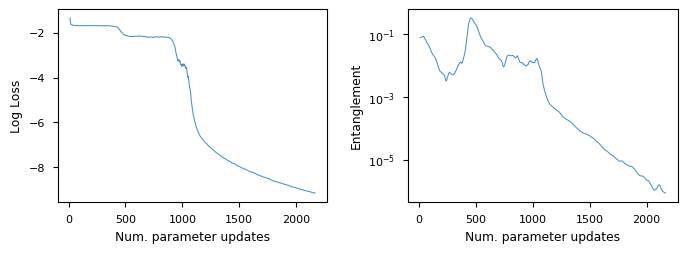

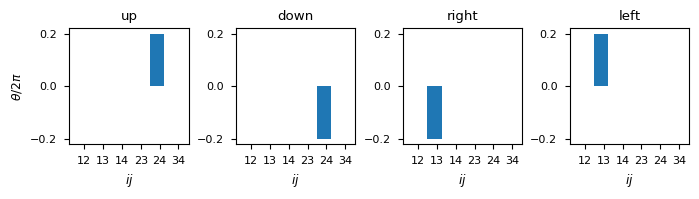

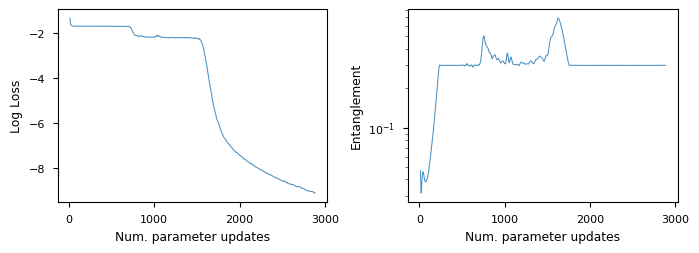

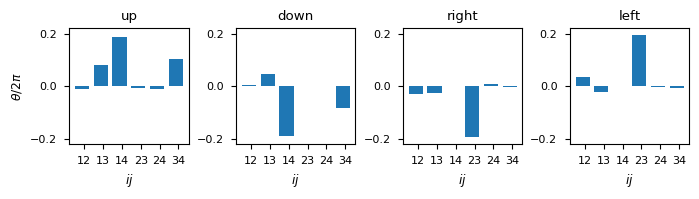

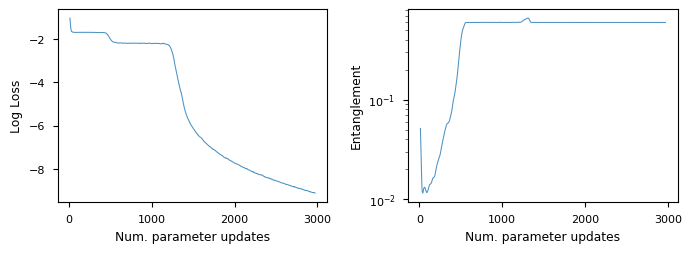

...

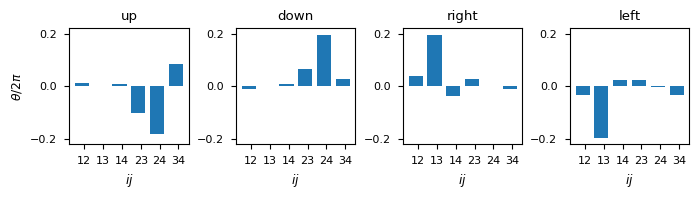

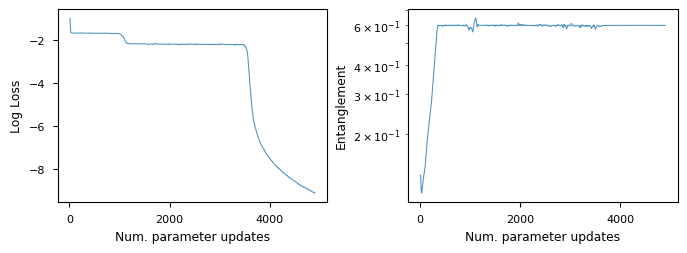

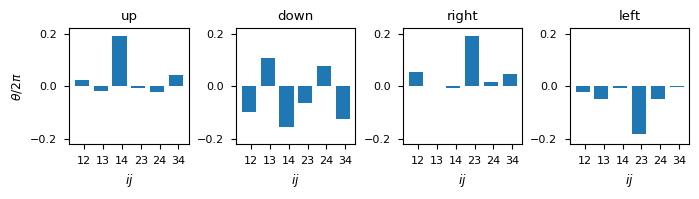

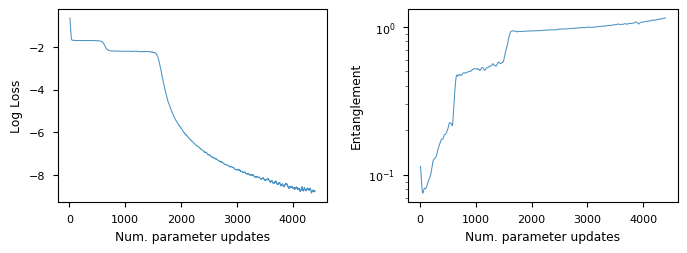

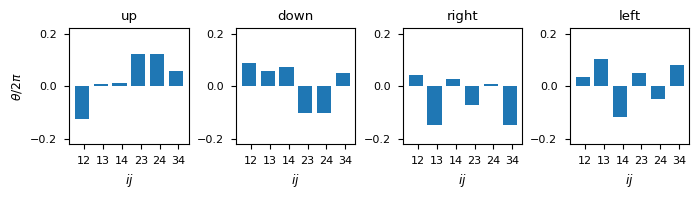

In [174]:
N_SEEDS = 100
for k in range(N_SEEDS):
    for ent_target, label, weight, lr in zip(targets, labels, weights, lrs):
        rep_learner = RepresentationLearner(grid_dim=5,
                                            latent_dim=4,
                                            decoder_hid_dim=[32],
                                            encoder_hid_dim=[32],
                                            lr_dec=lr,
                                            lr_rep=lr,
                                            lr_enc=lr,
                                            ent_loss_weight=weight,
                                            ent_loss_target = ent_target,
                                            exp_name=os.path.join(exp_folder,str(label)+str(k)))
        rep_learner.learn(10000, batch_eps=4, ep_steps=10, log_freq=50)
        rep_learner.plot_training(save=True);
        rep_learner.plot_representations(save=True);
        rep_learner.save()

In [175]:
for ent_target, label in zip(targets, labels):
    for k in range(N_SEEDS):
        rep_learner = RepresentationLearner(grid_dim=5,
                                        latent_dim=4,
                                        decoder_hid_dim=[32],
                                        encoder_hid_dim=[32],
                                        lr_dec=2e-2,
                                        lr_rep=2e-2,
                                        lr_enc=5e-2,
                                        ent_loss_weight=1e-2,
                                        ent_loss_target = ent_target,
                                        exp_name=os.path.join(exp_folder,str(label)+str(k)))
        
        rep_learner.load(os.path.join("_data",exp_folder,str(label)+str(k),"rep_learner.pth"))
        #rep_learner.plot_representations(save=False)
        
        scores = rep_learner.test(n_eps=50,
                                  eps_steps=500,
                                  metric_fn = F.binary_cross_entropy,
                                  save_scores=True,
                                  show_plots=False,
                                  save_plots=False)
        
        #fig, (ax1) = plt.subplots(1, 1, figsize=(4, 2.5), gridspec_kw={"wspace":0.05}, sharey=True)

        x_label = "Timestep"
        y_label = "Loss"

        time_steps = range(scores.shape[1])
        """
        for s in scores:
            ax1.plot(time_steps, s)
        ax1.set_xlabel(x_label)
        ax1.set_ylabel(y_label)
        ax1.set_title("Individual episodes")
        """

Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min0/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min0/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min1/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min1/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min2/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min2/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min3/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min3/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min4/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min4/test/scores.pkl


Scores saved to _data/entanglement_targets_20step4batch_long_train/min41/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min42/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min42/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min43/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min43/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min44/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min44/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min45/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min45/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min46/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/min82/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min83/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min83/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min84/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min84/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min85/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min85/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min86/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/min86/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min87/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/0.323/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.324/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.324/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.325/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.325/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.326/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.326/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.327/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.327/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.328/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/0.364/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.365/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.365/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.366/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.366/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.367/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.367/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.368/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.368/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.369/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/0.65/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.66/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.66/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.67/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.67/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.68/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.68/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.69/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.69/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.610/rep_learner.pth

Scores saved to _data/entanglement_targets_20step4batch_long_train/0.646/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.647/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.647/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.648/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.648/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.649/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.649/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.650/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.650/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.651/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/0.687/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.688/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.688/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.689/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.689/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.690/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.690/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.691/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/0.691/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.692/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/max28/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max29/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max29/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max30/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max30/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max31/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max31/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max32/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max32/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max33/rep_le

Scores saved to _data/entanglement_targets_20step4batch_long_train/max69/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max70/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max70/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max71/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max71/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max72/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max72/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max73/rep_learner.pth
Scores saved to _data/entanglement_targets_20step4batch_long_train/max73/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max74/rep_le

So now we can visualise how the different learnt representations perform.

In [176]:
exp_label = "Target"
x_label = "Number of steps"
y_label = "Reconstruction Error"
seed = "Seed"

df = pd.DataFrame(columns=[exp_label, x_label, y_label, seed])

for ent_target, label in zip(targets, labels):
    for k in range(N_SEEDS):
        score_save_path = os.path.join("_data",exp_folder,str(label)+str(k),"test/scores.pkl")
        scores = pickle.load(open(score_save_path,'rb'))
        print("loaded scores from", score_save_path)
        
        exps = [label]*scores.shape[1]
        time_steps = range(scores.shape[1])

        rep_learner = RepresentationLearner(grid_dim=5,
                                        latent_dim=4,
                                        decoder_hid_dim=[32],
                                        encoder_hid_dim=[32],
                                        lr_dec=2e-2,
                                        lr_rep=2e-2,
                                        lr_enc=5e-2,
                                        ent_loss_weight=1e-2,
                                        ent_loss_target = ent_target,
                                        exp_name=os.path.join(exp_folder,str(label)+str(k)))
        
        rep_learner.load(os.path.join("_data",exp_folder,str(label)+str(k),"rep_learner.pth"))
        
        print(k, label)
        for s in scores:
            df = df.append(pd.DataFrame({exp_label:exps, x_label:time_steps, y_label:s, seed:k}))


loaded scores from _data/entanglement_targets_20step4batch_long_train/min0/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min0/rep_learner.pth
0 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min1/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min1/rep_learner.pth
1 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min2/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min2/rep_learner.pth
2 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min3/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min3/rep_learner.pth
3 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min4/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step

loaded scores from _data/entanglement_targets_20step4batch_long_train/min39/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min39/rep_learner.pth
39 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min40/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min40/rep_learner.pth
40 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min41/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min41/rep_learner.pth
41 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min42/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min42/rep_learner.pth
42 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min43/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/min78/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min78/rep_learner.pth
78 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min79/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min79/rep_learner.pth
79 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min80/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min80/rep_learner.pth
80 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min81/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/min81/rep_learner.pth
81 min
loaded scores from _data/entanglement_targets_20step4batch_long_train/min82/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/0.317/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.317/rep_learner.pth
17 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.318/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.318/rep_learner.pth
18 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.319/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.319/rep_learner.pth
19 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.320/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.320/rep_learner.pth
20 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.321/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/0.356/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.356/rep_learner.pth
56 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.357/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.357/rep_learner.pth
57 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.358/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.358/rep_learner.pth
58 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.359/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.359/rep_learner.pth
59 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.360/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/0.395/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.395/rep_learner.pth
95 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.396/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.396/rep_learner.pth
96 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.397/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.397/rep_learner.pth
97 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.398/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.398/rep_learner.pth
98 0.3
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.399/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/0.634/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.634/rep_learner.pth
34 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.635/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.635/rep_learner.pth
35 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.636/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.636/rep_learner.pth
36 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.637/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.637/rep_learner.pth
37 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.638/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/0.673/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.673/rep_learner.pth
73 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.674/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.674/rep_learner.pth
74 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.675/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.675/rep_learner.pth
75 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.676/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/0.676/rep_learner.pth
76 0.6
loaded scores from _data/entanglement_targets_20step4batch_long_train/0.677/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/max12/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max12/rep_learner.pth
12 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max13/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max13/rep_learner.pth
13 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max14/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max14/rep_learner.pth
14 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max15/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max15/rep_learner.pth
15 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max16/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/max51/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max51/rep_learner.pth
51 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max52/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max52/rep_learner.pth
52 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max53/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max53/rep_learner.pth
53 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max54/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max54/rep_learner.pth
54 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max55/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

loaded scores from _data/entanglement_targets_20step4batch_long_train/max90/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max90/rep_learner.pth
90 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max91/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max91/rep_learner.pth
91 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max92/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max92/rep_learner.pth
92 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max93/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_targets_20step4batch_long_train/max93/rep_learner.pth
93 max
loaded scores from _data/entanglement_targets_20step4batch_long_train/max94/test/scores.pkl
Loaded RepresentationLearner state from _data/entanglement_t

In [179]:
df_by_seed = df.groupby(["Number of steps","Seed","Target"]).mean().reset_index()

Saved to _data/entanglement_targets_20step4batch_long_train/performance_comp(.pdf/.png)
Saved to _data/entanglement_targets_20step4batch_long_train/performance_comp_log(.pdf/.png)


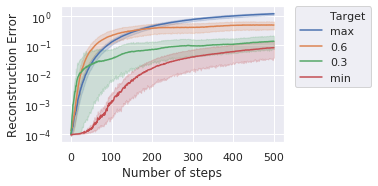

In [182]:
fig, (ax1) = plt.subplots(1, 1, figsize=(4, 2.5))
    
sns.lineplot(x=x_label, y=y_label, hue=exp_label, data=df_by_seed, ax=ax1, hue_order = ['max',0.6,0.3,'min'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

fig_fname = os.path.join("_data",exp_folder,"performance_comp")
plt.savefig(fig_fname + ".pdf", bbox_inches='tight')
plt.savefig(fig_fname + ".png", bbox_inches='tight')
print("Saved to", fig_fname+"(.pdf/.png)")

ax1.set_yscale("log")

fig_fname = os.path.join("_data",exp_folder,"performance_comp_log")
plt.savefig(fig_fname + ".pdf", bbox_inches='tight')
plt.savefig(fig_fname + ".png", bbox_inches='tight')
print("Saved to", fig_fname+"(.pdf/.png)")

**Here we look at training behavior across different seeds: there is quite a lot of variation**

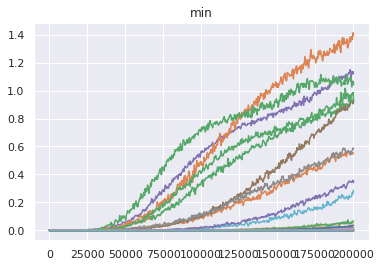

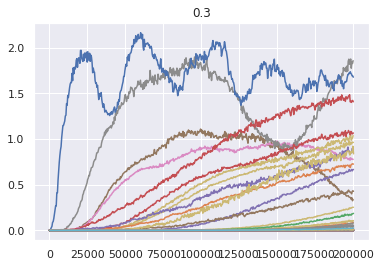

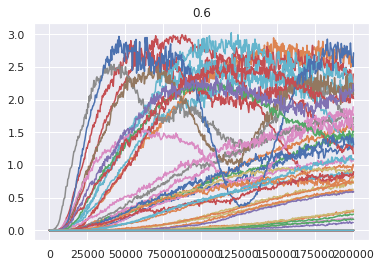

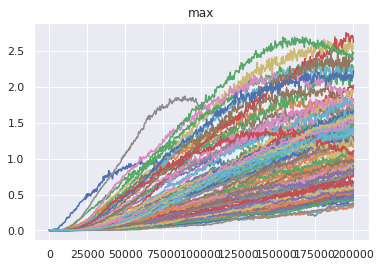

In [178]:

df_min = df_by_seed.loc[df_by_seed['Target']=='min']
for i in range(N_SEEDS):
    seed_data = df_min.loc[df_min['Seed']==i]
    plt.plot(seed_data['Reconstruction Error'])
plt.title('min')
plt.show()

df_03 = df_by_seed.loc[df_by_seed['Target']==0.3]
for i in range(N_SEEDS):
    seed_data = df_03.loc[df_03['Seed']==i]
    plt.plot(seed_data['Reconstruction Error'])
plt.title('0.3')
plt.show()

df_06 = df_by_seed.loc[df_by_seed['Target']==0.6]
for i in range(N_SEEDS):
    seed_data = df_06.loc[df_06['Seed']==i]
    plt.plot(seed_data['Reconstruction Error'])
plt.title('0.6')
plt.show()

df_max = df_by_seed.loc[df_by_seed['Target']=='max']
for i in range(N_SEEDS):
    seed_data = df_max.loc[df_max['Seed']==i]
    plt.plot(seed_data['Reconstruction Error'])
plt.title('max')
plt.show()